<a href="https://colab.research.google.com/github/Rmm6699/HW/blob/master/SinoPac_Final_student_117064.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Download data and load as panda dataframe

## Download data

In [ ]:
!wget -q -O "2890_stockinfo.csv" "https://docs.google.com/uc?export=download&id=1Qal8gF--2sL8M5DKJQMe6E9jsaHFcvTi"

In [ ]:
import pandas as pd
stock_no = '2890'
stock_data = pd.read_csv('/content/2890_stockinfo.csv',index_col=[0], parse_dates=[0], dayfirst=True, usecols=[i for i in range(1,11)])
stock_data

,stock_id,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,
2008-01-02,2890,12748820,153857198,12.25,12.25,11.85,11.85,-0.30,1315
2008-01-03,2890,11841342,139093030,11.70,11.90,11.60,11.85,0.00,1350
2008-01-04,2890,19647612,237797162,11.80,12.35,11.70,12.35,0.50,2303
2008-01-07,2890,13445931,163369158,12.15,12.30,12.05,12.05,-0.30,1261
2008-01-08,2890,10755517,131890117,12.10,12.40,12.10,12.30,0.25,1386
...,...,...,...,...,...,...,...,...,...
2022-10-03,2890,18146749,307800394,17.10,17.20,16.85,16.85,-0.45,5373
2022-10-04,2890,16596464,281035891,17.00,17.10,16.80,16.95,0.10,3779
2022-10-05,2890,14186412,240887722,17.00,17.10,16.90,16.95,0.00,3013


## (Optional) Download data using FinMind API (Advanced topic)


In [ ]:
pip install FinMind

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from FinMind.data import DataLoader
stock_no = '2890'
dl = DataLoader()
stock_data = dl.taiwan_stock_daily(stock_id=stock_no, start_date='2008-01-01')
stock_data.set_index('date',inplace=True)
stock_data

,stock_id,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,
2008-01-02,2890,12748820,153857198,12.25,12.25,11.85,11.85,-0.30,1315
2008-01-03,2890,11841342,139093030,11.70,11.90,11.60,11.85,0.00,1350
2008-01-04,2890,19647612,237797162,11.80,12.35,11.70,12.35,0.50,2303
2008-01-07,2890,13445931,163369158,12.15,12.30,12.05,12.05,-0.30,1261
2008-01-08,2890,10755517,131890117,12.10,12.40,12.10,12.30,0.25,1386
...,...,...,...,...,...,...,...,...,...
2022-10-17,2890,16648927,274164891,16.50,16.60,16.35,16.50,-0.10,4463
2022-10-18,2890,11566629,192809948,16.70,16.80,16.50,16.70,0.20,2788
2022-10-19,2890,25415889,418255665,16.70,16.75,16.20,16.50,-0.20,7497


# Data Cleaning

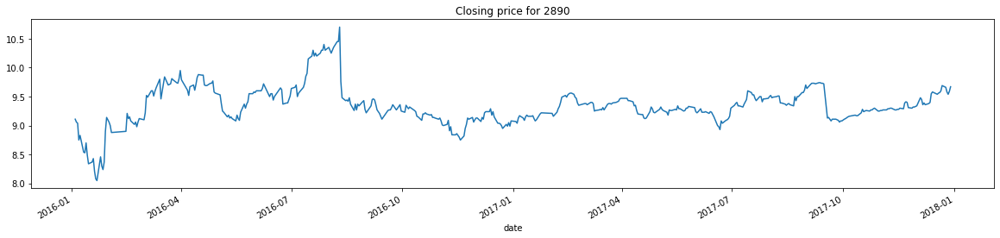

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
stock_data = stock_data[['close']].loc['2016-01-01':'2017-12-31'].dropna()
stock_data.plot(title=f"Closing price for {stock_no}", figsize=(20,4), legend=None)

In [ ]:
stock_data_train = stock_data[:stock_data.size-30]
stock_data_test = stock_data[stock_data.size-30:stock_data.size]

# Predicting closing price with ARIMA

In [ ]:
!pip -q uninstall statsmodels -y
!pip -q install statsmodels 
!pip -q install pmdarima

     |████████████████████████████████| 9.8 MB 13.7 MB/s 
     |████████████████████████████████| 1.8 MB 14.2 MB/s 


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import arma_generate_sample
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

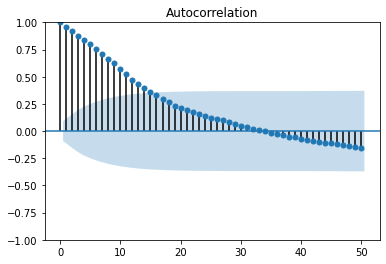

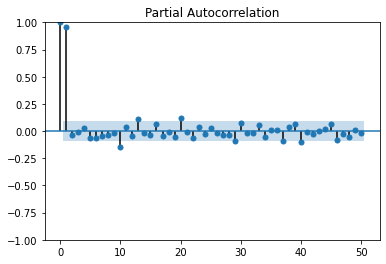

In [ ]:
acf = plot_acf(stock_data_train, lags = 50)
pacf = plot_pacf(stock_data_train, lags = 50)

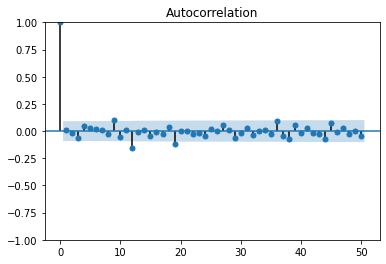

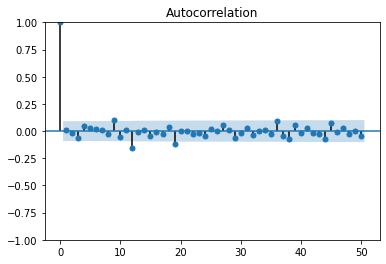

In [ ]:
stock_data_train_diff = stock_data_train.diff().dropna()
diff_acf1 = plot_acf(stock_data_train_diff, lags = 50)
diff_pacf1 = plot_acf(stock_data_train_diff, lags = 50)

**Please Determine the order of ARIMA**

In [ ]:
#Auto-ARIMA
from pmdarima.arima import auto_arima

arima_model = auto_arima(stock_data_train, start_p = 0, d=5, start_q = 0,      
                          max_p = 20, max_q = 20, max_d=10,              
                          seasonal = False, 
                          trace = True, 
                          error_action ='ignore',   
                          suppress_warnings = True,  
                          stepwise = True, n_fits=50)  

Performing stepwise search to minimize aic
 ARIMA(0,5,0)(0,0,0)[0]             : AIC=1107.452, Time=0.24 sec
 ARIMA(1,5,0)(0,0,0)[0]             : AIC=620.186, Time=0.29 sec
 ARIMA(0,5,1)(0,0,0)[0]             : AIC=inf, Time=0.85 sec
 ARIMA(2,5,0)(0,0,0)[0]             : AIC=392.625, Time=0.39 sec
 ARIMA(3,5,0)(0,0,0)[0]             : AIC=227.435, Time=0.49 sec
 ARIMA(4,5,0)(0,0,0)[0]             : AIC=97.217, Time=0.80 sec
 ARIMA(5,5,0)(0,0,0)[0]             : AIC=12.459, Time=1.12 sec
 ARIMA(6,5,0)(0,0,0)[0]             : AIC=-106.998, Time=1.36 sec
 ARIMA(7,5,0)(0,0,0)[0]             : AIC=-147.569, Time=3.02 sec
 ARIMA(8,5,0)(0,0,0)[0]             : AIC=-212.645, Time=2.68 sec
 ARIMA(9,5,0)(0,0,0)[0]             : AIC=-233.973, Time=2.58 sec
 ARIMA(10,5,0)(0,0,0)[0]             : AIC=-275.812, Time=3.20 sec
 ARIMA(11,5,0)(0,0,0)[0]             : AIC=-334.403, Time=2.71 sec
 ARIMA(12,5,0)(0,0,0)[0]             : AIC=-357.516, Time=2.35 sec
 ARIMA(13,5,0)(0,0,0)[0]             : AIC

In [ ]:
ARMA_model = ARIMA(stock_data_train, order=[19,5,2]) #Please find the best order of ARIMA
ARMA_model_fit = ARMA_model.fit()
print(ARMA_model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:606: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:                  close   No. Observations:                  460
Model:                ARIMA(19, 5, 2)   Log Likelihood                 355.936
Date:                Sat, 22 Oct 2022   AIC                           -667.872
Time:                        15:23:24   BIC                           -577.226
Sample:                             0   HQIC                          -632.161
                                - 460                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.7770      0.049    -36.310      0.000      -1.873      -1.681
ar.L2         -2.4667      0.104    -23.727      0.000      -2.670      -2.263
ar.L3         -2.9942      0.168    -17.822      0.0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:843: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



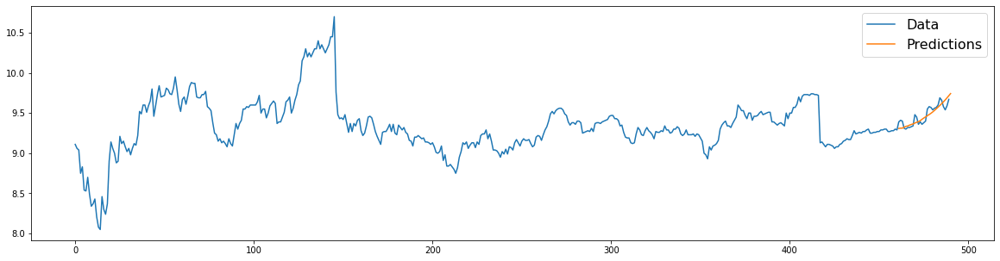

In [ ]:
pred_start = stock_data.size - 29
pred_end = stock_data.size
ARMA_predictions = ARMA_model_fit.predict(start=pred_start, end=pred_end)
plt.figure(figsize=(20,5))
plt.plot(stock_data['close'].values)
plt.plot(ARMA_predictions)
plt.legend(('Data', 'Predictions'), fontsize=16)

In [ ]:
ARMA_pred_mse = mean_squared_error(stock_data_test.values, ARMA_predictions)
ARMA_pred_rmse= np.sqrt(ARMA_pred_mse)
print("ARMA MSE  : ", ARMA_pred_mse)
print('ARMA RMSE : ', ARMA_pred_rmse)

ARMA MSE  :  0.004369726256646886
ARMA RMSE :  0.06610390500300936


# Predicting closing price with Support Vector Regression

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error

In [ ]:
pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 348 kB 11.6 MB/s 
     |████████████████████████████████| 209 kB 23.1 MB/s 
     |████████████████████████████████| 81 kB 6.8 MB/s 
     |████████████████████████████████| 78 kB 3.6 MB/s 
     |████████████████████████████████| 147 kB 11.5 MB/s 
     |████████████████████████████████| 50 kB 3.2 MB/s 
     |████████████████████████████████| 112 kB 45.4 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=f048e7bd6ef5d740462bc9c72eb1e16adf3d7fd31467ccfb88de20798dcffae1
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
import optuna
from sklearn.model_selection import cross_validate

In [ ]:
SVR_stock_data = stock_data.reset_index(drop=True)
train_data = SVR_stock_data.iloc[:449].values.flatten()
test_data = SVR_stock_data.iloc[449:].values.flatten()

def to_sequences(dataset, seq_size=1):
    x = []
    y = []

    for i in range(len(dataset)-seq_size-1):
        #print(i)
        window = dataset[i:(i+seq_size)]
        x.append(window)
        y.append(dataset[i+seq_size])
        
    return np.array(x),np.array(y)

seq_size = 10
trainX, trainY = to_sequences(train_data, seq_size)
testX, testY = to_sequences(test_data, seq_size)
print(trainX.shape, testX.shape)

(438, 10) (30, 10)


In [ ]:
def objective(trial):

    params = {
            'C': trial.suggest_int('C', 1, 10000),
            'kernel' : trial.suggest_categorical('kernel', ['rbf','linear','poly','sigmoid']),
            'gamma' : trial.suggest_categorical('gamma', ['auto','scale']),
            'degree': trial.suggest_int("degree",1,3)
        } 

    SVR_optuna = SVR(**params)
    
    SVR_optuna.fit(trainX,trainY)
    accuracy = SVR_optuna.score(testX,testY)
    
    return accuracy


In [ ]:
# Create Study object
study_cat = optuna.create_study(direction="maximize")
# Optimize the study, use more trials to obtain better result, use less trials to be more cost-efficient
study_cat.optimize(objective, n_trials=1000,n_jobs=-1) # Use more 

[I 2022-10-22 01:44:22,884] A new study created in memory with name: no-name-2e1bc584-1920-41ce-a7a7-b3814a4f4b14
[I 2022-10-22 01:44:23,965] Trial 0 finished with value: 0.7734153269965857 and parameters: {'C': 1790, 'kernel': 'poly', 'gamma': 'auto', 'degree': 1}. Best is trial 0 with value: 0.7734153269965857.
[I 2022-10-22 01:44:31,946] Trial 1 finished with value: -6.1374146147131174 and parameters: {'C': 4795, 'kernel': 'linear', 'gamma': 'scale', 'degree': 1}. Best is trial 0 with value: 0.7734153269965857.
[I 2022-10-22 01:44:31,974] Trial 3 finished with value: -1.0362978091347959 and parameters: {'C': 9195, 'kernel': 'sigmoid', 'gamma': 'scale', 'degree': 2}. Best is trial 0 with value: 0.7734153269965857.
[I 2022-10-22 01:44:32,140] Trial 2 finished with value: -5.406850390302896 and parameters: {'C': 7018, 'kernel': 'linear', 'gamma': 'auto', 'degree': 2}. Best is trial 0 with value: 0.7734153269965857.
[I 2022-10-22 01:44:43,031] Trial 4 finished with value: -5.67829165461

In [ ]:
best_params = study_cat.best_params
best_score = study_cat.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.8323830269214937

Optimized parameters: {'C': 6295, 'kernel': 'rbf', 'gamma': 'auto', 'degree': 2}



In [ ]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_cat)

**Please determine the best kernel and regularization term**

In [ ]:
#SVR
svr_rbf = SVR(kernel='rbf', C=6295,gamma='auto') #Please determine the best kernel and regularization term
svr_rbf.fit(trainX, trainY)
svr_rbf_confidence = svr_rbf.score(testX, testY)
print('svr_rbf accuracy (Confidence): ' , svr_rbf_confidence)

trainPredict = svr_rbf.predict(trainX)
testPredict = svr_rbf.predict(testX)

svr_rbf accuracy (Confidence):  0.8323830269214937


In [ ]:
#Training MSE
train_pred_mse = mean_squared_error(trainY, trainPredict)
print("train pred MSE  : ", train_pred_mse)
#Training RMSE
train_pred_rmse = np.sqrt(train_pred_mse)
print("train pred RMSE : ", train_pred_rmse)

print("------------------------------------------")
#Testing MSE
SVR_pred_mse = mean_squared_error(testY, testPredict)
print("test pred MSE   : ", SVR_pred_mse)
#Testing RMSE
SVR_pred_rmse = np.sqrt(SVR_pred_mse)
print("test pred RMSE  : ", SVR_pred_rmse)

train pred MSE  :  0.005202804666428116
train pred RMSE :  0.07213046975050222
------------------------------------------
test pred MSE   :  0.002407426712002223
test pred RMSE  :  0.049065534869215714


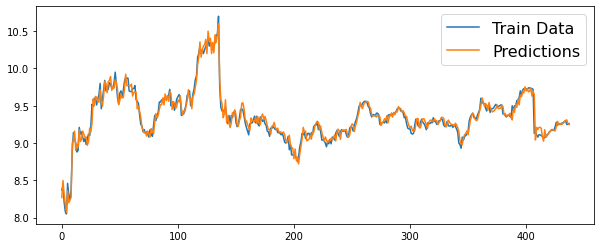

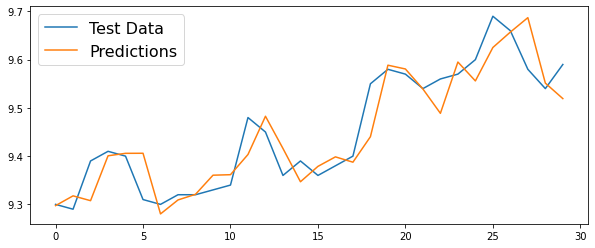

In [ ]:
plt.figure(figsize=(10,4))
plt.plot(trainY)
plt.plot(trainPredict)
plt.legend(('Train Data', 'Predictions'), fontsize=16)

plt.figure(figsize=(10,4))
plt.plot(testY)
plt.plot(testPredict)
plt.legend(('Test Data', 'Predictions'), fontsize=16)

# Predicting closing price with Simple NN

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [ ]:
NN_stock_data = stock_data.reset_index(drop=True)

data_df = pd.DataFrame(NN_stock_data)
scaler = MinMaxScaler()
scaler.fit(data_df)
NN_stock_data = scaler.transform(NN_stock_data)

train_data = NN_stock_data[:449]
test_data = NN_stock_data[449:]

In [ ]:
def to_sequences(dataset, seq_size=1):
    x = []
    y = []

    for i in range(len(dataset)-seq_size-1):
        #print(i)
        window = dataset[i:(i+seq_size), 0]
        x.append(window)
        y.append(dataset[i+seq_size, 0])
        
    return np.array(x),np.array(y)

seq_size = 20
#Train and Test data
trainX, trainY = to_sequences(train_data, seq_size)
testX, testY = to_sequences(test_data, seq_size)

In [ ]:
from tensorflow import keras
from keras.backend import clear_session

In [ ]:
def objective(trial):
    # Clear clutter from previous Keras session graphs.
    clear_session()
    model = Sequential()
    units1 = trial.suggest_categorical("units1", [32, 64, 128, 256, 512])
    model.add(
        Dense(
            name = "dense_1",
            units=units1,
            input_dim=seq_size,
            #activation=trial.suggest_categorical("activation1", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation1", ['relu'])
             )
    )
    units2 = trial.suggest_categorical("units2", [16,32, 64, 128, 256])
    model.add(
        Dense(
            name = "dense_2",
            units=units2,
            #activation=trial.suggest_categorical("activation2", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation2", ['relu'])
            )
    )
    model.add(
        Dense(
            name = "dense_last",
            units=1,
            #activation=trial.suggest_categorical("activation3", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation3", ['relu'])
        )        
    )          
    
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
    opt = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        loss="mean_squared_error",
        optimizer=opt,
        metrics=["mse"],
    )

    epochs = trial.suggest_categorical("epochs", [30,40,50,60,70,80,90,100,150,200])
    model.fit(trainX, trainY, validation_split=0.1, verbose=1, epochs=epochs)


    trainPredict = model.predict(trainX)
    testPredict = model.predict(testX)

    trainPredict = scaler.inverse_transform(trainPredict)
    trainY_inverse = scaler.inverse_transform([trainY])
    testPredict = scaler.inverse_transform(testPredict)
    testY_inverse = scaler.inverse_transform([testY])


    #Training MSE
    train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
    print("train pred MSE: ", train_pred_mse)
    #Training RMSE
    train_pred_rmse = np.sqrt(train_pred_mse)
    print("train pred RMSE: ", train_pred_rmse)

    #Testing MSE
    NN_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
    print("test pred MSE: ", NN_pred_mse)
    #Testing RMSE
    NN_pred_rmse = np.sqrt(NN_pred_mse)
    print("test pred RMSE: ", NN_pred_rmse)

    return NN_pred_rmse

In [ ]:
# Create Study object
study_nn = optuna.create_study(direction="minimize")
# Optimize the study, use more trials to obtain better result, use less trials to be more cost-efficient
study_nn.optimize(objective, n_trials=200,n_jobs=-1) # Use more 

[I 2022-10-22 07:23:50,959] A new study created in memory with name: no-name-7b57e125-e6ab-4ef8-9560-da1eee2eb77b


Epoch 1/70
Epoch 1/80
13/13 [==============================] - 1s 28ms/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 2/80
Epoch 2/70
13/13 [==============================] - 0s 7ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0139 - val_mse: 0.0139
Epoch 3/80
13/13 [==============================] - 0s 9ms/step - loss: 0.1549 - mse: 0.1549 - val_loss: 0.1104 - val_mse: 0.1104
Epoch 3/70
13/13 [==============================] - 0s 9ms/step - loss: 0.0062 - mse: 0.0062 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 4/80
13/13 [==============================] - 0s 9ms/step - loss: 0.1135 - mse: 0.1135 - val_loss: 0.0768 - val_mse: 0.0768
Epoch 4/70
13/13 [==============================] - 0s 9ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 5/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0797 - mse: 0.0797 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 5/70
13/13 [==============================] - 0s 9ms/step - l

[I 2022-10-22 07:24:00,781] Trial 0 finished with value: 0.0753383772231517 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 6.881125536582263e-05, 'epochs': 70}. Best is trial 0 with value: 0.0753383772231517.


train pred MSE:  0.01701242025781287
train pred RMSE:  0.13043166892213282
test pred MSE:  0.005675871082617903
test pred RMSE:  0.0753383772231517
13/13 [==============================] - 0s 20ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 72/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 73/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 74/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 75/80
13/13 [==============================] - 0s 8ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 76/80
13/13 [==============================] - 0s 6ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 77/80
13/13 [==============================] - 0s 8ms/step - loss: 0

[I 2022-10-22 07:24:02,312] Trial 1 finished with value: 0.16147495957842561 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.005183107488525305, 'epochs': 80}. Best is trial 0 with value: 0.0753383772231517.


train pred MSE:  0.023200878654661323
train pred RMSE:  0.15231834641520148
test pred MSE:  0.026074162570854188
test pred RMSE:  0.16147495957842561
13/13 [==============================] - 0s 20ms/step - loss: 0.0077 - mse: 0.0077 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 6/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0065 - mse: 0.0065 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 7/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 8/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 9/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 10/80
13/13 [==============================] - 0s 7ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 11/80
13/13 [==============================] - 0s 9ms/step - loss: 0.00

[I 2022-10-22 07:24:08,389] Trial 3 finished with value: 0.08399373862993878 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 3.461171079036479e-05, 'epochs': 40}. Best is trial 0 with value: 0.0753383772231517.


train pred MSE:  0.02610491914169636
train pred RMSE:  0.1615701678581054
test pred MSE:  0.007054948129034469
test pred RMSE:  0.08399373862993878
13/13 [==============================] - 0s 13ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 55/80
Epoch 1/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 56/80
13/13 [==============================] - 0s 8ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 57/80
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 58/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 59/80
13/13 [==============================] - 0s 6ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 60/80
13/13 [==============================] - 0s 9ms/ste

[I 2022-10-22 07:24:11,988] Trial 2 finished with value: 0.07019678114531176 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 9.970404711381974e-05, 'epochs': 80}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  0.008968671734949245
train pred RMSE:  0.09470307141243754
test pred MSE:  0.004927588083162797
test pred RMSE:  0.07019678114531176
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 23/100
Epoch 1/30
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 24/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 25/100
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 26/100
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 27/100
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 28/100
13/13 [==============================] - 0s 

[I 2022-10-22 07:24:18,161] Trial 5 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0039060258794840737, 'epochs': 30}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 82/100
Epoch 1/40
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 83/100
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 84/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 85/100
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 86/100
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 87/100
13/13 [==============================] - 0s 7ms/step 

[I 2022-10-22 07:24:29,369] Trial 6 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00035986662460815635, 'epochs': 40}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/100
 1/13 [=>............................] - ETA: 5s - loss: 0.2206 - mse: 0.2206

[I 2022-10-22 07:24:29,945] Trial 4 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.014696649307211263, 'epochs': 100}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 41ms/step - loss: 0.1720 - mse: 0.1720 - val_loss: 0.1077 - val_mse: 0.1077
Epoch 2/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0992 - mse: 0.0992 - val_loss: 0.0558 - val_mse: 0.0558
Epoch 3/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0525 - mse: 0.0525 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 4/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 5/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0127 - mse: 0.0127 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 6/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0091 - mse: 0.0091 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 7/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0086 -

[I 2022-10-22 07:24:50,785] Trial 7 finished with value: 0.07107180015256814 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 2.5799395880678843e-05, 'epochs': 100}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  0.010645776561433755
train pred RMSE:  0.10317837254693328
test pred MSE:  0.005051200776926586
test pred RMSE:  0.07107180015256814
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 189/200
Epoch 1/80
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 190/200
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 191/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 192/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 193/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 194/200
13/13 [==============================]

[I 2022-10-22 07:24:52,762] Trial 8 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.026826912085488836, 'epochs': 200}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 23ms/step - loss: 0.0727 - mse: 0.0727 - val_loss: 0.0559 - val_mse: 0.0559
Epoch 10/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0576 - mse: 0.0576 - val_loss: 0.0434 - val_mse: 0.0434
Epoch 11/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0333 - val_mse: 0.0333
Epoch 12/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 13/80
13/13 [==============================] - 0s 6ms/step - loss: 0.0272 - mse: 0.0272 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 14/80
13/13 [==============================] - 0s 7ms/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 15/80
13/13 [==============================] - 0s 8ms/step - loss: 0.0161 - 

[I 2022-10-22 07:25:03,654] Trial 10 finished with value: 0.13372594415861452 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.009273727021296165, 'epochs': 80}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  0.01755997030601102
train pred RMSE:  0.13251403814694887
test pred MSE:  0.01788262814111289
test pred RMSE:  0.13372594415861452
Epoch 1/50
13/13 [==============================] - 1s 14ms/step - loss: 0.1119 - mse: 0.1119 - val_loss: 0.0458 - val_mse: 0.0458
Epoch 2/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0250 - mse: 0.0250 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 3/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0091 - mse: 0.0091 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 4/50
13/13 [==============================] - 0s 6ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 6/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 7/50
13/13 [==============================] - 0s 5ms/step - loss:

[I 2022-10-22 07:25:07,697] Trial 11 finished with value: 0.07422374466704185 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000376036698501543, 'epochs': 50}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  0.007639667735167669
train pred RMSE:  0.08740519283868475
test pred MSE:  0.005509164272398223
test pred RMSE:  0.07422374466704185
Epoch 1/100
13/13 [==============================] - 1s 14ms/step - loss: 0.2170 - mse: 0.2170 - val_loss: 0.1599 - val_mse: 0.1599
Epoch 2/100
13/13 [==============================] - 0s 4ms/step - loss: 0.1597 - mse: 0.1597 - val_loss: 0.1119 - val_mse: 0.1119
Epoch 3/100
13/13 [==============================] - 0s 4ms/step - loss: 0.1128 - mse: 0.1128 - val_loss: 0.0762 - val_mse: 0.0762
Epoch 4/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0785 - mse: 0.0785 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 5/100
13/13 [==============================] - 0s 4ms/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0339 - val_mse: 0.0339
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0366 - mse: 0.0366 - val_loss: 0.0227 - val_mse: 0.0227
Epoch 7/100
13/13 [==============================] - 0s 5ms/ste

[I 2022-10-22 07:25:12,459] Trial 9 finished with value: 0.07859892633851616 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 2.8699770426722226e-05, 'epochs': 80}. Best is trial 2 with value: 0.07019678114531176.


train pred MSE:  0.017411737407393442
train pred RMSE:  0.13195354261024386
test pred MSE:  0.0061777912215674885
test pred RMSE:  0.07859892633851616
13/13 [==============================] - 0s 20ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 60/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 61/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 62/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 63/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 64/100
13/13 [==============================] - 0s 7ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 65/100
13/13 [==============================] - 0s 9ms/step

[I 2022-10-22 07:25:18,595] Trial 12 finished with value: 0.06883121263251782 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.5837243304557536e-05, 'epochs': 100}. Best is trial 12 with value: 0.06883121263251782.


train pred MSE:  0.013316976146450265
train pred RMSE:  0.11539920340474741
test pred MSE:  0.00473773583246288
test pred RMSE:  0.06883121263251782
13/13 [==============================] - 0s 14ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 38/150
Epoch 1/60
13/13 [==============================] - 0s 11ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 39/150
13/13 [==============================] - 0s 19ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 40/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 41/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 42/150
13/13 [==============================] - 0s 6ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 43/150
13/13 [==============================] - 0s

[I 2022-10-22 07:25:28,572] Trial 14 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.009536673821588e-05, 'epochs': 60}. Best is trial 12 with value: 0.06883121263251782.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 11ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 107/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 108/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 109/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 110/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 111/150
13/13 [==============================] - 0s 9ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 112/150
13/13 [==============================] - 0s 7ms/step - l

[I 2022-10-22 07:25:35,146] Trial 13 finished with value: 0.0711225701648464 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.076946580940404e-05, 'epochs': 150}. Best is trial 12 with value: 0.06883121263251782.


train pred MSE:  0.011385159645934912
train pred RMSE:  0.10670126356297245
test pred MSE:  0.005058419986853498
test pred RMSE:  0.0711225701648464
13/13 [==============================] - 0s 23ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 41/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 42/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 43/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 44/150
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 45/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 46/150
13/13 [==============================] - 0s 9ms/step - 

[I 2022-10-22 07:25:49,087] Trial 16 finished with value: 0.0710887163992333 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0001073552355971175, 'epochs': 90}. Best is trial 12 with value: 0.06883121263251782.


train pred MSE:  0.01177356059000718
train pred RMSE:  0.10850603941720101
test pred MSE:  0.0050536055992906215
test pred RMSE:  0.0710887163992333
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/150
Epoch 1/100
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 143/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 144/150
13/13 [=============================

[I 2022-10-22 07:25:51,207] Trial 15 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00015617524306972487, 'epochs': 150}. Best is trial 12 with value: 0.06883121263251782.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 14ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 9/100
Epoch 1/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 10/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 11/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 12/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 13/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 14/100
13/13 [==============================] - 0s 10ms/st

[I 2022-10-22 07:26:04,644] Trial 17 finished with value: 0.06522678387189848 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00023850795934944716, 'epochs': 100}. Best is trial 17 with value: 0.06522678387189848.


train pred MSE:  0.00813651047353422
train pred RMSE:  0.09020260790871969
test pred MSE:  0.004254533334271355
test pred RMSE:  0.06522678387189848
13/13 [==============================] - 0s 21ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 91/100
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 92/100
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 93/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 94/100
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 95/100
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 96/100
13/13 [==============================] - 0s 8ms/step - l

[I 2022-10-22 07:26:12,856] Trial 18 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0015361007458318723, 'epochs': 100}. Best is trial 17 with value: 0.06522678387189848.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 13ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 97/100
Epoch 1/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 98/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 99/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 100/100
1/1 [==============================] - 0s 36ms/step


[I 2022-10-22 07:26:13,905] Trial 19 finished with value: 0.09503671754105991 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.001649633279329257, 'epochs': 100}. Best is trial 17 with value: 0.06522678387189848.


train pred MSE:  0.009815649898215024
train pred RMSE:  0.09907396175693704
test pred MSE:  0.009031977680979204
test pred RMSE:  0.09503671754105991
Epoch 1/100
13/13 [==============================] - 1s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/100
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/100
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/100
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/100
13/13 [==============================] - 0s 10ms/

[I 2022-10-22 07:26:34,394] Trial 20 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0005190888724913934, 'epochs': 100}. Best is trial 17 with value: 0.06522678387189848.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/50
13/13 [==============================] - 1s 14ms/step - loss: 0.0803 - mse: 0.0803 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 2/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0183 - mse: 0.0183 - val_loss: 0.0139 - val_mse: 0.0139
Epoch 3/50
13/13 [==============================] - 0s 4ms/step - loss: 0.0081 - mse: 0.0081 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 4/50
13/13 [==============================] - 0s 5ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 5/50
13/13 [==============================] - 0s 6ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 6/50
13/13 [==============================] - 0s 9ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.002

[I 2022-10-22 07:26:35,582] Trial 21 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.07647906275682317, 'epochs': 100}. Best is trial 17 with value: 0.06522678387189848.


13/13 [==============================] - 0s 19ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 9/50
13/13 [==============================] - 0s 10ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 10/50
13/13 [==============================] - 0s 9ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 11/50
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 12/50
13/13 [==============================] - 0s 9ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 13/50
13/13 [==============================] - 0s 11ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 14/50
13/13 [==============================] - 0s 10ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 15/50
13/13 [==============================] - 1s 26ms/step - loss: 0.1874 - mse: 0.1

[I 2022-10-22 07:26:41,135] Trial 23 finished with value: 0.062460717697586654 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00015537132537205315, 'epochs': 30}. Best is trial 23 with value: 0.062460717697586654.


train pred MSE:  0.010769831652000884
train pred RMSE:  0.10377779941779881
test pred MSE:  0.0039013412552976142
test pred RMSE:  0.062460717697586654
13/13 [==============================] - 0s 14ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 48/50
Epoch 1/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 49/50
13/13 [==============================] - 0s 9ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 50/50
1/1 [==============================] - 0s 30ms/step


[I 2022-10-22 07:26:42,003] Trial 22 finished with value: 0.08003822189475192 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00018967683754218378, 'epochs': 50}. Best is trial 23 with value: 0.062460717697586654.


train pred MSE:  0.008872608737086963
train pred RMSE:  0.09419452604629933
test pred MSE:  0.006406116964073545
test pred RMSE:  0.08003822189475192
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/30
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/30
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/30
13/13 [==============================] - 1s 42ms/step - loss: 0.0512 - mse: 0.0512 - val_loss: 0.0213 - val_mse: 0.0213
Epoch 2/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 3/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0067

[I 2022-10-22 07:26:47,502] Trial 24 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00021269891437431342, 'epochs': 30}. Best is trial 23 with value: 0.062460717697586654.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
14/14 [==============================] - 0s 8ms/step
Epoch 1/30
1/1 [==============================] - 0s 64ms/step


[I 2022-10-22 07:26:47,770] Trial 25 finished with value: 0.12166509120859298 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0007031687211266498, 'epochs': 30}. Best is trial 23 with value: 0.062460717697586654.


train pred MSE:  0.0152118404149754
train pred RMSE:  0.1233362899351825
test pred MSE:  0.014802394418795248
test pred RMSE:  0.12166509120859298
Epoch 1/90
13/13 [==============================] - 1s 28ms/step - loss: 0.0706 - mse: 0.0706 - val_loss: 0.0400 - val_mse: 0.0400
Epoch 2/30
13/13 [==============================] - 1s 28ms/step - loss: 0.1600 - mse: 0.1600 - val_loss: 0.1068 - val_mse: 0.1068
Epoch 2/90
13/13 [==============================] - 0s 9ms/step - loss: 0.0159 - mse: 0.0159 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 3/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0926 - mse: 0.0926 - val_loss: 0.0571 - val_mse: 0.0571
Epoch 4/30
Epoch 3/90
13/13 [==============================] - 0s 9ms/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.0267 - val_mse: 0.0267
Epoch 4/90
13/13 [==============================] - 0s 8ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 6/30
13/13 [==============================] - 0s 12ms

[I 2022-10-22 07:26:53,299] Trial 26 finished with value: 0.08951195075519051 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0007499676275967496, 'epochs': 30}. Best is trial 23 with value: 0.062460717697586654.


13/13 [==============================] - 0s 13ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 33/90
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 34/90
13/13 [==============================] - 0s 12ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 35/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 36/90
13/13 [==============================] - 0s 9ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 37/90
13/13 [==============================] - 0s 7ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 38/90
13/13 [==============================] - 0s 9ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 39/90
13/13 [==============================] - 0s 10ms/step - loss: 0.001

[I 2022-10-22 07:27:09,542] Trial 27 finished with value: 0.06982850243273608 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 5.25505202552584e-05, 'epochs': 90}. Best is trial 23 with value: 0.062460717697586654.


13/13 [==============================] - 0s 15ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 159/200
Epoch 1/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 160/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 161/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 162/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 163/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 164/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 165/200
13/13 [==============================] - 0s 10ms/step 

[I 2022-10-22 07:27:18,521] Trial 29 finished with value: 0.06887975380566198 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 2.716786838800951e-05, 'epochs': 70}. Best is trial 23 with value: 0.062460717697586654.


train pred MSE:  0.011902237373943246
train pred RMSE:  0.10909737565103592
test pred MSE:  0.004744420484328606
test pred RMSE:  0.06887975380566198
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2657 - mse: 0.2657 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2653 - mse: 0.2653 - val_loss: 0.2417 - val_mse: 0.2417
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2566 - mse: 0.2566 - val_loss: 0.2144 - val_mse: 0.2144
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2047 - mse: 0.2047 - val_loss: 0.1550 - val_mse: 0.1550
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1445 - mse: 0.1445 - val_loss: 0.1048 - val_mse: 0.1048
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0982 - mse: 0.0982 - val_loss: 0.0697 - val_mse: 0.0697
Epoch 7/200
13/13 [==============================] - 0s 5ms/ste

[I 2022-10-22 07:27:35,243] Trial 28 finished with value: 0.06036136256449097 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 4.6925555849168345e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009795487255030457
train pred RMSE:  0.09897215393751142
test pred MSE:  0.003643494090641932
test pred RMSE:  0.06036136256449097
Epoch 1/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1290 - mse: 0.1290 - val_loss: 0.0789 - val_mse: 0.0789
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.0375 - val_mse: 0.0375
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0346 - mse: 0.0346 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0164 - mse: 0.0164 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0095 - mse: 0.0095 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0073 - mse: 0.0073 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 7/200
13/13 [==============================] - 0s 4ms/ste

[I 2022-10-22 07:27:39,746] Trial 30 finished with value: 0.08589363483412356 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 5.0122542401191465e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.012849465341266412
train pred RMSE:  0.11335548218443788
test pred MSE:  0.007377716505017765
test pred RMSE:  0.08589363483412356
13/13 [==============================] - 0s 21ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 55/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 56/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 57/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 58/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 59/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 60/200
13/13 [==============================] - 0s 9ms/step - 

[I 2022-10-22 07:28:01,753] Trial 31 finished with value: 0.07648224527603516 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 6.119193174088638e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007816223450159508
train pred RMSE:  0.08840940815410715
test pred MSE:  0.005849533842463601
test pred RMSE:  0.07648224527603516
13/13 [==============================] - 0s 23ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 145/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 146/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 147/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 148/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 149/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 150/200
13/13 [==============================] - 0s 9ms

[I 2022-10-22 07:28:11,085] Trial 33 finished with value: 0.06903884142120839 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 8.05737055909962e-05, 'epochs': 60}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010552153320172165
train pred RMSE:  0.1027236745846456
test pred MSE:  0.00476636162478276
test pred RMSE:  0.06903884142120839
Epoch 1/70
13/13 [==============================] - 1s 14ms/step - loss: 0.2099 - mse: 0.2099 - val_loss: 0.1647 - val_mse: 0.1647
Epoch 2/70
13/13 [==============================] - 0s 5ms/step - loss: 0.1719 - mse: 0.1719 - val_loss: 0.1314 - val_mse: 0.1314
Epoch 3/70
13/13 [==============================] - 0s 5ms/step - loss: 0.1383 - mse: 0.1383 - val_loss: 0.1038 - val_mse: 0.1038
Epoch 4/70
13/13 [==============================] - 0s 5ms/step - loss: 0.1107 - mse: 0.1107 - val_loss: 0.0806 - val_mse: 0.0806
Epoch 5/70
13/13 [==============================] - 0s 7ms/step - loss: 0.0877 - mse: 0.0877 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 6/70
13/13 [==============================] - 0s 5ms/step - loss: 0.0692 - mse: 0.0692 - val_loss: 0.0472 - val_mse: 0.0472
Epoch 7/70
13/13 [==============================] - 0s 4ms/step - loss:

[I 2022-10-22 07:28:21,750] Trial 32 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.797093525937284e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/70
1/1 [==============================] - 0s 24ms/step


[I 2022-10-22 07:28:22,195] Trial 34 finished with value: 0.08117562866869782 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 2.0155410439860317e-05, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.024667782656931328
train pred RMSE:  0.15705980598781893
test pred MSE:  0.006589482689758316
test pred RMSE:  0.08117562866869782
Epoch 1/100
13/13 [==============================] - 1s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/70
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/70
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/70
13/13 [==============================] - 1s 30ms/step - loss: 0.2659 - mse: 0.2659 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/70
13/13 [==============================] - 0s 11ms/step - loss: 0.2656 - mse: 0.2656 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 0s 12ms/st

[I 2022-10-22 07:28:33,881] Trial 35 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00012610860429591153, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 14ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 73/100
Epoch 1/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 74/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 75/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 76/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 77/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 78/100
13/13 [==============================] - 0s 10ms/s

[I 2022-10-22 07:28:38,617] Trial 36 finished with value: 0.07468739877227638 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00012241886456501816, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009617259809193932
train pred RMSE:  0.09806762875278432
test pred MSE:  0.005578207535369033
test pred RMSE:  0.07468739877227638
13/13 [==============================] - 0s 22ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 26/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 27/100
13/13 [==============================] - 0s 13ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 28/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 29/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 30/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 31/100
13/13 [==============================] - 0s 9ms/step 

[I 2022-10-22 07:28:49,831] Trial 38 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0002504865586131372, 'epochs': 40}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/30
13/13 [==============================] - 1s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/30
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/30
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/30
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/30
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/30
13/13 [==============================] - 0s 4ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/30
13/13 [==============================] - 0s 4ms/step - loss: 0.2660

[I 2022-10-22 07:28:52,787] Trial 39 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.5119725766890908e-05, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/200
13/13 [==============================] - 1s 45ms/step - loss: 0.2344 - mse: 0.2344 - val_loss: 0.1989 - val_mse: 0.1989
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2115 - mse: 0.2115 - val_loss: 0.1778 - val_mse: 0.1778
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1903 - mse: 0.1903 - val_loss: 0.1585 - val_mse: 0.1585
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1709 - mse: 0.1709 - val_loss: 0.1409 - val_mse: 0.1409
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1526 - mse: 0.1526 - val_loss: 0.1247 - val_mse: 0.1247
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1357 - mse: 0.1357 - val_loss: 0.1095 - val_mse: 0.1095
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss:

[I 2022-10-22 07:28:55,540] Trial 37 finished with value: 0.0680002977233465 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0002491209769794276, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008331448794008047
train pred RMSE:  0.09127677028690294
test pred MSE:  0.004624040490463762
test pred RMSE:  0.0680002977233465
13/13 [==============================] - 0s 16ms/step - loss: 0.0076 - mse: 0.0076 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 24/200
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0067 - mse: 0.0067 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 25/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 26/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 27/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 28/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 29/200
13/13 [==============================] - 0s

[I 2022-10-22 07:29:23,441] Trial 40 finished with value: 0.06719865778185652 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 4.277095573209692e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.012171211815609104
train pred RMSE:  0.11032321521606005
test pred MSE:  0.004515659607683065
test pred RMSE:  0.06719865778185652
13/13 [==============================] - 0s 27ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 176/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 177/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 178/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 179/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 180/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 181/200
13/13 [==============================] - 0s 12m

[I 2022-10-22 07:29:27,869] Trial 41 finished with value: 0.06368265054839288 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0017117557047397836, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


 0.009446536441321872
train pred RMSE:  0.09719329421992996
test pred MSE:  0.004055479980868724
test pred RMSE:  0.06368265054839288
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 24/200
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 25/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 26/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 27/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 28/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 29/200
13/13 [==============================] - 0s 10ms/step - lo

[I 2022-10-22 07:29:56,419] Trial 42 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 7.392135467575025e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 14ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 176/200
13/13 [==============================] - 0s 23ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 177/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 178/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 179/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 180/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 181/200
13/13 [==============================] - 0s 10ms/step - 

[I 2022-10-22 07:30:00,751] Trial 43 finished with value: 0.06557297489735668 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0032202291030238683, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007837531938553166
train pred RMSE:  0.08852983643130244
test pred MSE:  0.00429981503688937
test pred RMSE:  0.06557297489735668
13/13 [==============================] - 0s 8ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 23/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 24/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 25/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 26/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 27/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 28/200
13/13 [==============================] - 0s 6ms/step - l

[I 2022-10-22 07:30:29,593] Trial 44 finished with value: 0.07743993445744798 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0035009228925387175, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007390139280040702
train pred RMSE:  0.0859659192938731
test pred MSE:  0.00599694344877384
test pred RMSE:  0.07743993445744798
13/13 [==============================] - 0s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 173/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 174/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 175/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 176/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 177/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 178/200
13/13 [==============================] - 0s 10ms/

[I 2022-10-22 07:30:34,599] Trial 45 finished with value: 0.09767539701007395 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0040488725339733, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010483897598248013
train pred RMSE:  0.10239090583761827
test pred MSE:  0.009540483181075563
test pred RMSE:  0.09767539701007395
13/13 [==============================] - 0s 15ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 27/200
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 28/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 29/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 30/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 31/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 32/200
13/13 [==============================] - 0s

[I 2022-10-22 07:31:06,939] Trial 47 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0021267301402068603, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/40
13/13 [==============================] - 1s 20ms/step - loss: 0.0407 - mse: 0.0407 - val_loss: 0.0150 - val_mse: 0.0150
Epoch 2/40
13/13 [==============================] - 0s 7ms/step - loss: 0.0110 - mse: 0.0110 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 3/40
13/13 [==============================] - 0s 6ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0119 - val_mse: 0.0119
Epoch 4/40
13/13 [==============================] - 0s 6ms/step - loss: 0.0077 - mse: 0.0077 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 5/40
13/13 [==============================] - 0s 6ms/step - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 6/40
13/13 [==============================] - 0s 7ms/step - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0160 - val_mse: 0.0160
Epoch 7/40
13/13 [==============================] - 0s 6ms/step - loss: 0.0249

[I 2022-10-22 07:31:11,620] Trial 46 finished with value: 0.11461862918644267 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0023693668832229166, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.019857655072699997
train pred RMSE:  0.14091719225381974
test pred MSE:  0.013137430156579246
test pred RMSE:  0.11461862918644267
Epoch 1/80
13/13 [==============================] - 1s 15ms/step - loss: 0.0337 - mse: 0.0337 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 2/80
13/13 [==============================] - 0s 5ms/step - loss: 0.0078 - mse: 0.0078 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 3/80
13/13 [==============================] - 0s 5ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 4/80
13/13 [==============================] - 0s 5ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 5/80
13/13 [==============================] - 0s 4ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 6/80
13/13 [==============================] - 0s 6ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 7/80
13/13 [==============================] - 0s 9ms/step - los

[I 2022-10-22 07:31:13,002] Trial 48 finished with value: 0.07128604117298135 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.011809213269365168, 'epochs': 40}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.01578577154703591
train pred RMSE:  0.12564144040497113
test pred MSE:  0.005081699666115991
test pred RMSE:  0.07128604117298135
13/13 [==============================] - 0s 17ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 10/80
Epoch 1/80
13/13 [==============================] - 0s 12ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 11/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 12/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 13/80
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 14/80
13/13 [==============================] - 0s 8ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 15/80
13/13 [==============================] - 0s 9ms/ste

[I 2022-10-22 07:31:24,918] Trial 49 finished with value: 0.06110463194328626 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.007367100793592461, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008671623388926492
train pred RMSE:  0.09312155168878197
test pred MSE:  0.0037337760449244793
test pred RMSE:  0.06110463194328626
13/13 [==============================] - 0s 17ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 71/80
Epoch 1/80
13/13 [==============================] - 0s 12ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 72/80
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 73/80
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 74/80
13/13 [==============================] - 0s 6ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 75/80
13/13 [==============================] - 0s 9ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 76/80
13/13 [==============================] - 0s 11ms

[I 2022-10-22 07:31:34,540] Trial 50 finished with value: 0.07655158060260495 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.007612368449248324, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009420429355237259
train pred RMSE:  0.09705889632196144
test pred MSE:  0.005860144492757121
test pred RMSE:  0.07655158060260495
Epoch 1/80
13/13 [==============================] - 0s 13ms/step - loss: 0.0359 - mse: 0.0359 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 2/80
13/13 [==============================] - 0s 5ms/step - loss: 0.0074 - mse: 0.0074 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 3/80
13/13 [==============================] - 0s 5ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 4/80
13/13 [==============================] - 0s 4ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 5/80
13/13 [==============================] - 0s 5ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 6/80
13/13 [==============================] - 0s 5ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 7/80
13/13 [==============================] - 0s 5ms/step - los

[I 2022-10-22 07:31:36,432] Trial 51 finished with value: 0.07167954549539632 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0057540243855833065, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.011794451027759783
train pred RMSE:  0.10860226069359598
test pred MSE:  0.005137957242426591
test pred RMSE:  0.07167954549539632
13/13 [==============================] - 0s 15ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 17/80
Epoch 1/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 18/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 19/80
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 20/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 21/80
13/13 [==============================] - 0s 8ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 22/80
13/13 [==============================] - 0s 12ms

[I 2022-10-22 07:31:55,602] Trial 52 finished with value: 0.07539642291072976 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.006170361367726546, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.015311796966303186
train pred RMSE:  0.12374084598992842
test pred MSE:  0.005684620587733616
test pred RMSE:  0.07539642291072976
Epoch 1/50
13/13 [==============================] - 1s 14ms/step - loss: 0.5537 - mse: 0.5537 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/50
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/50
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/50
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/50
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/50
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/50
13/13 [==============================] - 0s 5ms/step - los

[I 2022-10-22 07:31:58,214] Trial 53 finished with value: 0.0738257624376886 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.021221080634398835, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.012450068513094928
train pred RMSE:  0.11157987503620412
test pred MSE:  0.005450243199506033
test pred RMSE:  0.0738257624376886
13/13 [==============================] - 0s 24ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 26/50
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 27/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 28/50
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 29/50
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 30/50
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 31/50
13/13 [==============================] - 0s 8ms/step - loss:

[I 2022-10-22 07:32:06,678] Trial 54 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.023464266222940636, 'epochs': 50}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 67/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 68/150
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 69/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 70/150
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 71/150
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 72/150
13/13 [==============================] - 0s 14ms/step - loss: 0.

[I 2022-10-22 07:32:28,269] Trial 56 finished with value: 0.07553943362014927 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0012251919671977562, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007562831049412763
train pred RMSE:  0.08696453903409575
test pred MSE:  0.005706206031652938
test pred RMSE:  0.07553943362014927
Epoch 1/90
13/13 [==============================] - 1s 16ms/step - loss: 0.0882 - mse: 0.0882 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 2/90
13/13 [==============================] - 0s 5ms/step - loss: 0.0113 - mse: 0.0113 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 3/90
13/13 [==============================] - 0s 5ms/step - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 4/90
13/13 [==============================] - 0s 5ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 5/90
13/13 [==============================] - 0s 5ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 6/90
13/13 [==============================] - 0s 5ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 7/90
13/13 [==============================] - 0s 5ms/step - los

[I 2022-10-22 07:32:39,146] Trial 57 finished with value: 0.07759130696030028 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0003476864040747843, 'epochs': 90}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008767438244164911
train pred RMSE:  0.09363459961021306
test pred MSE:  0.006020410915807542
test pred RMSE:  0.07759130696030028
Epoch 1/60
13/13 [==============================] - 1s 15ms/step - loss: 0.0484 - mse: 0.0484 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 2/60
13/13 [==============================] - 0s 5ms/step - loss: 0.0084 - mse: 0.0084 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 3/60
13/13 [==============================] - 0s 5ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 4/60
13/13 [==============================] - 0s 10ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 5/60
13/13 [==============================] - 0s 10ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 6/60
13/13 [==============================] - 0s 8ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 7/60
1/1 [==============================] - 0s 48ms/step


[I 2022-10-22 07:32:40,390] Trial 55 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0012749632208680199, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 23ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 8/60
13/13 [==============================] - 0s 11ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 9/60
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 10/60
13/13 [==============================] - 0s 9ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 11/60
13/13 [==============================] - 0s 11ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 12/60
13/13 [==============================] - 0s 9ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 13/60
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - 

[I 2022-10-22 07:32:50,228] Trial 58 finished with value: 0.07247745234513614 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0005908080805514565, 'epochs': 60}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007336317192542186
train pred RMSE:  0.08565230407024779
test pred MSE:  0.005252981098441479
test pred RMSE:  0.07247745234513614
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 58/60
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 59/60
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 60/60
13/13 [==============================] - 1s 14ms/step - loss: 0.0426 - mse: 0.0426 - val_loss: 0.0202 - val_mse: 0.0202
Epoch 2/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0066 - mse: 0.0066 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 3/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 4/30
13/13 [==============================] - 0s 5ms/step - loss: 0.

[I 2022-10-22 07:32:52,015] Trial 59 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.04595928747914035, 'epochs': 60}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 23ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 11/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 12/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 13/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 14/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 15/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 16/30
13/13 [==============================] - 0s 10ms/step - loss: 0.001

[I 2022-10-22 07:32:55,956] Trial 60 finished with value: 0.07073516063175589 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0027455015982148236, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008846001354457145
train pred RMSE:  0.09405318364870562
test pred MSE:  0.005003462949600307
test pred RMSE:  0.07073516063175589
13/13 [==============================] - 0s 28ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 19/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 20/30
13/13 [==============================] - 0s 15ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 21/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 22/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 23/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 24/30
13/13 [==============================] - 1s 29ms/step - los

[I 2022-10-22 07:33:03,574] Trial 61 finished with value: 0.13187512832552042 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.003167460001578456, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.01633599869796652
train pred RMSE:  0.12781235737582858
test pred MSE:  0.01739104947087248
test pred RMSE:  0.13187512832552042
13/13 [==============================] - 0s 17ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 75/200
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 76/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 77/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 78/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 79/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 80/200
13/13 [==============================] - 0s 

[I 2022-10-22 07:33:27,245] Trial 62 finished with value: 0.07181293965075156 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00037377577377061655, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008443970795585589
train pred RMSE:  0.09189108115364401
test pred MSE:  0.005157098301282486
test pred RMSE:  0.07181293965075156
13/13 [==============================] - 0s 29ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 127/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 128/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 129/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 130/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 131/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 132/200
13/13 [==============================] - 0s 13

[I 2022-10-22 07:33:40,659] Trial 63 finished with value: 0.07888444453375257 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 4.041115566042316e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.019466967480521527
train pred RMSE:  0.13952407491369195
test pred MSE:  0.006222755589398685
test pred RMSE:  0.07888444453375257
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 71/200
Epoch 1/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 72/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 73/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 74/200
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 75/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 76/200
13/13 [==============================] - 

[I 2022-10-22 07:34:04,108] Trial 64 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 3.765004152344717e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 132/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 133/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 134/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 135/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 136/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/200
13/13 [==============================] - 0s 12ms/step - l

[I 2022-10-22 07:34:16,646] Trial 65 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0009064449754182127, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 16ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 67/200
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 68/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 69/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 70/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 71/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 72/200
13/13 [==============================] - 0s 10ms/s

[I 2022-10-22 07:34:40,450] Trial 66 finished with value: 0.20522486296273257 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0010069438951735927, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.032272950342881065
train pred RMSE:  0.1796467376349514
test pred MSE:  0.04211724437807236
test pred RMSE:  0.20522486296273257
13/13 [==============================] - 0s 17ms/step - loss: 0.0261 - mse: 0.0261 - val_loss: 0.0098 - val_mse: 0.0098
Epoch 132/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 133/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 134/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 135/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 136/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 137/200
13/13 [==============================] - 0s 9ms/st

[I 2022-10-22 07:34:50,899] Trial 68 finished with value: 0.10064796108168154 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00016695362998731442, 'epochs': 50}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.029048816586870786
train pred RMSE:  0.17043713382614362
test pred MSE:  0.010130012069899684
test pred RMSE:  0.10064796108168154
13/13 [==============================] - 0s 15ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 193/200
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 194/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 195/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 196/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 197/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 198/200
13/13 [===========================

[I 2022-10-22 07:34:52,779] Trial 67 finished with value: 0.06952258901864639 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0043950269481213295, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008422670380899392
train pred RMSE:  0.09177510763218637
test pred MSE:  0.004833390383855611
test pred RMSE:  0.06952258901864639
13/13 [==============================] - 0s 18ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 6/200
Epoch 1/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 8/200
13/13 [==============================] - 0s 31ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 9/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 10/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 11/200
13/13 [==============================] - 0s 11

[I 2022-10-22 07:35:12,512] Trial 70 finished with value: 0.08344468459727462 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.001765900913519847, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.00834291159486284
train pred RMSE:  0.09133954015027029
test pred MSE:  0.00696301538753864
test pred RMSE:  0.08344468459727462
13/13 [==============================] - 0s 20ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 119/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 120/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 121/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 122/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 123/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 124/200
13/13 [==============================] - 0s 10ms

[I 2022-10-22 07:35:29,040] Trial 71 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 9.536965111283725e-05, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/100
13/13 [==============================] - 1s 20ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/100
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/100
13/13 [==============================] - 0s 7ms/step - loss:

[I 2022-10-22 07:35:33,242] Trial 69 finished with value: 0.08248528546894963 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 9.218361207813379e-05, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007528186387363145
train pred RMSE:  0.08676512195210208
test pred MSE:  0.0068038223188941135
test pred RMSE:  0.08248528546894963
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 38/100
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 39/100
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 40/100
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 41/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 42/100
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 43/100
13/13 [==============================] - 0s 14ms/ste

[I 2022-10-22 07:35:44,622] Trial 72 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00986768788019701, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 61/100
13/13 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 62/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 63/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 64/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 65/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 66/100
13/13 [==============================] - 0s 9ms/step - loss: 

[I 2022-10-22 07:35:52,240] Trial 73 finished with value: 0.06452534392548451 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00030521480850610754, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007676022427602025
train pred RMSE:  0.08761291244789221
test pred MSE:  0.004163520008702061
test pred RMSE:  0.06452534392548451
13/13 [==============================] - 0s 17ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 38/100
Epoch 1/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 39/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 40/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 41/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 42/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 43/100
13/13 [==============================] - 0

[I 2022-10-22 07:36:03,704] Trial 74 finished with value: 0.07340245138803095 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 5.027360083340798e-05, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.013642319079547232
train pred RMSE:  0.11680033852496846
test pred MSE:  0.005387919869772246
test pred RMSE:  0.07340245138803095
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 60/100
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 61/100
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 62/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 63/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 64/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 65/100
13/13 [==============================] - 0s 10ms/ste

[I 2022-10-22 07:36:14,150] Trial 75 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00029902899626031444, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 29ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 70/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 71/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 72/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 73/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 74/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 75/100
13/13 [==============================] - 1s 26ms/step - loss:

[I 2022-10-22 07:36:25,584] Trial 76 finished with value: 0.06564431902114844 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0002831420909782706, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008027968313794404
train pred RMSE:  0.08959893031612824
test pred MSE:  0.004309176619750311
test pred RMSE:  0.06564431902114844
Epoch 1/100
13/13 [==============================] - 1s 14ms/step - loss: 0.0950 - mse: 0.0950 - val_loss: 0.0373 - val_mse: 0.0373
Epoch 2/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0286 - mse: 0.0286 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 3/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0087 - mse: 0.0087 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 4/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0071 - mse: 0.0071 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 5/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0059 - mse: 0.0059 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 6/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 7/100
13/13 [==============================] - 0s 5ms/ste

[I 2022-10-22 07:36:35,686] Trial 77 finished with value: 0.11275749295995789 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0005538523700060384, 'epochs': 90}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.012789711806423956
train pred RMSE:  0.11309160802828809
test pred MSE:  0.012714252218614955
test pred RMSE:  0.11275749295995789
Epoch 1/100
13/13 [==============================] - 1s 17ms/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0369 - val_mse: 0.0369
Epoch 2/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0174 - mse: 0.0174 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 3/100
13/13 [==============================] - 0s 7ms/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 4/100
1/1 [==============================] - 0s 60ms/step


[I 2022-10-22 07:36:36,673] Trial 78 finished with value: 0.09922768328156925 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000163856622791096, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.012241226675530981
train pred RMSE:  0.11064007716705092
test pred MSE:  0.009846133129427417
test pred RMSE:  0.09922768328156925
13/13 [==============================] - 0s 16ms/step - loss: 0.0065 - mse: 0.0065 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 5/100
Epoch 1/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 6/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 7/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 8/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 9/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 10/100
13/13 [==============================] - 0s 10m

[I 2022-10-22 07:36:54,262] Trial 79 finished with value: 0.07459291975091595 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00042749314172342063, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010856814793578222
train pred RMSE:  0.10419604020104709
test pred MSE:  0.005564103676966587
test pred RMSE:  0.07459291975091595
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 96/100
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 97/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 98/100
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 99/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 100/100
1/1 [==============================] - 0s 51ms/step


[I 2022-10-22 07:36:55,785] Trial 80 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0004701250057413699, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 33ms/step - loss: 0.0401 - mse: 0.0401 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 2/40
Epoch 1/40
13/13 [==============================] - 0s 12ms/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0116 - val_mse: 0.0116
Epoch 3/40
13/13 [==============================] - 0s 11ms/step - loss: 0.0085 - mse: 0.0085 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 4/40
13/13 [==============================] - 0s 10ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 5/40
13/13 [==============================] - 0s 11ms/step - loss: 0.0064 - mse: 0.0064 - val_loss: 0.0073 - val_mse: 0.0073
Epoch 6/40
13/13 [==============================] - 0s 11ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 7/40
13/13 [==============================] - 0s 10ms/step - loss: 

[I 2022-10-22 07:37:03,241] Trial 81 finished with value: 0.08805016189352907 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00013039985300150237, 'epochs': 40}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.01308694099568981
train pred RMSE:  0.11439816867279742
test pred MSE:  0.007752831009476678
test pred RMSE:  0.08805016189352907
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 35/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 36/40
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 37/40
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 38/40
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 39/40
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 40/40
1/1 [==============================] - 0s 98ms/step


[I 2022-10-22 07:37:04,900] Trial 82 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00013260618747340045, 'epochs': 40}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 25ms/step - loss: 0.2057 - mse: 0.2057 - val_loss: 0.0644 - val_mse: 0.0644
Epoch 2/30
Epoch 1/70
13/13 [==============================] - 0s 12ms/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.0193 - val_mse: 0.0193
Epoch 3/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0160 - mse: 0.0160 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 4/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 5/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0071 - mse: 0.0071 - val_loss: 0.0065 - val_mse: 0.0065
Epoch 6/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 7/30
13/13 [==============================] - 0s 14ms/step - loss: 0

[I 2022-10-22 07:37:10,417] Trial 83 finished with value: 0.06523080204776345 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00021698674053550083, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010567835361367723
train pred RMSE:  0.10279997743855648
test pred MSE:  0.0042550575357945
test pred RMSE:  0.06523080204776345
13/13 [==============================] - 0s 29ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 28/70
13/13 [==============================] - 1s 71ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 29/70
13/13 [==============================] - 0s 9ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 30/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 31/70
13/13 [==============================] - 0s 8ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 32/70
13/13 [==============================] - 1s 41ms/step - loss: 0.0784 - mse: 0.0784 - val_loss: 0.0132 - val_mse: 0.0132
Epoch 2/30
13/13 [==============================] - 0s 15ms/step - loss: 0

[I 2022-10-22 07:37:21,991] Trial 85 finished with value: 0.06755855994330207 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00028829672702195924, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.011851004120872994
train pred RMSE:  0.1088623172676064
test pred MSE:  0.0045641590216127376
test pred RMSE:  0.06755855994330207
Epoch 1/30
13/13 [==============================] - 1s 15ms/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 2/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 3/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 4/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0062 - mse: 0.0062 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 5/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 6/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 7/30
13/13 [==============================] - 0s 5ms/step - los

[I 2022-10-22 07:37:25,258] Trial 86 finished with value: 0.09587245220651651 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0001772241550152705, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.014063599143605372
train pred RMSE:  0.11859004656211825
test pred MSE:  0.009191527092090791
test pred RMSE:  0.09587245220651651
Epoch 1/30
13/13 [==============================] - 1s 15ms/step - loss: 0.0710 - mse: 0.0710 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 2/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0165 - mse: 0.0165 - val_loss: 0.0069 - val_mse: 0.0069
Epoch 3/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0066 - mse: 0.0066 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 4/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 5/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 6/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 7/30
13/13 [==============================] - 0s 5ms/step - los

[I 2022-10-22 07:37:26,846] Trial 84 finished with value: 0.08190367766382686 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000244336846181982, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009731566265527727
train pred RMSE:  0.0986487012865741
test pred MSE:  0.0067082124148600515
test pred RMSE:  0.08190367766382686
13/13 [==============================] - 0s 27ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 12/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 13/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 14/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 15/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 16/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 17/30
13/13 [==============================] - 0s 12ms/step - loss

[I 2022-10-22 07:37:30,881] Trial 87 finished with value: 0.06430990697433596 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0006875618494905559, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009599331981867675
train pred RMSE:  0.09797618068626514
test pred MSE:  0.004135764135047746
test pred RMSE:  0.06430990697433596
Epoch 18/30
13/13 [==============================] - 0s 16ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 19/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 20/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 21/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 22/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 23/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 24/30
13/13 [==============================] - 0s 9m

[I 2022-10-22 07:37:37,436] Trial 89 finished with value: 0.10150195752977183 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0007136112450986509, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010927890731139615
train pred RMSE:  0.10453655212957626
test pred MSE:  0.010302647382375605
test pred RMSE:  0.10150195752977183
Epoch 1/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0207 - mse: 0.0207 - val_loss: 0.0135 - val_mse: 0.0135
Epoch 3/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0078 - mse: 0.0078 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 4/30
1/1 [==============================] - 0s 58ms/step


[I 2022-10-22 07:37:38,492] Trial 88 finished with value: 0.06233139280498111 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0002030416664492768, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.00997144424168402
train pred RMSE:  0.09985711913371034
test pred MSE:  0.0038852025290088505
test pred RMSE:  0.06233139280498111
13/13 [==============================] - 0s 24ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 5/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 6/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 7/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 8/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 9/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 10/30
13/13 [==============================] - 0s 16ms/step - loss: 0.

[I 2022-10-22 07:37:43,655] Trial 90 finished with value: 0.07757084060459395 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0010063219258054164, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


13/13 [==============================] - 0s 14ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 24/30
Epoch 1/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 25/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 26/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 27/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 28/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 29/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 30/30
13/13 [==============================] - 1s 29ms/step - loss: 0.26

[I 2022-10-22 07:37:45,367] Trial 91 finished with value: 0.0673314582657636 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0004277690555976412, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.00859272401674442
train pred RMSE:  0.09269694718136309
test pred MSE:  0.004533525272194266
test pred RMSE:  0.0673314582657636
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/30
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/30
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 8/30
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/30
13/13 [==============================] - 0s 11ms/step - loss: 0.266

[I 2022-10-22 07:37:50,942] Trial 92 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 6.880960727485903e-05, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 34ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 27/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 28/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 29/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 30/30
1/1 [==============================] - 0s 25ms/step


[I 2022-10-22 07:37:52,304] Trial 93 finished with value: 0.0884243088783138 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00020116578518841462, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009965038152997966
train pred RMSE:  0.09982503770596816
test pred MSE:  0.007818858400607446
test pred RMSE:  0.0884243088783138
Epoch 1/30
13/13 [==============================] - 1s 32ms/step - loss: 0.1355 - mse: 0.1355 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 2/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0181 - mse: 0.0181 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 3/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0159 - mse: 0.0159 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 4/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0095 - mse: 0.0095 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 5/30
13/13 [==============================] - 0s 16ms/step - loss: 0.0064 - mse: 0.0064 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 6/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 7/30
13/13 [==============================] - 1s 29ms/step 

[I 2022-10-22 07:37:58,325] Trial 94 finished with value: 0.08029049601354807 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00022397958070112257, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009641826654731437
train pred RMSE:  0.09819280347729886
test pred MSE:  0.006446563750101579
test pred RMSE:  0.08029049601354807
13/13 [==============================] - 0s 16ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 29/30
Epoch 1/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 30/30
1/1 [==============================] - 0s 32ms/step


[I 2022-10-22 07:37:59,399] Trial 95 finished with value: 0.07406725205536772 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0002192191764174136, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009666888799031359
train pred RMSE:  0.098320337667399
test pred MSE:  0.005485957827033374
test pred RMSE:  0.07406725205536772
13/13 [==============================] - 1s 45ms/step - loss: 0.1147 - mse: 0.1147 - val_loss: 0.0317 - val_mse: 0.0317
Epoch 2/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0156 - mse: 0.0156 - val_loss: 0.0103 - val_mse: 0.0103
Epoch 3/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0082 - mse: 0.0082 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 4/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0033 - mse: 0.0033 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 5/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 7/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 8/30
13/13 [==============================] - 1s 33ms/step - loss: 0.2660 

[I 2022-10-22 07:38:05,260] Trial 96 finished with value: 0.06365026027885747 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.001926827359940001, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 28/80
Epoch 1/30
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 29/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 30/80
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 31/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 32/80
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 33/80
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 34/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2

[I 2022-10-22 07:38:12,622] Trial 98 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0017671476608617017, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 71/80
Epoch 1/30
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 72/80
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 73/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 74/80
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 75/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 76/80
13/13 [==============================] - 0s 10ms/step - l

[I 2022-10-22 07:38:15,006] Trial 97 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0021080013266398423, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 16ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 6/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 7/30
13/13 [==============================] - 0s 28ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 8/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 9/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 10/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 11/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - ms

[I 2022-10-22 07:38:19,932] Trial 99 finished with value: 0.06591119827955914 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000836759190149691, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.01049635183860571
train pred RMSE:  0.10245170490824304
test pred MSE:  0.00434428605864736
test pred RMSE:  0.06591119827955914
13/13 [==============================] - 0s 34ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 20/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 21/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 22/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 23/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 24/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 25/30
13/13 [==============================] - 0s 9ms/step - loss: 

[I 2022-10-22 07:38:22,342] Trial 100 finished with value: 0.06204894136906497 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0006459137479398214, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008453627284539331
train pred RMSE:  0.09194360926426225
test pred MSE:  0.0038500711250216623
test pred RMSE:  0.06204894136906497
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/30
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 8/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/30
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/30
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/30
13/13 [==============================] - 0s 6ms/step - loss: 0.

[I 2022-10-22 07:38:28,764] Trial 102 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0005906117058604822, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/30
13/13 [==============================] - 1s 15ms/step - loss: 0.1566 - mse: 0.1566 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 2/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 3/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 4/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0068 - mse: 0.0068 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 5/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 6/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 7/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0029

[I 2022-10-22 07:38:32,039] Trial 101 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0006245619540045011, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/30
13/13 [==============================] - 1s 14ms/step - loss: 0.2352 - mse: 0.2352 - val_loss: 0.0137 - val_mse: 0.0137
Epoch 2/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0210 - mse: 0.0210 - val_loss: 0.0132 - val_mse: 0.0132
Epoch 3/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0101 - mse: 0.0101 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 4/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 5/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 6/30
13/13 [==============================] - 0s 5ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 7/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0019

[I 2022-10-22 07:38:34,718] Trial 103 finished with value: 0.06539959244284498 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00033815531487057897, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010730665456962225
train pred RMSE:  0.10358892535866093
test pred MSE:  0.004277106691690226
test pred RMSE:  0.06539959244284498
13/13 [==============================] - 0s 27ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 24/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 25/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 26/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 27/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 28/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 29/30
13/13 [==============================] - 0s 12ms/step - loss

[I 2022-10-22 07:38:36,426] Trial 104 finished with value: 0.08741724738685838 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0012272890819219138, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009210768837251193
train pred RMSE:  0.0959727504933103
test pred MSE:  0.007641775140695198
test pred RMSE:  0.08741724738685838
13/13 [==============================] - 0s 27ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 4/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 5/150
13/13 [==============================] - 0s 9ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 6/150
13/13 [==============================] - 0s 9ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 7/150
13/13 [==============================] - 0s 9ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 8/150
13/13 [==============================] - 0s 9ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 9/150
13/13 [==============================] - 0s 10ms/step - loss: 0

[I 2022-10-22 07:39:02,219] Trial 105 finished with value: 0.064525970019477 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0013647078659465165, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007196597117591206
train pred RMSE:  0.08483275969571664
test pred MSE:  0.004163600806954445
test pred RMSE:  0.064525970019477
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 145/150
Epoch 1/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 146/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 147/150
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 148/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 149/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 150/150
1/1 [==============================] 

[I 2022-10-22 07:39:03,862] Trial 106 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0013704088037074695, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
Epoch 1/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/150
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/150
13/13 [==============================] - 0s 10ms/step -

[I 2022-10-22 07:39:30,699] Trial 107 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.001380073700533599, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 24ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 144/150
Epoch 1/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 145/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 146/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 147/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 148/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 149/150
13/13 [==============================] - 0s

[I 2022-10-22 07:39:32,450] Trial 108 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.015243898500158887, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 36ms/step - loss: 0.2015 - mse: 0.2015 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 2/150
Epoch 1/60
13/13 [==============================] - 0s 12ms/step - loss: 0.0224 - mse: 0.0224 - val_loss: 0.0100 - val_mse: 0.0100
Epoch 3/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0089 - mse: 0.0089 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 4/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 5/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 6/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 7/150
13/13 [==============================] - 0s 10ms/step - 

[I 2022-10-22 07:39:45,170] Trial 110 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0008168112729083804, 'epochs': 60}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 17ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 76/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 77/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 78/150
13/13 [==============================] - 0s 15ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 79/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 80/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 81/150
13/13 [==============================] - 0s 11ms/step - loss:

[I 2022-10-22 07:39:57,284] Trial 111 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0020502349267033097, 'epochs': 50}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 17ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 143/150
Epoch 1/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 144/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 145/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 146/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 147/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 148/150
13/13 [==============================] - 0s

[I 2022-10-22 07:39:59,146] Trial 109 finished with value: 0.06976171401514215 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0010902893831091797, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009768203102020633
train pred RMSE:  0.0988342202985415
test pred MSE:  0.00486669674233048
test pred RMSE:  0.06976171401514215
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/150
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/150
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 8/150
13/13 [==============================] - 0s 11ms/step - loss:

[I 2022-10-22 07:40:15,554] Trial 113 finished with value: 0.06972971112374465 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00010679783304355927, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008537090269999398
train pred RMSE:  0.09239637584883618
test pred MSE:  0.004862232613400878
test pred RMSE:  0.06972971112374465
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 97/150
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 98/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 99/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 100/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 101/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 102/150
13/13 [==============================] - 0s 11ms/s

[I 2022-10-22 07:40:23,146] Trial 114 finished with value: 0.08225017892875386 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00048541921426680233, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010969916159771121
train pred RMSE:  0.10473736754268326
test pred MSE:  0.006765091933812024
test pred RMSE:  0.08225017892875386
Epoch 140/150
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/150
13/13 [==============================] - 1s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 143/150
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 144/150
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 145/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 146/150
13/13 [=========================

[I 2022-10-22 07:40:26,422] Trial 112 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0004869226774021229, 'epochs': 150}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 32ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 10/90
13/13 [==============================] - 0s 10ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 11/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 12/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 13/90
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 14/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 15/90
13/13 [==============================] - 0s 11ms/step - loss: 0.002

[I 2022-10-22 07:40:41,198] Trial 115 finished with value: 0.0830984624447705 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.002688007757409705, 'epochs': 90}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.013404730924294225
train pred RMSE:  0.11577880170520952
test pred MSE:  0.006905354460684932
test pred RMSE:  0.0830984624447705
Epoch 73/90
13/13 [==============================] - 0s 18ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 74/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 75/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 76/90
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 77/90
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 78/90
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 79/90
13/13 [==============================] - 0s 11m

[I 2022-10-22 07:40:44,741] Trial 116 finished with value: 0.07141646978343318 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 3.2038850289700385e-05, 'epochs': 90}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.013194569314928345
train pred RMSE:  0.11486761647622164
test pred MSE:  0.0051003121563280235
test pred RMSE:  0.07141646978343318
13/13 [==============================] - 0s 33ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 11/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 12/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 13/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 14/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 15/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 16/70
13/13 [==============================] - 0s 14ms/step - l

[I 2022-10-22 07:40:55,796] Trial 117 finished with value: 0.06498363695381441 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 3.001420749602254e-05, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.009959542130205685
train pred RMSE:  0.09979750563118141
test pred MSE:  0.0042228730717451535
test pred RMSE:  0.06498363695381441
13/13 [==============================] - 0s 36ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 53/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 54/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 55/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 56/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 57/70
13/13 [==============================] - 0s 13ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 58/70
13/13 [==============================] - 0s 10ms/step - l

[I 2022-10-22 07:40:59,811] Trial 118 finished with value: 0.06674475518599952 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0001455212680051204, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008532638362215223
train pred RMSE:  0.0923722813522283
test pred MSE:  0.004454862344839011
test pred RMSE:  0.06674475518599952
13/13 [==============================] - 0s 19ms/step - loss: 0.0059 - mse: 0.0059 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 15/70
Epoch 1/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 16/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 17/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 18/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 19/70
13/13 [==============================] - 0s 12ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 20/70
13/13 [==============================] - 0s 12ms

[I 2022-10-22 07:41:10,285] Trial 119 finished with value: 0.07871150657171705 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 2.629824286966773e-05, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.01512802322650674
train pred RMSE:  0.12299602931195275
test pred MSE:  0.006195501266789456
test pred RMSE:  0.07871150657171705
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 49/70
Epoch 1/70
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 50/70
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 51/70
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 52/70
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 53/70
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 54/70
13/13 [==============================] - 0s 11ms

[I 2022-10-22 07:41:14,801] Trial 120 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.998568440472261e-05, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 19ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 16/70
Epoch 1/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 17/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 18/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 19/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 20/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 21/70
13/13 [==============================] - 0s 11ms/step - 

[I 2022-10-22 07:41:22,835] Trial 122 finished with value: 0.06775928643275632 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00035302103361740223, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.00983305013762545
train pred RMSE:  0.09916173726607179
test pred MSE:  0.004591320897876314
test pred RMSE:  0.06775928643275632
13/13 [==============================] - 0s 32ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 63/70
13/13 [==============================] - 0s 10ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 64/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 65/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 66/70
13/13 [==============================] - 0s 12ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 67/70
13/13 [==============================] - 0s 11ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 68/70
13/13 [==============================] - 0s 10ms/step - los

[I 2022-10-22 07:41:32,506] Trial 121 finished with value: 0.07261835436022389 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 2.2066323400191475e-05, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.014539998383661639
train pred RMSE:  0.12058191565762107
test pred MSE:  0.005273425389987048
test pred RMSE:  0.07261835436022389
Epoch 1/30
13/13 [==============================] - 1s 17ms/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 2/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0110 - mse: 0.0110 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 3/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0075 - mse: 0.0075 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 4/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 5/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0033 - mse: 0.0033 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 6/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 7/30
13/13 [==============================] - 0s 8ms/step - los

[I 2022-10-22 07:41:35,025] Trial 123 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0002711463651974647, 'epochs': 70}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 26ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 18/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 19/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 20/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 21/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 22/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 23/30
13/13 [==============================] - 0s 11ms/step - loss: 0.001

[I 2022-10-22 07:41:37,877] Trial 124 finished with value: 0.07144867289170041 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0006887652413382872, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008809492530360874
train pred RMSE:  0.09385889691638653
test pred MSE:  0.005104912857985205
test pred RMSE:  0.07144867289170041
13/13 [==============================] - 0s 23ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 8/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 12/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 13/30
13/13 [==============================] - 0s 11ms/step - loss

[I 2022-10-22 07:41:42,486] Trial 125 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.03683753068075314, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 18/80
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 19/80
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 20/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 21/80
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 22/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 23/80
13/13 [==============================] - 0s 11ms/step - loss: 0.266

[I 2022-10-22 07:41:54,067] Trial 126 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.09572732159973846, 'epochs': 80}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 28ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 56/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 57/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 58/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 59/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 60/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 61/100
13/13 [==============================] - 0s 11ms/step - loss:

[I 2022-10-22 07:42:04,876] Trial 127 finished with value: 0.07867545839104916 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 128, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.559530927522341e-05, 'epochs': 100}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.017241497272814803
train pred RMSE:  0.1313068820466574
test pred MSE:  0.006189827753041707
test pred RMSE:  0.07867545839104916
Epoch 1/30
13/13 [==============================] - 1s 18ms/step - loss: 0.2654 - mse: 0.2654 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/30
13/13 [==============================] - 0s 14ms/step - loss: 0.2651 - mse: 0.2651 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2602 - mse: 0.2602 - val_loss: 0.2059 - val_mse: 0.2059
Epoch 4/30
13/13 [==============================] - 0s 8ms/step - loss: 0.1866 - mse: 0.1866 - val_loss: 0.1057 - val_mse: 0.1057
Epoch 5/30
1/1 [==============================] - 0s 61ms/step


[I 2022-10-22 07:42:06,255] Trial 128 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 5.596012563294036e-05, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 16ms/step - loss: 0.0910 - mse: 0.0910 - val_loss: 0.0432 - val_mse: 0.0432
Epoch 6/30
Epoch 1/40
13/13 [==============================] - 0s 10ms/step - loss: 0.0373 - mse: 0.0373 - val_loss: 0.0143 - val_mse: 0.0143
Epoch 7/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0140 - mse: 0.0140 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 8/30
13/13 [==============================] - 1s 12ms/step - loss: 0.0073 - mse: 0.0073 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 9/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 10/30
13/13 [==============================] - 0s 14ms/step - loss: 0.0059 - mse: 0.0059 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 11/30
13/13 [==============================] - 0s 10ms/step - loss

[I 2022-10-22 07:42:11,933] Trial 129 finished with value: 0.08454896850085283 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 32, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 8.229391034218993e-05, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.027041377119897448
train pred RMSE:  0.1644426256172573
test pred MSE:  0.0071485280745582054
test pred RMSE:  0.08454896850085283
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 23/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 24/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 25/40
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 26/40
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 27/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 28/40
13/13 [==============================] - 0s 13ms/step - lo

[I 2022-10-22 07:42:15,777] Trial 130 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00479318134116486, 'epochs': 40}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 32ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 14/50
13/13 [==============================] - 0s 12ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 15/50
13/13 [==============================] - 0s 11ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 16/50
13/13 [==============================] - 0s 12ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 17/50
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 18/50
13/13 [==============================] - 0s 12ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 19/50
13/13 [==============================] - 0s 11ms/step - loss: 0.001

[I 2022-10-22 07:42:22,712] Trial 131 finished with value: 0.0683659186618762 and parameters: {'units1': 512, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.00019912279826366313, 'epochs': 50}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010472698772180737
train pred RMSE:  0.10233620460121011
test pred MSE:  0.0046738988344822725
test pred RMSE:  0.0683659186618762
13/13 [==============================] - 0s 32ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 29/30
13/13 [==============================] - 0s 14ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 30/30
1/1 [==============================] - 0s 49ms/step


[I 2022-10-22 07:42:23,823] Trial 132 finished with value: 0.06246466366383127 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0003259533191740551, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.012322025206183047
train pred RMSE:  0.11100461794980895
test pred MSE:  0.0039018342066355627
test pred RMSE:  0.06246466366383127
13/13 [==============================] - 1s 39ms/step - loss: 0.2509 - mse: 0.2509 - val_loss: 0.2198 - val_mse: 0.2198
Epoch 2/30
13/13 [==============================] - 0s 12ms/step - loss: 0.2369 - mse: 0.2369 - val_loss: 0.2031 - val_mse: 0.2031
Epoch 3/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2205 - mse: 0.2205 - val_loss: 0.1862 - val_mse: 0.1862
Epoch 4/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2026 - mse: 0.2026 - val_loss: 0.1701 - val_mse: 0.1701
Epoch 5/30
13/13 [==============================] - 0s 10ms/step - loss: 0.1862 - mse: 0.1862 - val_loss: 0.1554 - val_mse: 0.1554
Epoch 6/30
13/13 [==============================] - 0s 14ms/step - loss: 0.1713 - mse: 0.1713 - val_loss: 0.1422 - val_mse: 0.1422
Epoch 7/30
13/13 [==============================] - 0s 10ms/step - loss: 0

[I 2022-10-22 07:42:34,373] Trial 133 finished with value: 0.37327018929864725 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 1.1706149546893506e-05, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.13228505077173028
train pred RMSE:  0.36371011914948187
test pred MSE:  0.13933063421904796
test pred RMSE:  0.37327018929864725
Epoch 1/30
13/13 [==============================] - 1s 19ms/step - loss: 0.0255 - mse: 0.0255 - val_loss: 0.0203 - val_mse: 0.0203
Epoch 2/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0081 - mse: 0.0081 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 3/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 4/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 5/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 6/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 7/30
1/1 [==============================] - 0s 69ms/step


[I 2022-10-22 07:42:35,883] Trial 134 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000365143221964569, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 32ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 8/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 9/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 10/30
13/13 [==============================] - 0s 14ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 11/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 12/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 13/30
13/13 [==============================] - 0s 17ms/step - loss: 0.0018 

[I 2022-10-22 07:42:40,557] Trial 135 finished with value: 0.08555296399520361 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0003983604665215363, 'epochs': 30}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.010139835039836355
train pred RMSE:  0.10069674791092488
test pred MSE:  0.0073193096483646055
test pred RMSE:  0.08555296399520361
13/13 [==============================] - 0s 29ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 21/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 22/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 23/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 24/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 25/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 26/200
13/13 [==============================] - 0s 12ms/st

[I 2022-10-22 07:43:13,235] Trial 136 finished with value: 0.061003731479021675 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0015944162735340758, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


13/13 [==============================] - 0s 17ms/step - loss: 0.0161 - mse: 0.0161 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 179/200
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 180/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 181/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 182/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 183/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 184/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 185/200
13/13 [==============================] - 0s 11ms/s

[I 2022-10-22 07:43:17,762] Trial 137 finished with value: 0.07448128008596722 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0016020177232680848, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008179833633189174
train pred RMSE:  0.09044243270273734
test pred MSE:  0.005547461083244297
test pred RMSE:  0.07448128008596722
13/13 [==============================] - 0s 20ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 16/200
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 17/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 18/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 19/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 20/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 21/200
13/13 [==============================] -

[I 2022-10-22 07:43:51,382] Trial 138 finished with value: 0.0684999703281207 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 256, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0018218233602693076, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007381746116281638
train pred RMSE:  0.08591708861618647
test pred MSE:  0.004692245934953417
test pred RMSE:  0.0684999703281207
13/13 [==============================] - 0s 24ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 179/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 180/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 181/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 182/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 183/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 184/200
13/13 [==============================] - 0s 11m

[I 2022-10-22 07:44:00,715] Trial 139 finished with value: 0.0619448056284085 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000981801138308648, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007954906885051995
train pred RMSE:  0.08919028470103678
test pred MSE:  0.003837158944341309
test pred RMSE:  0.0619448056284085
13/13 [==============================] - 0s 21ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 70/200
Epoch 1/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 71/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 72/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 73/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 74/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 75/200
13/13 [==============================] - 

[I 2022-10-22 07:44:25,679] Trial 140 finished with value: 0.08574301410397843 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.001045861977863246, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.0087785011830413
train pred RMSE:  0.09369365604480007
test pred MSE:  0.007351864467635043
test pred RMSE:  0.08574301410397843
13/13 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 129/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 130/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 131/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 132/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 133/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 134/200
13/13 [==============================] - 0s 10ms

[I 2022-10-22 07:44:43,671] Trial 141 finished with value: 0.06507432107972297 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0010664239301987496, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.007075209879850741
train pred RMSE:  0.08411426680326436
test pred MSE:  0.004234667263986877
test pred RMSE:  0.06507432107972297
13/13 [==============================] - 0s 10ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 118/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 119/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 120/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 121/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 122/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 123/200
13/13 [==============================] - 0s 11

[I 2022-10-22 07:45:08,593] Trial 142 finished with value: 0.0627666563032506 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0008898754906503415, 'epochs': 200}. Best is trial 28 with value: 0.06036136256449097.


train pred MSE:  0.008199335505780331
train pred RMSE:  0.09055018225150258
test pred MSE:  0.003939653143490388
test pred RMSE:  0.0627666563032506
13/13 [==============================] - 0s 20ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 189/200
Epoch 1/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 190/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 191/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 192/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 193/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 194/200
13/13 [============================

[I 2022-10-22 07:45:26,810] Trial 143 finished with value: 0.05749205952642551 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0008218867272995848, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.012358836426181345
train pred RMSE:  0.11117030370643657
test pred MSE:  0.003305336908590054
test pred RMSE:  0.05749205952642551
13/13 [==============================] - 0s 16ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 180/200
Epoch 1/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 181/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 182/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 183/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 184/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 185/200
13/13 [===========================

[I 2022-10-22 07:45:49,082] Trial 145 finished with value: 0.06116749062515038 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000779513719819685, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.008201970574174815
train pred RMSE:  0.09056473140342666
test pred MSE:  0.00374146190937786
test pred RMSE:  0.06116749062515038
Epoch 1/200
13/13 [==============================] - 1s 20ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/200
13/13 [==============================] - 0s 8ms/ste

[I 2022-10-22 07:45:51,490] Trial 144 finished with value: 0.09370988658246587 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0008513874829469947, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.009052006214587918
train pred RMSE:  0.0951420317976651
test pred MSE:  0.008781542843298618
test pred RMSE:  0.09370988658246587
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 17/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 18/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 19/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 20/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 21/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 22/200
13/13 [==============================] - 0s 12ms/step

[I 2022-10-22 07:46:25,054] Trial 146 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.000847962790376038, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 182/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 183/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 184/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 185/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 186/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 187/200
13/13 [==============================] - 0s 12ms/step -

[I 2022-10-22 07:46:34,394] Trial 147 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0007744793804960458, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 34ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 61/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 62/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 63/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 64/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 65/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 66/200
13/13 [==============================] - 0s 12ms/step - loss: 

[I 2022-10-22 07:46:59,993] Trial 148 finished with value: 0.06831287013480855 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0006310896654826101, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.009819431830863042
train pred RMSE:  0.09909304632951316
test pred MSE:  0.004666648226055219
test pred RMSE:  0.06831287013480855
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/200
13/13 [==============================] - 0s 10

[I 2022-10-22 07:47:11,986] Trial 149 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0007052304519209826, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 28ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 58/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0090 - val_mse: 0.0090
Epoch 59/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 60/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 61/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 62/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 63/200
13/13 [==============================] - 0s 10ms/step - loss:

[I 2022-10-22 07:47:37,851] Trial 150 finished with value: 0.06581307697063826 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0005453298638195503, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.006912792379788955
train pred RMSE:  0.08314320405053532
test pred MSE:  0.004331361100343157
test pred RMSE:  0.06581307697063826
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 143/200
13/13 [==============================] - 0s 12m

[I 2022-10-22 07:47:49,759] Trial 151 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0004952483521234289, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 58/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 59/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 60/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 61/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 62/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 63/200
13/13 [==============================] - 0s 11ms/step - loss:

[I 2022-10-22 07:48:16,159] Trial 152 finished with value: 0.06207918875028009 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0012968605845025958, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.0072751662933865655
train pred RMSE:  0.08529458536968548
test pred MSE:  0.0038538256758929015
test pred RMSE:  0.06207918875028009
13/13 [==============================] - 0s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 138/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 139/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 140/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 141/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 142/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 143/200
13/13 [==============================] - 0s 

[I 2022-10-22 07:48:27,902] Trial 153 finished with value: 0.07117937605207424 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.001223008406045527, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.007604044647060244
train pred RMSE:  0.08720117342708321
test pred MSE:  0.0050665035751626
test pred RMSE:  0.07117937605207424
13/13 [==============================] - 0s 26ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 57/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 58/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 59/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 60/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 61/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 62/200
13/13 [==============================] - 0s 9ms/step - 

[I 2022-10-22 07:48:54,937] Trial 154 finished with value: 0.08590294797592787 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.001524631377898293, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.008976419970597069
train pred RMSE:  0.09474397062925466
test pred MSE:  0.0073793164709549715
test pred RMSE:  0.08590294797592787
13/13 [==============================] - 0s 31ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 135/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 136/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/200
13/13 [==============================] - 0s 1

[I 2022-10-22 07:49:07,369] Trial 155 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0015230281661749092, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 19ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 61/200
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 62/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 63/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 64/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 65/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 66/200
13/13 [==============================] - 0s 11ms/

[I 2022-10-22 07:49:32,920] Trial 156 finished with value: 0.08007497162326806 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.002689619088438515, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.0097142665646747
train pred RMSE:  0.09856097891495752
test pred MSE:  0.006412001080467184
test pred RMSE:  0.08007497162326806
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/200
13/13 [==============================] - 0s 12ms

[I 2022-10-22 07:49:50,376] Trial 157 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.002361599739010253, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 33ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 116/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 117/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 118/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 119/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 120/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 121/200
13/13 [==============================] - 0s 13ms/step -

[I 2022-10-22 07:50:06,339] Trial 158 finished with value: 0.08923569975602184 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0009765099377737527, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.008387974458063498
train pred RMSE:  0.09158588569241168
test pred MSE:  0.007963010110946876
test pred RMSE:  0.08923569975602184
13/13 [==============================] - 0s 18ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 80/200
Epoch 1/60
13/13 [==============================] - 0s 12ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 81/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 82/200
13/13 [==============================] - 1s 73ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 83/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 84/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 85/200
13/13 [==============================] - 

[I 2022-10-22 07:50:19,574] Trial 160 finished with value: 0.06832318769912009 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0011630133793916109, 'epochs': 60}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.011629425193887523
train pred RMSE:  0.10783981265695672
test pred MSE:  0.004668057977369194
test pred RMSE:  0.06832318769912009
13/13 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 151/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 152/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 153/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 154/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 155/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 156/200
13/13 [==============================] - 0s 12

[I 2022-10-22 07:50:28,953] Trial 159 finished with value: 0.09700488258376835 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0035656673646049524, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.01061238528384797
train pred RMSE:  0.10301643210598962
test pred MSE:  0.009409947245090684
test pred RMSE:  0.09700488258376835
13/13 [==============================] - 0s 37ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 44/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 45/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 46/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 47/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 48/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 49/200
13/13 [==============================] - 0s 13ms/step

[I 2022-10-22 07:51:02,648] Trial 161 finished with value: 0.06788062587587286 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0009226327777081395, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.008721577236623873
train pred RMSE:  0.09338938503183257
test pred MSE:  0.00460777936930022
test pred RMSE:  0.06788062587587286
13/13 [==============================] - 0s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 197/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 198/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 199/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 200/200
1/1 [==============================] - 0s 48ms/step


[I 2022-10-22 07:51:04,059] Trial 162 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0013075351479608372, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/80
13/13 [==============================] - 1s 36ms/step - loss: 0.0518 - mse: 0.0518 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 2/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0077 - mse: 0.0077 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 3/80
13/13 [==============================] - 0s 11ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 4/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 5/80
13/13 [==============================] - 0s 12ms/step - loss: 0.0033 - mse: 0.0033 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 6/80
13/13 [==============================] - 0s 10ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 7/80
13/13 [==============================] - 0s 11ms/step - loss: 

[I 2022-10-22 07:51:19,681] Trial 164 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0006615418611416383, 'epochs': 80}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/150
13/13 [==============================] - 1s 19ms/step - loss: 0.0463 - mse: 0.0463 - val_loss: 0.0366 - val_mse: 0.0366
Epoch 2/150
13/13 [==============================] - 0s 8ms/step - loss: 0.0135 - mse: 0.0135 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 3/150
13/13 [==============================] - 0s 7ms/step - loss: 0.0059 - mse: 0.0059 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 4/150
13/13 [==============================] - 0s 7ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 5/150
13/13 [==============================] - 0s 7ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0212 - val_mse: 0.0212
Epoch 6/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0239 - mse: 0.0239 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 7/150
13/13 [==============================] - 0s 8ms/step - loss

[I 2022-10-22 07:51:24,942] Trial 163 finished with value: 0.0645454317323625 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0013484369267317718, 'epochs': 80}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.00986394261872858
train pred RMSE:  0.09931738326561257
test pred MSE:  0.004166112757517069
test pred RMSE:  0.0645454317323625
13/13 [==============================] - 0s 20ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 47/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 48/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 49/150
13/13 [==============================] - 0s 17ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 50/150
13/13 [==============================] - 0s 20ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 51/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 52/150
13/13 [==============================] - 0s 9ms/step -

[I 2022-10-22 07:51:44,001] Trial 165 finished with value: 0.06386576125258253 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.006764820449225981, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.008031222665077333
train pred RMSE:  0.0896170891352611
test pred MSE:  0.004078835460371873
test pred RMSE:  0.06386576125258253
13/13 [==============================] - 0s 17ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 99/200
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 100/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 101/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 102/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 103/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 104/200
13/13 [=============================

[I 2022-10-22 07:52:02,503] Trial 166 finished with value: 0.07967162999345122 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0017055258965850578, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.007360600287674401
train pred RMSE:  0.08579394085641713
test pred MSE:  0.006347568625813395
test pred RMSE:  0.07967162999345122
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 95/200
Epoch 1/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 96/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 97/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 98/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 99/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 100/200
13/13 [==============================] -

[I 2022-10-22 07:52:21,594] Trial 167 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.005893041811055905, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 101/200
Epoch 1/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 102/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 103/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 104/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 105/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 106/200
13/13 [==============================] - 0s

[I 2022-10-22 07:52:45,088] Trial 168 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.008272798938126762, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/150
13/13 [==============================] - 1s 21ms/step - loss: 0.0732 - mse: 0.0732 - val_loss: 0.0122 - val_mse: 0.0122
Epoch 2/150
13/13 [==============================] - 0s 9ms/step - loss: 0.0186 - mse: 0.0186 - val_loss: 0.0170 - val_mse: 0.0170
Epoch 3/150
13/13 [==============================] - 0s 6ms/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 4/150
13/13 [==============================] - 0s 8ms/step - loss: 0.0077 - mse: 0.0077 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 5/150
13/13 [==============================] - 0s 7ms/step - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 6/150
13/13 [==============================] - 0s 7ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 7/150
13/13 [==============================] - 0s 7ms/step - loss:

[I 2022-10-22 07:53:04,349] Trial 169 finished with value: 0.07978496653815745 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.006562369339564843, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.011816114861175432
train pred RMSE:  0.10870195426566825
test pred MSE:  0.006365640885494904
test pred RMSE:  0.07978496653815745
Epoch 1/30
13/13 [==============================] - 1s 19ms/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0098 - val_mse: 0.0098
Epoch 2/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0086 - mse: 0.0086 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 3/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0122 - val_mse: 0.0122
Epoch 4/30
13/13 [==============================] - 0s 8ms/step - loss: 0.0114 - mse: 0.0114 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 5/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0082 - mse: 0.0082 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 6/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 7/30
13/13 [==============================] - 0s 8ms/step - los

[I 2022-10-22 07:53:06,763] Trial 170 finished with value: 0.09284192291833833 and parameters: {'units1': 64, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0005697465221919809, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.010591445774275154
train pred RMSE:  0.10291475003261269
test pred MSE:  0.008619622651174677
test pred RMSE:  0.09284192291833833
13/13 [==============================] - 0s 17ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 16/30
13/13 [==============================] - 0s 17ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 17/30
13/13 [==============================] - 0s 15ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 18/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 19/30
13/13 [==============================] - 0s 16ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 20/30
13/13 [==============================] - 0s 16ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 21/30
13/13 [==============================] - 0s 16ms/step - lo

[I 2022-10-22 07:53:10,896] Trial 171 finished with value: 0.10282015335483435 and parameters: {'units1': 32, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.013563018405413256, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.01392034095744844
train pred RMSE:  0.11798449456368595
test pred MSE:  0.010571983935911656
test pred RMSE:  0.10282015335483435
13/13 [==============================] - 0s 15ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 13/150
13/13 [==============================] - 0s 19ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 14/150
13/13 [==============================] - 0s 13ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 15/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 16/150
13/13 [==============================] - 0s 17ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 17/150
13/13 [==============================] - 0s 13ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 18/150
13/13 [==============================] - 0s 13ms/step

[I 2022-10-22 07:53:36,591] Trial 172 finished with value: 0.060508408692170085 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.012693092673191641, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.009585416120474734
train pred RMSE:  0.0979051383762606
test pred MSE:  0.003661267522458684
test pred RMSE:  0.060508408692170085
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 134/150
Epoch 1/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 135/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 136/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/150
13/13 [===========================

[I 2022-10-22 07:53:39,866] Trial 173 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.002216064555221648, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/150
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/150
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/150
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 12/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 13/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 14/150
13/13 [==============================] - 0s 11ms/step - loss: 

[I 2022-10-22 07:54:06,018] Trial 174 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.008509282134191077, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 44ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 131/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 132/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 133/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 134/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0033 - mse: 0.0033 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 135/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 136/150
13/13 [==============================] - 0s 12ms/step -

[I 2022-10-22 07:54:11,776] Trial 176 finished with value: 0.06320619679746985 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.019228761771108018, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.012229866255745835
train pred RMSE:  0.11058872571716266
test pred MSE:  0.003995023313600488
test pred RMSE:  0.06320619679746985
Epoch 1/30
13/13 [==============================] - 1s 22ms/step - loss: 0.2097 - mse: 0.2097 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 2/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0086 - mse: 0.0086 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 3/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0070 - mse: 0.0070 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 4/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 5/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0076 - mse: 0.0076 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 6/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 7/30
13/13 [==============================] - 0s 8ms/step - los

[I 2022-10-22 07:54:17,736] Trial 177 finished with value: 0.06306996941582889 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.015304238242144311, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.014547441006673852
train pred RMSE:  0.12061277298310429
test pred MSE:  0.003977821042113592
test pred RMSE:  0.06306996941582889
Epoch 1/30
13/13 [==============================] - 1s 17ms/step - loss: 0.2268 - mse: 0.2268 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 2/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0137 - mse: 0.0137 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 3/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0119 - val_mse: 0.0119
Epoch 4/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0066 - mse: 0.0066 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 5/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0075 - mse: 0.0075 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 6/30
13/13 [==============================] - 0s 9ms/step - loss: 0.0062 - mse: 0.0062 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 7/30
13/13 [==============================] - 0s 7ms/step - los

[I 2022-10-22 07:54:23,341] Trial 175 finished with value: 0.0607506137557072 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.009482616005486074, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.009136241227407619
train pred RMSE:  0.09558368703606081
test pred MSE:  0.003690637071695121
test pred RMSE:  0.0607506137557072
Epoch 1/30
1/1 [==============================] - 0s 61ms/step


[I 2022-10-22 07:54:23,851] Trial 178 finished with value: 0.16651243948264008 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.01888895509089242, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.024999481869854148
train pred RMSE:  0.15811224452854417
test pred MSE:  0.02772639250245988
test pred RMSE:  0.16651243948264008
Epoch 1/30
13/13 [==============================] - 1s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/30
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/30
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/30
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/30
13/13 [==============================] - 2s 46ms/step - 

[I 2022-10-22 07:54:30,518] Trial 179 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.01703226245645316, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
1/1 [==============================] - 0s 52ms/step


[I 2022-10-22 07:54:31,372] Trial 180 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.017292600038681844, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/150
13/13 [==============================] - 1s 33ms/step - loss: 0.1153 - mse: 0.1153 - val_loss: 0.0249 - val_mse: 0.0249
Epoch 2/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0069 - val_mse: 0.0069
Epoch 3/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 4/30
13/13 [==============================] - 0s 12ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 5/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 6/30
13/13 [==============================] - 0s 13ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 7/30
13/13 [==============================] - 0s 10ms/step - loss:

[I 2022-10-22 07:54:37,716] Trial 181 finished with value: 0.11965894841700697 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.010602561918362405, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.023860680805707947
train pred RMSE:  0.15446902862939207
test pred MSE:  0.014318263936263936
test pred RMSE:  0.11965894841700697
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 27/150
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 28/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 29/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 30/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 31/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 32/150
13/13 [==============================] - 0s 10ms/ste

[I 2022-10-22 07:55:02,937] Trial 183 finished with value: 0.09684116150564728 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.011802274843621088, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.016606800086202262
train pred RMSE:  0.12886737401763979
test pred MSE:  0.00937821056176286
test pred RMSE:  0.09684116150564728
Epoch 1/150
13/13 [==============================] - 1s 19ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/150
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/150
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/150
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/150
13/13 [==============================] - 0s 5ms/step

[I 2022-10-22 07:55:14,356] Trial 182 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.027400357059875525, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 117/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 118/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 119/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 120/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 121/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 122/150
13/13 [==============================] - 0s 13ms/step -

[I 2022-10-22 07:55:24,575] Trial 184 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.013915107240159288, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 56/150
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 57/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 58/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 59/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 60/150
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 61/150
13/13 [==============================] - 0s 10ms/step - loss:

[I 2022-10-22 07:55:41,796] Trial 185 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.012842685603948245, 'epochs': 150}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 18ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 86/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 87/90
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 88/90
13/13 [==============================] - 0s 10ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 89/90
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 90/90
1/1 [==============================] - 0s 61ms/step


[I 2022-10-22 07:55:43,266] Trial 186 finished with value: 0.11425583488528306 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.006826794831940221, 'epochs': 90}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.01365867425395632
train pred RMSE:  0.11687033093970566
test pred MSE:  0.013054395805333066
test pred RMSE:  0.11425583488528306
13/13 [==============================] - 2s 50ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/40
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/40
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/40
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/40
13/13 [==============================] - 0s 10ms/step - loss: 0.2

[I 2022-10-22 07:55:51,391] Trial 187 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.027199699567642607, 'epochs': 40}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 37/40
Epoch 1/50
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 38/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 39/40
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 40/40
1/1 [==============================] - 0s 64ms/step


[I 2022-10-22 07:55:52,775] Trial 188 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.035696922685362294, 'epochs': 40}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/30
13/13 [==============================] - 2s 100ms/step - loss: 0.2770 - mse: 0.2770 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 2/50
13/13 [==============================] - 0s 15ms/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.0119 - val_mse: 0.0119
Epoch 3/50
13/13 [==============================] - 0s 13ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.0058 - mse: 0.0058 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 5/50
13/13 [==============================] - 0s 9ms/step - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 7/50
Epoch 2/30
13/13 [==============================] - 0s 13ms/st

[I 2022-10-22 07:56:01,511] Trial 189 finished with value: 0.06636727533114543 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0099735736333994, 'epochs': 50}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.011264003204376904
train pred RMSE:  0.10613200838755905
test pred MSE:  0.004404615234880066
test pred RMSE:  0.06636727533114543
Epoch 1/30
13/13 [==============================] - 1s 17ms/step - loss: 0.3172 - mse: 0.3172 - val_loss: 0.0237 - val_mse: 0.0237
Epoch 2/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0129 - mse: 0.0129 - val_loss: 0.0177 - val_mse: 0.0177
Epoch 3/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0084 - mse: 0.0084 - val_loss: 0.0124 - val_mse: 0.0124
Epoch 4/30
13/13 [==============================] - 0s 7ms/step - loss: 0.0062 - mse: 0.0062 - val_loss: 0.0098 - val_mse: 0.0098
Epoch 5/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0079 - mse: 0.0079 - val_loss: 0.0069 - val_mse: 0.0069
Epoch 6/30
13/13 [==============================] - 0s 6ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 7/30
13/13 [==============================] - 0s 6ms/step - los

[I 2022-10-22 07:56:05,004] Trial 190 finished with value: 0.0625948796192677 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.010896029895934318, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.011227961870540202
train pred RMSE:  0.10596207751143898
test pred MSE:  0.003918118954550616
test pred RMSE:  0.0625948796192677
Epoch 1/30
13/13 [==============================] - 0s 34ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 29/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 30/30
13/13 [==============================] - 1s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/30
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/30
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/30
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/30
13/13 [==============================] - 0s 7ms/step - 

[I 2022-10-22 07:56:07,778] Trial 191 finished with value: 0.0642993586493728 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.02074037034213832, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.01285379277939515
train pred RMSE:  0.11337456848603725
test pred MSE:  0.004134407522720674
test pred RMSE:  0.0642993586493728
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 17/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 18/30
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 19/30
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 20/30
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 21/30
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 22/30
13/13 [==============================] - 0s 10ms/step - loss

[I 2022-10-22 07:56:10,892] Trial 192 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.02023128862157847, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 31ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/30
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/30
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 12/30
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 13/30
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 14/30
13/13 [==============================] - 0s 10ms/step - loss: 0.2660

[I 2022-10-22 07:56:15,665] Trial 193 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.008229978226015369, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 33ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 18/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0056 - mse: 0.0056 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 19/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 20/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 21/30
13/13 [==============================] - 0s 10ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 22/30
13/13 [==============================] - 0s 11ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 23/30
13/13 [==============================] - 0s 11ms/step - loss: 0.002

[I 2022-10-22 07:56:22,605] Trial 195 finished with value: 0.08693671617604959 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.010754215916176245, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.01599509223899028
train pred RMSE:  0.12647170529011728
test pred MSE:  0.007557992619475003
test pred RMSE:  0.08693671617604959
14/14 [==============================] - 0s 4ms/step
Epoch 1/200
1/1 [==============================] - 0s 52ms/step


[I 2022-10-22 07:56:22,995] Trial 194 finished with value: 0.0654106432355347 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.009322799811720392, 'epochs': 30}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.011660630407603494
train pred RMSE:  0.10798439890837701
test pred MSE:  0.004278552248486401
test pred RMSE:  0.0654106432355347
Epoch 1/200
13/13 [==============================] - 1s 39ms/step - loss: 0.4946 - mse: 0.4946 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0171 - mse: 0.0171 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0085 - mse: 0.0085 - val_loss: 0.0310 - val_mse: 0.0310
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0204 - mse: 0.0204 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 5/200
13/13 [==============================] - 2s 43ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0069 - mse: 0.0069 - val_loss: 0.0065 - val_mse: 0.0065
Epoch 6/200
Epoch 3/200
13/13 [=============================

[I 2022-10-22 07:57:00,405] Trial 196 finished with value: 0.07922894733055455 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.015339066228623494, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.009784926152261387
train pred RMSE:  0.09891878563883297
test pred MSE:  0.0062772260951077866
test pred RMSE:  0.07922894733055455
1/1 [==============================] - 0s 48ms/step


[I 2022-10-22 07:57:00,634] Trial 197 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'units2': 64, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.014814776076715547, 'epochs': 200}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/60
Epoch 1/60
13/13 [==============================] - 1s 37ms/step - loss: 0.1993 - mse: 0.1993 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 2/60
13/13 [==============================] - 0s 14ms/step - loss: 0.0237 - mse: 0.0237 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 3/60
13/13 [==============================] - 1s 40ms/step - loss: 0.0957 - mse: 0.0957 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 2/60
13/13 [==============================] - 0s 14ms/step - loss: 0.0112 - mse: 0.0112 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 4/60
Epoch 3/60
13/13 [==============================] - 0s 13ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 4/60
13/13 [==============================] - 0s 14ms/step - loss: 0.0082 - mse: 0.0082 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 5/60
13/13 [==============================] -

[I 2022-10-22 07:57:13,156] Trial 198 finished with value: 0.12885372346659743 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.011740101574892555, 'epochs': 60}. Best is trial 143 with value: 0.05749205952642551.
[I 2022-10-22 07:57:13,158] Trial 199 finished with value: 0.12727613080665082 and parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.011780350137429039, 'epochs': 60}. Best is trial 143 with value: 0.05749205952642551.


train pred MSE:  0.03990108949649625
train pred RMSE:  0.19975257068807964
test pred MSE:  0.016603282051206363
test pred RMSE:  0.12885372346659743
train pred MSE:  0.04391728707124885
train pred RMSE:  0.2095645176819035
test pred MSE:  0.01619921347311169
test pred RMSE:  0.12727613080665082


**Please design a good model to predice the closing price**

In [ ]:
best_params = study_nn.best_params
best_score = study_nn.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.05749205952642551

Optimized parameters: {'units1': 128, 'activation1': 'relu', 'units2': 16, 'activation2': 'relu', 'activation3': 'relu', 'learning_rate': 0.0008218867272995848, 'epochs': 200}



In [ ]:
study_nn.best_params

{'units1': 128,
 'activation1': 'relu',
 'units2': 16,
 'activation2': 'relu',
 'activation3': 'relu',
 'learning_rate': 0.0008218867272995848,
 'epochs': 200}

In [ ]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_nn)

In [ ]:
model_stock = Sequential()
model_stock.add(Dense(128, input_dim=seq_size, activation='relu')) 
model_stock.add(Dense(16, activation='relu'))  
model_stock.add(Dense(1, activation='sigmoid'))
opt = keras.optimizers.Adam(learning_rate=0.0008218867272995848)
model_stock.compile(loss='mean_squared_error', optimizer=opt, metrics = ['mse'])
print(model_stock.summary())
model_stock.fit(trainX, trainY, validation_split=0.1, verbose=1, epochs=200)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 128)               2688      
                                                                 
 dense_2 (Dense)             (None, 16)                2064      
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 4,769
Trainable params: 4,769
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/200
13/13 [==============================] - 1s 27ms/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0117 - mse: 0.0117 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 3/200
13/13 [============================

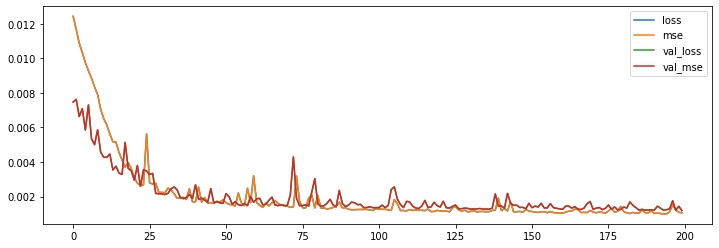

In [ ]:
losses = pd.DataFrame(model_stock.history.history)
losses.plot(figsize=(12,4))

In [ ]:
# make predictions
trainPredict = model_stock.predict(trainX)
testPredict = model_stock.predict(testX)

# Estimate model performance
#SInce we used minmaxscaler we can now use scaler.inverse_transform
#to invert the transformation.

trainPredict = scaler.inverse_transform(trainPredict)
trainY_inverse = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY_inverse = scaler.inverse_transform([testY])

#Training MSE
train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
print("train pred MSE: ", train_pred_mse)
#Training RMSE
train_pred_rmse = np.sqrt(train_pred_mse)
print("train pred RMSE: ", train_pred_rmse)

#Testing MSE
NN_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
print("test pred MSE: ", NN_pred_mse)
#Testing RMSE
NN_pred_rmse = np.sqrt(NN_pred_mse)
print("test pred RMSE: ", NN_pred_rmse)

1/1 [==============================] - 0s 19ms/step
train pred MSE:  0.007507610911450063
train pred RMSE:  0.08664647085398264
test pred MSE:  0.005430085139667381
test pred RMSE:  0.07368911140506025


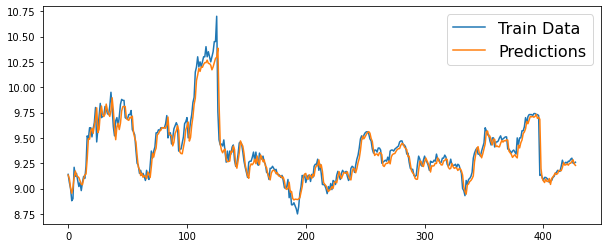

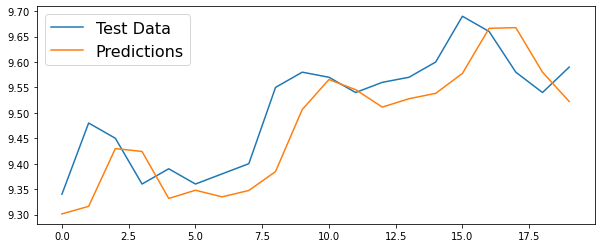

In [ ]:
#Plot Training Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(trainY_inverse[0])
plt.plot(trainPredict[:,0])
plt.legend(('Train Data', 'Predictions'), fontsize=16)

#Plot Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(testY_inverse[0])
plt.plot(testPredict[:,0])
plt.legend(('Test Data', 'Predictions'), fontsize=16)

# Predicting closing price with RNN

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import LSTM
from keras.layers import GRU
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [ ]:
NN_stock_data = stock_data.reset_index(drop=True)

data_df = pd.DataFrame(NN_stock_data)
scaler = MinMaxScaler()
scaler.fit(data_df)
NN_stock_data = scaler.transform(NN_stock_data)

train_data = NN_stock_data[:449]
test_data = NN_stock_data[449:]

In [ ]:
def to_sequences(dataset, seq_size=1):
    x = []
    y = []

    for i in range(len(dataset)-seq_size-1):
        #print(i)
        window = dataset[i:(i+seq_size), 0]
        x.append(window)
        y.append(dataset[i+seq_size, 0])
        
    return np.array(x),np.array(y)

seq_size = 20
#Train and Test data
trainX, trainY = to_sequences(train_data, seq_size)
testX, testY = to_sequences(test_data, seq_size)
trainX = np.reshape(trainX, (-1, seq_size, 1))
testX = np.reshape(testX, (-1, seq_size, 1))

In [ ]:
def objective(trial):
    # Clear clutter from previous Keras session graphs.
    clear_session()
    model = Sequential()
    units1 = trial.suggest_categorical("units1", [32, 64, 128, 256, 512])
    model.add(
        SimpleRNN(
            name = "dense_1",
            units=units1,
            input_shape=(trainX.shape[1], 1),
            #activation=trial.suggest_categorical("activation1", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation1", ['tanh','relu'])
             )
    )
    model.add(
        Dense(
            name = "dense_last",
            units=1,
            #activation=trial.suggest_categorical("activation3", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation3", ['relu'])
        )        
    )          
    
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
    opt = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        loss="mean_squared_error",
        optimizer=opt,
        metrics=["mse"],
    )

    epochs = trial.suggest_categorical("epochs", [50,80,100,150,180,200])
    model.fit(trainX, trainY, validation_split=0.1, verbose=1, epochs=epochs)


    trainPredict = model.predict(trainX)
    testPredict = model.predict(testX)

    trainPredict = scaler.inverse_transform(trainPredict)
    trainY_inverse = scaler.inverse_transform([trainY])
    testPredict = scaler.inverse_transform(testPredict)
    testY_inverse = scaler.inverse_transform([testY])


    #Training MSE
    train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
    print("train pred MSE: ", train_pred_mse)
    #Training RMSE
    train_pred_rmse = np.sqrt(train_pred_mse)
    print("train pred RMSE: ", train_pred_rmse)

    #Testing MSE
    NN_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
    print("test pred MSE: ", NN_pred_mse)
    #Testing RMSE
    NN_pred_rmse = np.sqrt(NN_pred_mse)
    print("test pred RMSE: ", NN_pred_rmse)

    return NN_pred_rmse

In [ ]:
# Create Study object
study_srnn = optuna.create_study(direction="minimize")
# Optimize the study, use more trials to obtain better result, use less trials to be more cost-efficient
study_srnn.optimize(objective, n_trials=50,n_jobs=-1) # Use more 

[I 2022-10-22 09:33:46,732] A new study created in memory with name: no-name-cd186af2-10ef-4c62-943e-2096d8eb101b


Epoch 1/150
Epoch 1/200
13/13 [==============================] - 3s 69ms/step - loss: 0.0363 - mse: 0.0363 - val_loss: 0.0274 - val_mse: 0.0274
Epoch 2/150
13/13 [==============================] - 3s 74ms/step - loss: 6.3015 - mse: 6.3015 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 29ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0065 - val_mse: 0.0065
Epoch 3/150
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 0s 33ms/step - loss: 0.0070 - mse: 0.0070 - val_loss: 0.0079 - val_mse: 0.0079
Epoch 4/150
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/200
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/200
13/13 [==============================] - 0s 30ms/ste

[I 2022-10-22 09:34:56,812] Trial 1 finished with value: 0.07916311478259751 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 3.4943234480548104e-05, 'epochs': 150}. Best is trial 1 with value: 0.07916311478259751.


train pred MSE:  0.012509019659317661
train pred RMSE:  0.11184372874380423
test pred MSE:  0.006266798742082707
test pred RMSE:  0.07916311478259751
13/13 [==============================] - 1s 65ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 151/200
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 152/200
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 153/200
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 154/200
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 155/200
13/13 [==============================] - 2s 66ms/step - loss: 0.0120 - mse: 0.0120 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 2/200
13/13 [==============================] - 0s 35ms

[I 2022-10-22 09:36:10,996] Trial 0 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.02067921501406758, 'epochs': 200}. Best is trial 1 with value: 0.07916311478259751.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/80
13/13 [==============================] - 1s 30ms/step - loss: 0.4054 - mse: 0.4054 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/80
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/80
13/13 [==============================] - 0s 16ms/step - loss: 

[I 2022-10-22 09:36:21,060] Trial 2 finished with value: 0.06206659435895084 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.002438487378575266, 'epochs': 200}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.007773230462518337
train pred RMSE:  0.08816592574525794
test pred MSE:  0.003852262135318548
test pred RMSE:  0.06206659435895084
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 45/80
Epoch 1/200
13/13 [==============================] - 1s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 46/80
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 47/80
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 48/80
13/13 [==============================] - 0s 23ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 49/80
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 50/80
13/13 [==============================] - 0s 21

[I 2022-10-22 09:36:36,260] Trial 3 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.005262809829735489, 'epochs': 80}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 62ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 35/200
13/13 [==============================] - 0s 31ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 36/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 37/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 38/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 39/200
13/13 [==============================] - 2s 63ms/step - loss: 0.0257 - mse: 0.0257 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 2/80
13/13 [==============================] - 0s 26ms/step - loss: 0

[I 2022-10-22 09:37:11,427] Trial 5 finished with value: 0.07979699341066253 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 3.544541178569204e-05, 'epochs': 80}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.01683932115850943
train pred RMSE:  0.12976640997773434
test pred MSE:  0.006367560157381319
test pred RMSE:  0.07979699341066253
13/13 [==============================] - 0s 24ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 120/200
Epoch 1/200
13/13 [==============================] - 1s 41ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 121/200
13/13 [==============================] - 0s 24ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 122/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 123/200
13/13 [==============================] - 0s 23ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 124/200
13/13 [==============================] - 0s 29ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 125/200
13/13 [============================

[I 2022-10-22 09:37:44,435] Trial 4 finished with value: 0.08951567245643144 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 4.641858576438912e-05, 'epochs': 200}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.021048970298806723
train pred RMSE:  0.14508263265741603
test pred MSE:  0.008013055615327119
test pred RMSE:  0.08951567245643144
13/13 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 80/200
Epoch 1/50
13/13 [==============================] - 1s 40ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 81/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 82/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 83/200
13/13 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 84/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 85/200
13/13 [==============================] - 

[I 2022-10-22 09:38:08,017] Trial 7 finished with value: 0.06542344183641481 and parameters: {'units1': 256, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0001556928224551082, 'epochs': 50}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.0091727930934537
train pred RMSE:  0.0957746996521195
test pred MSE:  0.0042802267417227525
test pred RMSE:  0.06542344183641481
13/13 [==============================] - 1s 58ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 136/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 137/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 138/200
13/13 [==============================] - 0s 22ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 139/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 140/200
13/13 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 141/200
13/13 [==============================] - 2s 62ms

[I 2022-10-22 09:38:35,553] Trial 6 finished with value: 0.07375244038930422 and parameters: {'units1': 64, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0001431447874378692, 'epochs': 200}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.01012773804173693
train pred RMSE:  0.10063666350658158
test pred MSE:  0.005439422463377873
test pred RMSE:  0.07375244038930422
13/13 [==============================] - 1s 60ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 67/100
13/13 [==============================] - 0s 29ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 68/100
13/13 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 69/100
13/13 [==============================] - 0s 27ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 70/100
13/13 [==============================] - 0s 28ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 71/100
13/13 [==============================] - 2s 62ms/step - loss: 0.1594 - mse: 0.1594 - val_loss: 0.1203 - val_mse: 0.1203
Epoch 2/50
13/13 [==============================] - 0s 30ms/step -

[I 2022-10-22 09:38:50,153] Trial 8 finished with value: 0.08472297511891143 and parameters: {'units1': 64, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.015342308187175822, 'epochs': 100}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.00968018926801462
train pred RMSE:  0.0983879528601679
test pred MSE:  0.0071779825129996856
test pred RMSE:  0.08472297511891143
13/13 [==============================] - 1s 57ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 34/50
13/13 [==============================] - 0s 31ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 35/50
13/13 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 36/50
13/13 [==============================] - 0s 28ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 38/50
13/13 [==============================] - 2s 62ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/50
13/13 [==============================] - 0s 28ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 39/50
13/13 [==============================] - 0s 27ms/step - loss

[I 2022-10-22 09:38:58,019] Trial 9 finished with value: 0.07033773654878636 and parameters: {'units1': 128, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 9.160963929741825e-05, 'epochs': 50}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.011295789242503755
train pred RMSE:  0.10628165054469071
test pred MSE:  0.004947397182806476
test pred RMSE:  0.07033773654878636
13/13 [==============================] - 1s 60ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 17/50
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 18/50
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 19/50
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 20/50
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 21/50
13/13 [==============================] - 2s 65ms/step - loss: 0.0240 - mse: 0.0240 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 2/180
13/13 [==============================] - 0s 31ms/step - lo

[I 2022-10-22 09:39:14,103] Trial 10 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0006284959509071879, 'epochs': 50}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 58ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 33/180
13/13 [==============================] - 0s 34ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 34/180
13/13 [==============================] - 0s 24ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 35/180
13/13 [==============================] - 0s 30ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 36/180
13/13 [==============================] - 0s 28ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 37/180
13/13 [==============================] - 2s 60ms/step - loss: 0.0450 - mse: 0.0450 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 2/180
13/13 [==============================] - 0s 29ms/step - loss: 

[I 2022-10-22 09:40:22,022] Trial 11 finished with value: 0.0644693243671679 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.001360613455805931, 'epochs': 180}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.00905651378543564
train pred RMSE:  0.09516571749025822
test pred MSE:  0.004156293784359109
test pred RMSE:  0.0644693243671679
13/13 [==============================] - 1s 66ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 153/180
13/13 [==============================] - 0s 33ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 154/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 155/180
13/13 [==============================] - 0s 28ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 156/180
13/13 [==============================] - 2s 64ms/step - loss: 0.2645 - mse: 0.2645 - val_loss: 0.1731 - val_mse: 0.1731
Epoch 2/180
13/13 [==============================] - 0s 32ms/step - loss: 0.0844 - mse: 0.0844 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 3/180
13/13 [==============================] - 0s 30ms/ste

[I 2022-10-22 09:40:35,990] Trial 12 finished with value: 0.06593170421402775 and parameters: {'units1': 256, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0013986936167138878, 'epochs': 180}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.007561375604765313
train pred RMSE:  0.08695617059625678
test pred MSE:  0.004346989620566045
test pred RMSE:  0.06593170421402775
13/13 [==============================] - 1s 81ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 30/180
13/13 [==============================] - 0s 24ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 31/180
13/13 [==============================] - 0s 25ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 32/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 33/180
13/13 [==============================] - 0s 28ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 34/180
13/13 [==============================] - 0s 26ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 35/180
13/13 [==============================] - 0s 27ms/ste

[I 2022-10-22 09:41:42,158] Trial 13 finished with value: 0.07182764218062214 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.002076387910045506, 'epochs': 180}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.008298990356770985
train pred RMSE:  0.09109879448582722
test pred MSE:  0.005159210181227488
test pred RMSE:  0.07182764218062214
13/13 [==============================] - 1s 41ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 147/180
Epoch 1/180
13/13 [==============================] - 1s 33ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 148/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 149/180
13/13 [==============================] - 0s 28ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 150/180
13/13 [==============================] - 0s 33ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 151/180
13/13 [==============================] - 2s 60ms/step - loss: 543.7233 - mse: 543.7233 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/180
13/13 [=========================

[I 2022-10-22 09:41:57,673] Trial 14 finished with value: 0.06891081662085363 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0018434317560115843, 'epochs': 180}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  0.009941405854991857
train pred RMSE:  0.09970659885379632
test pred MSE:  0.004748700647352918
test pred RMSE:  0.06891081662085363
13/13 [==============================] - 1s 59ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 35/180
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 36/180
13/13 [==============================] - 0s 24ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 37/180
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 38/180
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 39/180
13/13 [==============================] - 2s 66ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
13/13 [==============================] - 0s 27ms/step

[I 2022-10-22 09:42:42,210] Trial 16 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.05995812326370374, 'epochs': 100}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 56ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/180
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/180
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/180
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 143/180
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 144/180
13/13 [==============================] - 2s 66ms/step - loss: 0.0487 - mse: 0.0487 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 2/150
13/13 [==============================] - 0s 30ms/step - l

[I 2022-10-22 09:43:01,606] Trial 15 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.06343483706517529, 'epochs': 180}. Best is trial 2 with value: 0.06206659435895084.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 61ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 39/150
13/13 [==============================] - 0s 32ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 40/150
13/13 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 41/150
13/13 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 42/150
13/13 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 43/150
13/13 [==============================] - 2s 69ms/step - loss: 0.1109 - mse: 0.1109 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 2/150
13/13 [==============================] - 0s 33ms/step - loss: 

[I 2022-10-22 09:43:58,149] Trial 17 finished with value: 0.058978300775935945 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0004805733432524929, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.006943892538651326
train pred RMSE:  0.0833300218327784
test pred MSE:  0.0034784399624167668
test pred RMSE:  0.058978300775935945
Epoch 1/150
13/13 [==============================] - 1s 59ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 113/150
13/13 [==============================] - 0s 35ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 114/150
13/13 [==============================] - 0s 32ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 115/150
13/13 [==============================] - 0s 36ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 116/150
13/13 [==============================] - 0s 32ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 117/150
13/13 [==============================] - 2s 68ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [============================

[I 2022-10-22 09:44:25,839] Trial 18 finished with value: 0.07900125775556106 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0004950286212174571, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.009055247984895834
train pred RMSE:  0.09515906675086633
test pred MSE:  0.006241198726960597
test pred RMSE:  0.07900125775556106
13/13 [==============================] - 1s 68ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 71/150
13/13 [==============================] - 0s 36ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 72/150
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 73/150
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 74/150
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 75/150
13/13 [==============================] - 2s 69ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [==============================] - 0s 33ms/step

[I 2022-10-22 09:45:22,573] Trial 19 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00040674994425291585, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 144/150
Epoch 1/150
13/13 [==============================] - 1s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 145/150
13/13 [==============================] - 0s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 146/150
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 147/150
13/13 [==============================] - 0s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 148/150
13/13 [==============================] - 2s 67ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [==============================] - 0s 3

[I 2022-10-22 09:45:27,248] Trial 20 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0003532124262832419, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/200
13/13 [==============================] - 1s 69ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 8/150
13/13 [==============================] - 0s 36ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/150
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/150
13/13 [==============================] - 0s 36ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/150
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 12/150
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 0s 36ms/ste

[I 2022-10-22 09:46:39,252] Trial 21 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 1.2919503479107804e-05, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 63ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 152/200
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 153/200
13/13 [==============================] - 1s 48ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 154/200
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 155/200
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 156/200
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 157/200
13/13 [==============================] - 0s 28ms/step -

[I 2022-10-22 09:47:02,243] Trial 22 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.004860103123877324, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 43ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 48/200
Epoch 1/180
13/13 [==============================] - 1s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 49/200
13/13 [==============================] - 0s 31ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 50/200
13/13 [==============================] - 0s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 51/200
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 52/200
13/13 [==============================] - 2s 65ms/step - loss: 0.0724 - mse: 0.0724 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 2/180
13/13 [==============================] - 0s 34ms/s

[I 2022-10-22 09:48:11,784] Trial 23 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.005586669930582096, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 60ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 152/180
13/13 [==============================] - 0s 36ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 153/180
13/13 [==============================] - 0s 29ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 154/180
13/13 [==============================] - 0s 28ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 155/180
13/13 [==============================] - 0s 29ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 156/180
13/13 [==============================] - 2s 66ms/step - loss: 0.1144 - mse: 0.1144 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 2/180
13/13 [==============================] - 0s 30ms/step - l

[I 2022-10-22 09:48:26,792] Trial 24 finished with value: 0.060273026236895975 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.004745545216881141, 'epochs': 180}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.007471049359137593
train pred RMSE:  0.08643523216338111
test pred MSE:  0.003632837691753551
test pred RMSE:  0.060273026236895975
13/13 [==============================] - 1s 63ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 28/180
13/13 [==============================] - 0s 29ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 29/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 30/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 31/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 32/180
13/13 [==============================] - 2s 61ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 29ms/step

[I 2022-10-22 09:49:04,392] Trial 26 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.012419417354848257, 'epochs': 80}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 33ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 112/180
Epoch 1/100
13/13 [==============================] - 1s 37ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 113/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 114/180
13/13 [==============================] - 0s 26ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 115/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 116/180
13/13 [==============================] - 0s 31ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 117/180
13/13 [==============================] - 2s

[I 2022-10-22 09:49:36,514] Trial 25 finished with value: 0.0712008089269911 and parameters: {'units1': 64, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0008868615263879903, 'epochs': 180}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.007825575413021046
train pred RMSE:  0.0884622824316728
test pred MSE:  0.005069555191857896
test pred RMSE:  0.0712008089269911
13/13 [==============================] - 1s 73ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 63/100
13/13 [==============================] - 0s 35ms/step - loss: 0.0056 - mse: 0.0056 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 64/100
13/13 [==============================] - 0s 32ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 65/100
13/13 [==============================] - 0s 38ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 66/100
13/13 [==============================] - 2s 66ms/step - loss: 0.1746 - mse: 0.1746 - val_loss: 0.0135 - val_mse: 0.0135
Epoch 2/100
13/13 [==============================] - 0s 38ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 67/100
13/13 [==============================] - 0s 37ms/step -

[I 2022-10-22 09:49:57,330] Trial 27 finished with value: 0.06207006551884525 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0027932900566205623, 'epochs': 100}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.008253522609919944
train pred RMSE:  0.09084889988282711
test pred MSE:  0.003852693033513742
test pred RMSE:  0.06207006551884525
13/13 [==============================] - 1s 68ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 39/100
13/13 [==============================] - 0s 35ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 40/100
13/13 [==============================] - 0s 36ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 41/100
13/13 [==============================] - 0s 37ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 42/100
13/13 [==============================] - 0s 34ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 43/100
13/13 [==============================] - 2s 66ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 37ms/step

[I 2022-10-22 09:50:29,120] Trial 28 finished with value: 0.08914902555666962 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0033662055841658903, 'epochs': 100}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.013770480757241126
train pred RMSE:  0.11734769174227981
test pred MSE:  0.007947548757703732
test pred RMSE:  0.08914902555666962
13/13 [==============================] - 1s 61ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 66/200
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 67/200
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 68/200
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 69/200
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 70/200
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 71/200
13/13 [==============================] - 0s 31ms/ste

[I 2022-10-22 09:51:34,303] Trial 29 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.009110246368322328, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 66ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 137/200
13/13 [==============================] - 0s 33ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 138/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 139/200
13/13 [==============================] - 0s 36ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 140/200
13/13 [==============================] - 0s 30ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 141/200
13/13 [==============================] - 2s 72ms/step - loss: 50.4163 - mse: 50.4163 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [==============================] - 0s 37ms/step -

[I 2022-10-22 09:52:05,748] Trial 30 finished with value: 0.059904827192072324 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.009883917713700488, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.007986767857293497
train pred RMSE:  0.08936871856132601
test pred MSE:  0.003588588320912048
test pred RMSE:  0.059904827192072324
13/13 [==============================] - 1s 60ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 61/150
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 62/150
13/13 [==============================] - 0s 37ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 63/150
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 64/150
13/13 [==============================] - 0s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 65/150
13/13 [==============================] - 2s 68ms/step - loss: 0.2486 - mse: 0.2486 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 1s 38ms/ste

[I 2022-10-22 09:52:58,416] Trial 31 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.03768478812077775, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 66ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 115/200
13/13 [==============================] - 0s 33ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 116/200
13/13 [==============================] - 0s 32ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 117/200
13/13 [==============================] - 0s 38ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 118/200
13/13 [==============================] - 0s 29ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 119/200
13/13 [==============================] - 0s 33ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 120/200
13/13 [==============================] - 0s 29ms/step -

[I 2022-10-22 09:53:39,043] Trial 32 finished with value: 0.06285684916259622 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.02891438814090206, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.015753780446560277
train pred RMSE:  0.1255140647360298
test pred MSE:  0.0039509834866493735
test pred RMSE:  0.06285684916259622
13/13 [==============================] - 1s 60ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 83/200
13/13 [==============================] - 0s 39ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 84/200
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 85/200
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 86/200
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 87/200
13/13 [==============================] - 2s 69ms/step - loss: 0.0520 - mse: 0.0520 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 2/200
13/13 [==============================] - 1s 40ms/step

[I 2022-10-22 09:54:35,705] Trial 33 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.022590755183670583, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 68ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 120/200
13/13 [==============================] - 0s 34ms/step - loss: 0.0884 - mse: 0.0884 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 121/200
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 122/200
13/13 [==============================] - 0s 36ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 123/200
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 124/200
13/13 [==============================] - 0s 36ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 0s 34ms/step - l

[I 2022-10-22 09:55:18,433] Trial 34 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.008300242780706473, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


 1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 69ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 81/200
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 82/200
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 83/200
13/13 [==============================] - 0s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 84/200
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 85/200
13/13 [==============================] - 2s 73ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.

[I 2022-10-22 09:56:20,937] Trial 35 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.008455930655737654, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 57ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 126/200
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 127/200
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 128/200
13/13 [==============================] - 0s 24ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 129/200
13/13 [==============================] - 0s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 130/200
13/13 [==============================] - 2s 65ms/step - loss: 0.0394 - mse: 0.0394 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 2/80
13/13 [==============================] - 0s 36ms/step - lo

[I 2022-10-22 09:57:03,842] Trial 37 finished with value: 0.08757008892845403 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00024128485169522875, 'epochs': 80}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.012880902854198762
train pred RMSE:  0.11349406528184089
test pred MSE:  0.007668520474937347
test pred RMSE:  0.08757008892845403
Epoch 1/150
13/13 [==============================] - 1s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/150
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/150
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/150
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/150
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/150
13/13 [==============================] - 0s 16

[I 2022-10-22 09:57:43,053] Trial 36 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0008392508814187929, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 24ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 148/150
Epoch 1/150
13/13 [==============================] - 1s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 149/150
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 150/150
1/1 [==============================] - 0s 35ms/step


[I 2022-10-22 09:57:45,230] Trial 38 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0009255601708843852, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/50
13/13 [==============================] - 2s 75ms/step - loss: 0.0190 - mse: 0.0190 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 2/150
13/13 [==============================] - 1s 33ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 3/150
13/13 [==============================] - 0s 29ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 4/150
13/13 [==============================] - 0s 29ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 6/150
13/13 [==============================] - 0s 34ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 7/150
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/50
13/13 [==============================] - 0s 31ms/step - l

[I 2022-10-22 09:58:14,412] Trial 40 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0040496865629692175, 'epochs': 50}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 38ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 61/150
Epoch 1/200
13/13 [==============================] - 1s 34ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 62/150
13/13 [==============================] - 0s 36ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 63/150
13/13 [==============================] - 0s 30ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 64/150
13/13 [==============================] - 0s 36ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 65/150
13/13 [==============================] - 2s 67ms/step - loss: 0.0587 - mse: 0.0587 - val_loss: 0.0159 - val_mse: 0.0159
Epoch 2/200
13/13 [==============================] - 0s 31ms/s

[I 2022-10-22 09:58:59,649] Trial 39 finished with value: 0.07736991902103633 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0027282950806778766, 'epochs': 150}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.00875010566373942
train pred RMSE:  0.0935419994640879
test pred MSE:  0.00598610436932172
test pred RMSE:  0.07736991902103633
13/13 [==============================] - 1s 64ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 90/200
13/13 [==============================] - 1s 26ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 91/200
13/13 [==============================] - 1s 39ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 92/200
13/13 [==============================] - 0s 29ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 93/200
13/13 [==============================] - 0s 33ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 94/200
13/13 [==============================] - 0s 35ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 95/200
13/13 [==============================] - 3s 70ms/step -

[I 2022-10-22 10:00:01,771] Trial 42 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.00244927861703286, 'epochs': 100}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
1/1 [==============================] - 0s 75ms/step


[I 2022-10-22 10:00:01,821] Trial 41 finished with value: 0.06602647082848591 and parameters: {'units1': 32, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.002518912232620267, 'epochs': 200}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.007720404982638568
train pred RMSE:  0.0878658351274178
test pred MSE:  0.004359494850064901
test pred RMSE:  0.06602647082848591
Epoch 1/100
Epoch 1/100
13/13 [==============================] - 3s 76ms/step - loss: 7759.9395 - mse: 7759.9395 - val_loss: 0.2145 - val_mse: 0.2145
Epoch 2/100
13/13 [==============================] - 3s 78ms/step - loss: 0.1125 - mse: 0.1125 - val_loss: 0.1291 - val_mse: 0.1291
Epoch 2/100
13/13 [==============================] - 1s 42ms/step - loss: 0.2623 - mse: 0.2623 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 1s 48ms/step - loss: 0.0219 - mse: 0.0219 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 3/100
13/13 [==============================] - 1s 44ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/100
13/13 [==============================] - 1s 40ms/step - loss: 0.0033 - mse: 0.0033 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 4/100
13/13 [======================

[I 2022-10-22 10:01:02,867] Trial 44 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.006498595059251681, 'epochs': 100}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/100
13/13 [==============================] - 1s 35ms/step - loss: 235986692866048.0000 - mse: 235986692866048.0000 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 0s 20ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/100
13/13 [==============================] - 0s 19ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/100
13/13 [==============================] - 0s 22ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/100
13/13 [==============================] - 0s 21ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/100
13/13 [====================

[I 2022-10-22 10:01:26,591] Trial 43 finished with value: 0.06357805232063374 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.006343616765998002, 'epochs': 100}. Best is trial 17 with value: 0.058978300775935945.


13/13 [==============================] - 1s 66ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 77/100
13/13 [==============================] - 1s 42ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 78/100
13/13 [==============================] - 0s 37ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 79/100
13/13 [==============================] - 1s 46ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 80/100
13/13 [==============================] - 2s 71ms/step - loss: 0.1901 - mse: 0.1901 - val_loss: 0.0852 - val_mse: 0.0852
Epoch 2/180
13/13 [==============================] - 0s 39ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 81/100
13/13 [==============================] - 1s 42ms/step - loss: 0.0420 - mse: 0.0420 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 3/180
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - 

[I 2022-10-22 10:01:41,631] Trial 45 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.016576623085897083, 'epochs': 100}. Best is trial 17 with value: 0.058978300775935945.


13/13 [==============================] - 1s 78ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 24/180
13/13 [==============================] - 0s 36ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 25/180
13/13 [==============================] - 1s 47ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 26/180
13/13 [==============================] - 1s 40ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 27/180
13/13 [==============================] - 2s 81ms/step - loss: 0.0979 - mse: 0.0979 - val_loss: 0.0335 - val_mse: 0.0335
Epoch 2/180
13/13 [==============================] - 1s 41ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 28/180
13/13 [==============================] - 0s 37ms/step - loss: 0.0161 - mse: 0.0161 - val_loss: 0.0097 - val_mse: 0.0097
Epoch 3/180
13/13 [==============================] - 1s 48ms/step - loss: 0.0018 - 

[I 2022-10-22 10:03:15,854] Trial 46 finished with value: 0.06723898915033047 and parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 8.325126372884485e-05, 'epochs': 180}. Best is trial 17 with value: 0.058978300775935945.


13/13 [==============================] - 1s 68ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 170/180
13/13 [==============================] - 0s 32ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 171/180
13/13 [==============================] - 0s 34ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 172/180
13/13 [==============================] - 0s 34ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 174/180
13/13 [==============================] - 2s 76ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 36ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 175/180
13/13 [==============================] - 0s 37ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
13/13 [==============================] - 0s 37ms/step - loss: 0.0010

[I 2022-10-22 10:03:22,618] Trial 47 finished with value: 0.06576779670728367 and parameters: {'units1': 128, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.00019031852051444443, 'epochs': 180}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.007348913130795051
train pred RMSE:  0.08572580201313401
test pred MSE:  0.004325403083730592
test pred RMSE:  0.06576779670728367
13/13 [==============================] - 1s 68ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/80
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 12/80
13/13 [==============================] - 0s 31ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 13/80
13/13 [==============================] - 0s 33ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 14/80
13/13 [==============================] - 1s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 15/80
13/13 [==============================] - 2s 71ms/step - loss: 0.0567 - mse: 0.0567 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 2/80
13/13 [==============================] - 0s 36ms/step - los

[I 2022-10-22 10:04:01,717] Trial 48 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0015010125443549575, 'epochs': 80}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 35ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 67/80
13/13 [==============================] - 0s 21ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 68/80
13/13 [==============================] - 0s 21ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 69/80
13/13 [==============================] - 0s 22ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 70/80
13/13 [==============================] - 0s 21ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 71/80
13/13 [==============================] - 0s 21ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 72/80
13/13 [==============================] - 0s 23ms/step - loss: 0.001

[I 2022-10-22 10:04:06,337] Trial 49 finished with value: 0.06373053255213156 and parameters: {'units1': 256, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0016639762374398345, 'epochs': 80}. Best is trial 17 with value: 0.058978300775935945.


train pred MSE:  0.0078054769617845075
train pred RMSE:  0.08834861041230081
test pred MSE:  0.004061580779378299
test pred RMSE:  0.06373053255213156


In [ ]:
best_params = study_srnn.best_params
best_score = study_srnn.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.058978300775935945

Optimized parameters: {'units1': 512, 'activation1': 'relu', 'activation3': 'relu', 'learning_rate': 0.0004805733432524929, 'epochs': 150}



In [ ]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_srnn)

**Please design a good model to predict the closing price**

In [ ]:
model_stock = Sequential()
model_stock.add(SimpleRNN(units=512,activation='relu', input_shape=(trainX.shape[1], 1)))  
model_stock.add(Dense(1, activation='relu'))
opt = keras.optimizers.Adam(learning_rate=0.0004805733432524929)
model_stock.compile(loss='mean_squared_error', optimizer=opt, metrics = ['mse'])
print(model_stock.summary())
model_stock.fit(trainX, trainY, validation_split=0.1,
          verbose=1, epochs=150)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 512)               263168    
                                                                 
 dense_6 (Dense)             (None, 1)                 513       
                                                                 
Total params: 263,681
Trainable params: 263,681
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/150
13/13 [==============================] - 2s 77ms/step - loss: 0.0512 - mse: 0.0512 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 2/150
13/13 [==============================] - 1s 60ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 3/150
13/13 [==============================] - 1s 55ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 4/150
13/13 [========================

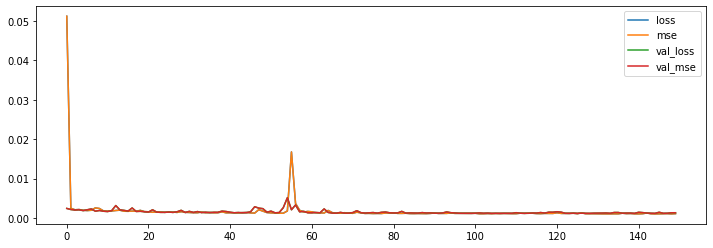

In [ ]:
losses = pd.DataFrame(model_stock.history.history)
losses.plot(figsize=(12,4))

In [ ]:
# make predictions
trainPredict = model_stock.predict(trainX)
testPredict = model_stock.predict(testX)

# Estimate model performance
#SInce we used minmaxscaler we can now use scaler.inverse_transform
#to invert the transformation.

trainPredict = scaler.inverse_transform(trainPredict)
trainY_inverse = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY_inverse = scaler.inverse_transform([testY])

#Training MSE
train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
print("train pred MSE: ", train_pred_mse)
#Training RMSE
train_pred_rmse = np.sqrt(train_pred_mse)
print("train pred RMSE: ", train_pred_rmse)

#Testing MSE
RNN_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
print("test pred MSE: ", RNN_pred_mse)
#Testing RMSE
RNN_pred_rmse = np.sqrt(RNN_pred_mse)
print("test pred RMSE: ", RNN_pred_rmse)

1/1 [==============================] - 0s 26ms/step
train pred MSE:  0.007602962081587049
train pred RMSE:  0.08719496591883645
test pred MSE:  0.003336803916567032
test pred RMSE:  0.05776507523207281


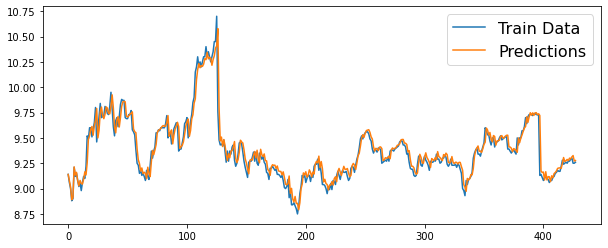

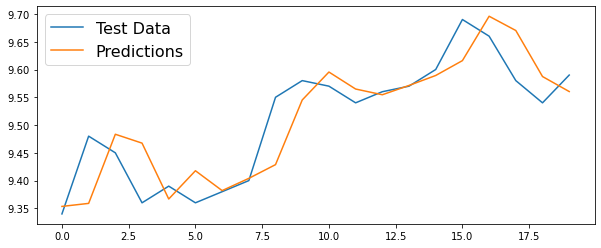

In [ ]:
#Plot Training Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(trainY_inverse[0])
plt.plot(trainPredict[:,0])
plt.legend(('Train Data', 'Predictions'), fontsize=16)

#Plot Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(testY_inverse[0])
plt.plot(testPredict[:,0])
plt.legend(('Test Data', 'Predictions'), fontsize=16)

# Predicting closing price with LSTM

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import LSTM
from keras.layers import GRU
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [ ]:
NN_stock_data = stock_data.reset_index(drop=True)

data_df = pd.DataFrame(NN_stock_data)
scaler = MinMaxScaler()
scaler.fit(data_df)
NN_stock_data = scaler.transform(NN_stock_data)

train_data = NN_stock_data[:449]
test_data = NN_stock_data[449:]

In [ ]:
def to_sequences(dataset, seq_size=1):
    x = []
    y = []

    for i in range(len(dataset)-seq_size-1):
        #print(i)
        window = dataset[i:(i+seq_size), 0]
        x.append(window)
        y.append(dataset[i+seq_size, 0])
        
    return np.array(x),np.array(y)

seq_size = 20
#Train and Test data
trainX, trainY = to_sequences(train_data, seq_size)
testX, testY = to_sequences(test_data, seq_size)
trainX = np.reshape(trainX, (-1, seq_size, 1))
testX = np.reshape(testX, (-1, seq_size, 1))

**Please design a good model to predict the closing price**

In [ ]:
def objective(trial):
    # Clear clutter from previous Keras session graphs.
    clear_session()
    model = Sequential()
    units1 = trial.suggest_categorical("units1", [32, 64, 128, 256, 512])
    model.add(
        LSTM(
            name = "dense_1",
            units=units1,
            input_shape=(trainX.shape[1], 1),
            #activation=trial.suggest_categorical("activation1", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation1", ['tanh'])
             )
    )
    model.add(
        Dense(
            name = "dense_last",
            units=1,
            #activation=trial.suggest_categorical("activation3", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation3", ['relu'])
        )        
    )          
    
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
    opt = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        loss="mean_squared_error",
        optimizer=opt,
        metrics=["mse"],
    )

    epochs = trial.suggest_categorical("epochs", [50,80,100,150,180,200])
    model.fit(trainX, trainY, validation_split=0.1, verbose=1, epochs=epochs)


    trainPredict = model.predict(trainX)
    testPredict = model.predict(testX)

    trainPredict = scaler.inverse_transform(trainPredict)
    trainY_inverse = scaler.inverse_transform([trainY])
    testPredict = scaler.inverse_transform(testPredict)
    testY_inverse = scaler.inverse_transform([testY])


    #Training MSE
    train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
    print("train pred MSE: ", train_pred_mse)
    #Training RMSE
    train_pred_rmse = np.sqrt(train_pred_mse)
    print("train pred RMSE: ", train_pred_rmse)

    #Testing MSE
    NN_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
    print("test pred MSE: ", NN_pred_mse)
    #Testing RMSE
    NN_pred_rmse = np.sqrt(NN_pred_mse)
    print("test pred RMSE: ", NN_pred_rmse)

    return NN_pred_rmse

In [ ]:
# Create Study object
study_LSTM = optuna.create_study(direction="minimize")
# Optimize the study, use more trials to obtain better result, use less trials to be more cost-efficient
study_LSTM.optimize(objective, n_trials=50,n_jobs=-1) # Use more 

[I 2022-10-22 12:29:12,802] A new study created in memory with name: no-name-102df039-b317-4618-8333-0ced2265ec2a


Epoch 1/150
Epoch 1/100
13/13 [==============================] - 7s 112ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
Epoch 2/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 3/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/100
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0061 - mse: 0.0061 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 5/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/100
13/13 [==============================] 

[I 2022-10-22 12:29:37,410] Trial 0 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00014242422221189493, 'epochs': 100}. Best is trial 0 with value: 1.463162480124805.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 65ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 108/150
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 109/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 110/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 111/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 112/150
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 113/150
13/13 [==============================] - 0s 11ms/step -

[I 2022-10-22 12:29:49,712] Trial 2 finished with value: 0.06773346110137518 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0010587809667097791, 'epochs': 50}. Best is trial 2 with value: 0.06773346110137518.


train pred MSE:  0.015635712363867432
train pred RMSE:  0.1250428421136829
test pred MSE:  0.0045878217527715055
test pred RMSE:  0.06773346110137518
Epoch 1/80
13/13 [==============================] - 2s 42ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/80
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/80
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/80
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/80
13/13 [==============================] - 0s 8ms/step - los

[I 2022-10-22 12:30:00,383] Trial 1 finished with value: 0.05878003349489455 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01912618106942752, 'epochs': 150}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.008076522449849893
train pred RMSE:  0.08986947451637788
test pred MSE:  0.0034550923376609256
test pred RMSE:  0.05878003349489455
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 74/80
13/13 [==============================] - 1s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 75/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 76/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 77/80
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 78/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 79/80
13/13 [==============================] - 0s 13ms/step - l

[I 2022-10-22 12:30:10,034] Trial 4 finished with value: 0.07657657291044756 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0001286964006200313, 'epochs': 50}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.02187831865372057
train pred RMSE:  0.14791321324925832
test pred MSE:  0.00586397151870909
test pred RMSE:  0.07657657291044756
Epoch 1/80
13/13 [==============================] - 2s 69ms/step - loss: 1.8816 - mse: 1.8816 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/80
1/1 [==============================] - 0s 26ms/step


[I 2022-10-22 12:30:13,041] Trial 3 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 9.631845365189847e-05, 'epochs': 80}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/80
Epoch 1/150
13/13 [==============================] - 1s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/80
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 8/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/80
13/13 [==============================] - 0s 11ms/step - loss

[I 2022-10-22 12:30:33,209] Trial 5 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.04489222418424493, 'epochs': 80}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 70ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 131/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 132/150
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 133/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 134/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 135/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 136/150
13/13 [==============================] - 0s 13ms/step -

[I 2022-10-22 12:30:38,179] Trial 6 finished with value: 0.06825222479253593 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.024953746075756428, 'epochs': 150}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.00834958109614136
train pred RMSE:  0.0913760422438035
test pred MSE:  0.004658366189130856
test pred RMSE:  0.06825222479253593
13/13 [==============================] - 1s 63ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 4/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 5/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 6/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 7/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 8/150
13/13 [==============================] - 0s 13ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 9/150
13/13 [==============================] - 0s 12ms/step - loss

[I 2022-10-22 12:31:05,978] Trial 7 finished with value: 0.0677994164489477 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0009562112729256623, 'epochs': 150}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.0092768629656508
train pred RMSE:  0.09631647297140193
test pred MSE:  0.00459676087081784
test pred RMSE:  0.0677994164489477
13/13 [==============================] - 0s 32ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 120/200
Epoch 1/180
13/13 [==============================] - 1s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 121/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 122/200
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 123/200
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 124/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 125/200
13/13 [==============================]

[I 2022-10-22 12:31:22,711] Trial 8 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01828198856391367, 'epochs': 200}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 72ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 61/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 62/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 63/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 64/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 65/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 66/180
13/13 [==============================] - 0s 11ms/step - loss:

[I 2022-10-22 12:31:45,262] Trial 9 finished with value: 0.060196548863048496 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.06572995735015236, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.007886623514367874
train pred RMSE:  0.0888066636822253
test pred MSE:  0.003623624495021385
test pred RMSE:  0.060196548863048496
13/13 [==============================] - 1s 76ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 99/100
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 100/100
1/1 [==============================] - 0s 38ms/step


[I 2022-10-22 12:31:48,218] Trial 10 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.06022823564399138, 'epochs': 100}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/180
13/13 [==============================] - 4s 106ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/150
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/150
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/150
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/150
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/150
13/13 [==============================] - 0s 13ms/step 

[I 2022-10-22 12:32:18,823] Trial 11 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0038687339249288016, 'epochs': 150}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 71ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 144/180
13/13 [==============================] - 0s 10ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 145/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 146/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 147/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 148/180
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 149/180
13/13 [==============================] - 0s 13ms/step -

[I 2022-10-22 12:32:26,734] Trial 12 finished with value: 0.061158444327489486 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0048432552420805556, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.008062126156608576
train pred RMSE:  0.08978934322406293
test pred MSE:  0.003740355312558631
test pred RMSE:  0.061158444327489486
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 20/180
Epoch 1/180
13/13 [==============================] - 2s 115ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 21/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 22/180
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 23/180
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 24/180
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 25/180
13/13 [==============================]

[I 2022-10-22 12:32:57,935] Trial 13 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.006448608213271185, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 30ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 149/180
Epoch 1/180
13/13 [==============================] - 1s 15ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 150/180
13/13 [==============================] - 0s 10ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 151/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 152/180
13/13 [==============================] - 0s 13ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 153/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0063 - mse: 0.0063 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 154/180
13/13 [==============================] - 0s

[I 2022-10-22 12:33:05,026] Trial 14 finished with value: 0.12039857321725536 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 1.2797549097120167e-05, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.04490209087022306
train pred RMSE:  0.21190113466006513
test pred MSE:  0.014495816432750799
test pred RMSE:  0.12039857321725536
13/13 [==============================] - 0s 31ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 14/180
Epoch 1/200
13/13 [==============================] - 1s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 15/180
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 16/180
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 17/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 18/180
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 19/180
13/13 [==============================] - 

[I 2022-10-22 12:33:43,835] Trial 15 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.08049280800532756, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/200
13/13 [==============================] - 2s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/200
13/13 [==============================] - 0s 6ms/step - loss:

[I 2022-10-22 12:33:50,937] Trial 16 finished with value: 0.19462020080679074 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.07903743537051618, 'epochs': 200}. Best is trial 1 with value: 0.05878003349489455.


13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 43/200
Epoch 1/150
13/13 [==============================] - 1s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 44/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 45/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 46/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 47/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 48/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 49/200
13/13 [==============================] - 0s 11ms/step - l

[I 2022-10-22 12:34:21,207] Trial 17 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.013562681275785082, 'epochs': 200}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 17ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 136/150
Epoch 1/150
13/13 [==============================] - 1s 31ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 137/150
13/13 [==============================] - 0s 14ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 138/150
13/13 [==============================] - 0s 14ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 139/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 140/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 141/150
13/13 [==============================] - 0s

[I 2022-10-22 12:34:36,771] Trial 18 finished with value: 0.07909953414000459 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01129771045317686, 'epochs': 150}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.009157609009541583
train pred RMSE:  0.09569539701334429
test pred MSE:  0.006256736301165753
test pred RMSE:  0.07909953414000459
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 113/150
13/13 [==============================] - 1s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 114/150
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 115/150
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 116/150
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 117/150
13/13 [==============================] - 0s 9ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 118/150
13/13 [==============================] - 0s 12m

[I 2022-10-22 12:34:45,023] Trial 19 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0012649735730815663, 'epochs': 150}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/180
13/13 [==============================] - 1s 73ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 17/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 18/150
13/13 [==============================] - 0s 14ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 19/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 20/150
13/13 [==============================] - 0s 11ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 21/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 22/150
13/13 [==============================] - 0s 14ms/

[I 2022-10-22 12:35:13,119] Trial 20 finished with value: 0.06414533608703799 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0008864883742984356, 'epochs': 150}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.008820643997161476
train pred RMSE:  0.09391828361486104
test pred MSE:  0.004114624141719057
test pred RMSE:  0.06414533608703799
13/13 [==============================] - 0s 31ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 117/180
Epoch 1/180
13/13 [==============================] - 1s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 118/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 119/180
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 120/180
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 121/180
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 122/180
13/13 [===========================

[I 2022-10-22 12:35:27,106] Trial 21 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0022640456012008813, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 51/180
Epoch 1/180
13/13 [==============================] - 1s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 52/180
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 53/180
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 54/180
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 55/180
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 56/180
13/13 [==============================] - 0s 13ms/

[I 2022-10-22 12:35:59,076] Trial 22 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.003229511380658922, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 78ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 150/180
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 151/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 152/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 153/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 154/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 155/180
13/13 [==============================] - 0s 13ms/step -

[I 2022-10-22 12:36:06,580] Trial 23 finished with value: 0.0830936787631695 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.030451476270455316, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


13/13 [==============================] - 1s 74ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 16/180
13/13 [==============================] - 0s 13ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 17/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 18/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 19/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 20/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 21/180
13/13 [==============================] - 0s 11ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 22/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0023 

[I 2022-10-22 12:36:40,932] Trial 24 finished with value: 0.09287407428038136 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.02686375613593529, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.014235480207232917
train pred RMSE:  0.11931253164371677
test pred MSE:  0.008625593673437794
test pred RMSE:  0.09287407428038136
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 156/180
Epoch 1/180
13/13 [==============================] - 1s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 157/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 158/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 159/180
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 160/180
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 161/180
13/13 [===========================

[I 2022-10-22 12:36:47,291] Trial 25 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.008900785024765146, 'epochs': 180}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 32ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 5/180
Epoch 1/100
13/13 [==============================] - 1s 12ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 6/180
13/13 [==============================] - 0s 11ms/step - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 7/180
13/13 [==============================] - 0s 11ms/step - loss: 0.0033 - mse: 0.0033 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 8/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 9/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 10/180
13/13 [==============================] - 0s 14ms/step 

[I 2022-10-22 12:37:17,690] Trial 27 finished with value: 0.07034908282482684 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00037267512658421755, 'epochs': 100}. Best is trial 1 with value: 0.05878003349489455.


train pred MSE:  0.013514969637882606
train pred RMSE:  0.11625390160283915
test pred MSE:  0.004948993454294346
test pred RMSE:  0.07034908282482684
13/13 [==============================] - 0s 29ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 156/180
Epoch 1/50
13/13 [==============================] - 1s 14ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 157/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 158/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 159/180
13/13 [==============================] - 0s 12ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 160/180
13/13 [==============================] - 0s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 161/180
13/13 [============================

[I 2022-10-22 12:37:23,805] Trial 26 finished with value: 0.058585771762219026 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.006798394285880942, 'epochs': 180}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.008115013611022931
train pred RMSE:  0.0900833703356115
test pred MSE:  0.00343229265297482
test pred RMSE:  0.058585771762219026
13/13 [==============================] - 1s 72ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 8/50
13/13 [==============================] - 0s 12ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 9/50
13/13 [==============================] - 0s 11ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 10/50
13/13 [==============================] - 0s 13ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 11/50
13/13 [==============================] - 0s 13ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 12/50
13/13 [==============================] - 0s 12ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 13/50
13/13 [==============================] - 0s 10ms/step - loss:

[I 2022-10-22 12:37:33,997] Trial 28 finished with value: 0.06891110106047288 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.005557761607584275, 'epochs': 50}. Best is trial 26 with value: 0.058585771762219026.


 0.004748739849366707
test pred RMSE:  0.06891110106047288
13/13 [==============================] - 1s 72ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 29/50
13/13 [==============================] - 0s 12ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 30/50
13/13 [==============================] - 0s 12ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 31/50
13/13 [==============================] - 0s 13ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 32/50
13/13 [==============================] - 0s 13ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 33/50
13/13 [==============================] - 0s 14ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 34/50
13/13 [==============================] - 0s 13ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 35/50
13/13 [==========

[I 2022-10-22 12:37:49,126] Trial 30 finished with value: 0.3425502863689141 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.04152609333675526, 'epochs': 80}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.11131679919350297
train pred RMSE:  0.33364172280082566
test pred MSE:  0.11734069869142505
test pred RMSE:  0.3425502863689141
1/1 [==============================] - 0s 175ms/step


[I 2022-10-22 12:37:49,410] Trial 29 finished with value: 0.0589313529361643 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.039757232476376574, 'epochs': 50}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.009545589716933088
train pred RMSE:  0.09770153385148611
test pred MSE:  0.0034729043588867608
test pred RMSE:  0.0589313529361643
Epoch 1/50
Epoch 1/50
13/13 [==============================] - 5s 95ms/step - loss: 4.8335 - mse: 4.8335 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/50
13/13 [==============================] - 5s 91ms/step - loss: 3.7608 - mse: 3.7608 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/50
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/50
13/13 [==============================] - 0s 14ms/step - loss: 0.2323 - mse: 0.2323 - val_loss: 0.0127 - val_mse: 0.0127
Epoch 3/50
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/50
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/50
13/13 [==============================] - 0

[I 2022-10-22 12:38:05,728] Trial 32 finished with value: 0.09638603775275148 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.08957702046015223, 'epochs': 50}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.010794525711124554
train pred RMSE:  0.1038967069310888
test pred MSE:  0.009290268273674834
test pred RMSE:  0.09638603775275148
Epoch 1/50
13/13 [==============================] - 2s 42ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/50
13/13 [==============================] - 0s 6ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/50
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/50
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/50
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/50
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/50
13/13 [==============================] - 0s 8ms/step - loss

[I 2022-10-22 12:38:13,684] Trial 33 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01575853180012735, 'epochs': 50}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/50
1/1 [==============================] - 0s 51ms/step


[I 2022-10-22 12:38:15,532] Trial 31 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.09127612751087592, 'epochs': 50}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/100
13/13 [==============================] - 5s 120ms/step - loss: 16.4803 - mse: 16.4803 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/50
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/50
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/50
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/50
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/50
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - lo

[I 2022-10-22 12:38:30,741] Trial 34 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.04459254985847217, 'epochs': 50}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 77ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 39/100
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 40/100
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 41/100
13/13 [==============================] - 2s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 42/100
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 43/100
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 44/100
13/13 [==============================] - 0s 15ms/step - loss:

[I 2022-10-22 12:38:54,105] Trial 36 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.008396845270441466, 'epochs': 100}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/80
13/13 [==============================] - 2s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/80
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/80
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/80
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/80
13/13 [==============================] - 0s 8ms/step - loss: 0.2660

[I 2022-10-22 12:39:02,830] Trial 35 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.03536391184338658, 'epochs': 100}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 70ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 60/80
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 61/80
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 62/80
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 63/80
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 64/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 65/80
13/13 [==============================] - 0s 12ms/step - loss: 0.266

[I 2022-10-22 12:39:08,308] Trial 37 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.020472277155624864, 'epochs': 80}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
Epoch 1/150
13/13 [==============================] - 1s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/80
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/80
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/80
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 8/80
13/13 [==============================] - 0s 14ms/step - loss:

[I 2022-10-22 12:39:28,476] Trial 38 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.024723370610903583, 'epochs': 80}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 33ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 88/150
Epoch 1/150
13/13 [==============================] - 1s 14ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 89/150
13/13 [==============================] - 0s 13ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 90/150
13/13 [==============================] - 0s 15ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 91/150
13/13 [==============================] - 0s 12ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 92/150
13/13 [==============================] - 0s 14ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 93/150
13/13 [==============================] - 0s 11ms/

[I 2022-10-22 12:39:42,871] Trial 39 finished with value: 0.06190989482012293 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0023283076396535844, 'epochs': 150}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.008184475485364443
train pred RMSE:  0.09046809097888849
test pred MSE:  0.0038328350766386834
test pred RMSE:  0.06190989482012293
13/13 [==============================] - 1s 75ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0073 - val_mse: 0.0073
Epoch 47/150
13/13 [==============================] - 0s 14ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0066 - val_mse: 0.0066
Epoch 48/150
13/13 [==============================] - 0s 15ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 49/150
13/13 [==============================] - 0s 13ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 50/150
13/13 [==============================] - 0s 14ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0068 - val_mse: 0.0068
Epoch 51/150
13/13 [==============================] - 0s 14ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0064 - val_mse: 0.0064
Epoch 52/150
13/13 [==============================] - 0s 14ms/st

[I 2022-10-22 12:40:03,056] Trial 40 finished with value: 0.08319995472021345 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 5.229379452130159e-05, 'epochs': 150}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.022630017337581302
train pred RMSE:  0.1504327668348266
test pred MSE:  0.00692223246544557
test pred RMSE:  0.08319995472021345
Epoch 1/180
13/13 [==============================] - 2s 40ms/step - loss: 0.0339 - mse: 0.0339 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 2/180
13/13 [==============================] - 0s 7ms/step - loss: 0.0071 - mse: 0.0071 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 3/180
13/13 [==============================] - 0s 7ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 4/180
13/13 [==============================] - 0s 6ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 5/180
13/13 [==============================] - 0s 8ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 6/180
13/13 [==============================] - 0s 7ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 7/180
13/13 [==============================] - 0s 8ms/step 

[I 2022-10-22 12:40:09,325] Trial 41 finished with value: 0.1291859775352111 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 1.4151165689581323e-05, 'epochs': 50}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.04873173978636069
train pred RMSE:  0.22075266654416814
test pred MSE:  0.016689016791728066
test pred RMSE:  0.1291859775352111
13/13 [==============================] - 1s 68ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 31/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 32/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 33/180
13/13 [==============================] - 0s 15ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 34/180
13/13 [==============================] - 0s 14ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 35/180
13/13 [==============================] - 0s 13ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 36/180
13/13 [==============================] - 0s 14ms/step 

[I 2022-10-22 12:40:42,773] Trial 42 finished with value: 0.07273478199432618 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.005655882503097629, 'epochs': 180}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.00877229981584498
train pred RMSE:  0.09366055635028536
test pred MSE:  0.0052903485117621555
test pred RMSE:  0.07273478199432618
13/13 [==============================] - 1s 53ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/180
Epoch 1/180
13/13 [==============================] - 1s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/180
13/13 [==============================] - 0s 19ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/180
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/180
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/180
13/13 [==============================] - 0s 18ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/180
13/13 [===========================

[I 2022-10-22 12:40:54,237] Trial 43 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0050592566193483545, 'epochs': 180}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 34ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 31/180
Epoch 1/180
13/13 [==============================] - 1s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 32/180
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 33/180
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 34/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 35/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 36/180
13/13 [==============================] - 0s 14ms/

[I 2022-10-22 12:41:27,785] Trial 44 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.05667520669431527, 'epochs': 180}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 74ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/180
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 142/180
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 143/180
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 144/180
13/13 [==============================] - 0s 30ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 145/180
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 146/180
13/13 [==============================] - 0s 10ms/step -

[I 2022-10-22 12:41:40,286] Trial 45 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0552285777755032, 'epochs': 180}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 48/180
Epoch 1/200
13/13 [==============================] - 1s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 49/180
13/13 [==============================] - 0s 11ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 50/180
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 51/180
13/13 [==============================] - 0s 10ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 52/180
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 53/180
13/13 [==============================] - 0s 12ms/

[I 2022-10-22 12:42:15,025] Trial 46 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.014907853117179267, 'epochs': 180}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 75ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 167/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 168/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 169/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 170/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 171/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 172/200
13/13 [==============================] - 0s 15ms/step -

[I 2022-10-22 12:42:26,310] Trial 47 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01076462035804293, 'epochs': 200}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 0s 31ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 44/200
Epoch 1/180
13/13 [==============================] - 1s 15ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 45/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 46/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 47/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 48/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 49/200
13/13 [==============================] - 0s 15ms/

[I 2022-10-22 12:43:01,905] Trial 48 finished with value: 0.09339645130250915 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0033067631746259572, 'epochs': 200}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  0.010893134448779705
train pred RMSE:  0.10437017988285593
test pred MSE:  0.008722897115901964
test pred RMSE:  0.09339645130250915
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 136/180
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/180
13/13 [==============================] - 0s 7ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/180
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 139/180
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 140/180
13/13 [==============================] - 0s 8ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 141/180
13/13 [==============================] - 0s 7ms/ste

[I 2022-10-22 12:43:08,410] Trial 49 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.019237497705411465, 'epochs': 180}. Best is trial 26 with value: 0.058585771762219026.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805


In [ ]:
best_params = study_LSTM.best_params
best_score = study_LSTM.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.058585771762219026

Optimized parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.006798394285880942, 'epochs': 180}



In [ ]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_LSTM)

In [ ]:
model_stock = Sequential()
model_stock.add(LSTM(units=128,activation='tanh', input_shape=(trainX.shape[1], 1)))  
model_stock.add(Dense(1))
opt = keras.optimizers.Adam(learning_rate=0.006180438126552942)
model_stock.compile(loss='mean_squared_error', optimizer=opt, metrics = ['mse'])
print(model_stock.summary())
model_stock.fit(trainX, trainY, validation_split=0.1,
          verbose=1, epochs=200)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               66560     
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 66,689
Trainable params: 66,689
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/200
13/13 [==============================] - 4s 167ms/step - loss: 0.0246 - mse: 0.0246 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 2/200
13/13 [==============================] - 1s 71ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 3/200
13/13 [==============================] - 1s 62ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0069 - val_mse: 0.0069
Epoch 4/200
13/13 [=========================

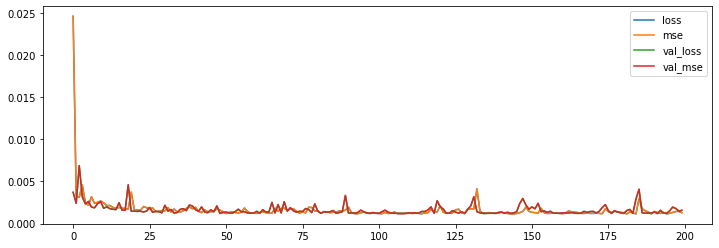

In [ ]:
losses = pd.DataFrame(model_stock.history.history)
losses.plot(figsize=(12,4))

In [ ]:
# make predictions
trainPredict = model_stock.predict(trainX)
testPredict = model_stock.predict(testX)

# Estimate model performance
#SInce we used minmaxscaler we can now use scaler.inverse_transform
#to invert the transformation.

trainPredict = scaler.inverse_transform(trainPredict)
trainY_inverse = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY_inverse = scaler.inverse_transform([testY])

#Training MSE
train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
print("train pred MSE: ", train_pred_mse)
#Training RMSE
train_pred_rmse = np.sqrt(train_pred_mse)
print("train pred RMSE: ", train_pred_rmse)

#Testing MSE
LSTM_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
print("test pred MSE: ", LSTM_pred_mse)
#Testing RMSE
LSTM_pred_rmse = np.sqrt(LSTM_pred_mse)
print("test pred RMSE: ", LSTM_pred_rmse)

1/1 [==============================] - 0s 28ms/step
train pred MSE:  0.009517536271430774
train pred RMSE:  0.09755786114624887
test pred MSE:  0.004244259544715489
test pred RMSE:  0.0651479818928836


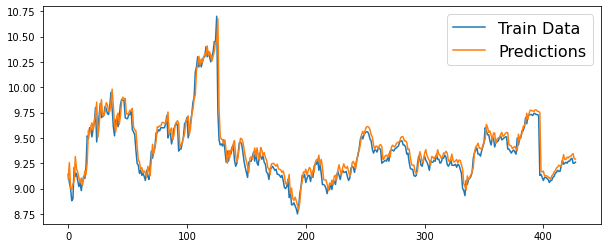

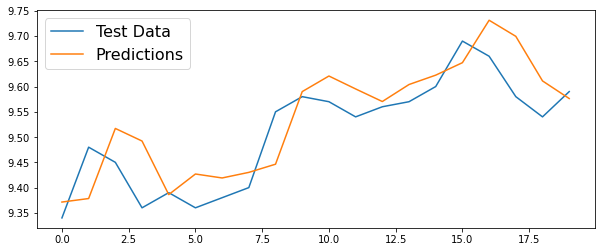

In [ ]:
#Plot Training Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(trainY_inverse[0])
plt.plot(trainPredict[:,0])
plt.legend(('Train Data', 'Predictions'), fontsize=16)

#Plot Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(testY_inverse[0])
plt.plot(testPredict[:,0])
plt.legend(('Test Data', 'Predictions'), fontsize=16)

# Predicting closing price with GRU

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import LSTM
from keras.layers import GRU
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [ ]:
NN_stock_data = stock_data.reset_index(drop=True)

data_df = pd.DataFrame(NN_stock_data)
scaler = MinMaxScaler()
scaler.fit(data_df)
NN_stock_data = scaler.transform(NN_stock_data)

train_data = NN_stock_data[:449]
test_data = NN_stock_data[449:]

In [ ]:
def to_sequences(dataset, seq_size=1):
    x = []
    y = []

    for i in range(len(dataset)-seq_size-1):
        #print(i)
        window = dataset[i:(i+seq_size), 0]
        x.append(window)
        y.append(dataset[i+seq_size, 0])
        
    return np.array(x),np.array(y)

seq_size = 20
#Train and Test data
trainX, trainY = to_sequences(train_data, seq_size)
testX, testY = to_sequences(test_data, seq_size)
trainX = np.reshape(trainX, (-1, seq_size, 1))
testX = np.reshape(testX, (-1, seq_size, 1))

**Please design a good model to predict the closing price**

In [ ]:
def objective(trial):
    # Clear clutter from previous Keras session graphs.
    clear_session()
    model = Sequential()
    units1 = trial.suggest_categorical("units1", [32, 64, 128, 256, 512])
    model.add(
        GRU(
            name = "dense_1",
            units=units1,
            input_shape=(trainX.shape[1], 1),
            #dropout=trial.suggest_uniform('dropout_rate',0.0,1.0),
            activation=trial.suggest_categorical("activation1", ['tanh'])
             )
    )
    model.add(
        Dense(
            name = "dense_last",
            units=1,
            #activation=trial.suggest_categorical("activation3", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation3", ['relu'])
        )        
    )          
    
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
    opt = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        loss="mean_squared_error",
        optimizer=opt,
        metrics=["mse"],
    )

    epochs = trial.suggest_categorical("epochs", [50,80,100,150,180,200])
    model.fit(trainX, trainY, validation_split=0.1, verbose=1, epochs=epochs)


    trainPredict = model.predict(trainX)
    testPredict = model.predict(testX)

    trainPredict = scaler.inverse_transform(trainPredict)
    trainY_inverse = scaler.inverse_transform([trainY])
    testPredict = scaler.inverse_transform(testPredict)
    testY_inverse = scaler.inverse_transform([testY])


    #Training MSE
    train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
    print("train pred MSE: ", train_pred_mse)
    #Training RMSE
    train_pred_rmse = np.sqrt(train_pred_mse)
    print("train pred RMSE: ", train_pred_rmse)

    #Testing MSE
    NN_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
    print("test pred MSE: ", NN_pred_mse)
    #Testing RMSE
    NN_pred_rmse = np.sqrt(NN_pred_mse)
    print("test pred RMSE: ", NN_pred_rmse)

    return NN_pred_rmse

In [ ]:
# Create Study object
study_GRU = optuna.create_study(direction="minimize")
# Optimize the study, use more trials to obtain better result, use less trials to be more cost-efficient
study_GRU.optimize(objective, n_trials=50,n_jobs=-1) # Use more 

[I 2022-10-22 13:56:17,142] A new study created in memory with name: no-name-1a6af0ac-3f67-4943-864f-e6375c6c1ff2


Epoch 1/200
Epoch 1/200
13/13 [==============================] - 7s 140ms/step - loss: 0.1861 - mse: 0.1861 - val_loss: 0.1334 - val_mse: 0.1334
Epoch 2/200
13/13 [==============================] - 8s 145ms/step - loss: 0.3571 - mse: 0.3571 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 1s 39ms/step - loss: 0.1253 - mse: 0.1253 - val_loss: 0.0827 - val_mse: 0.0827
Epoch 3/200
13/13 [==============================] - 0s 37ms/step - loss: 0.5146 - mse: 0.5146 - val_loss: 0.2731 - val_mse: 0.2731
Epoch 3/200
13/13 [==============================] - 1s 41ms/step - loss: 0.0755 - mse: 0.0755 - val_loss: 0.0433 - val_mse: 0.0433
Epoch 4/200
13/13 [==============================] - 1s 42ms/step - loss: 0.3116 - mse: 0.3116 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/200
13/13 [==============================] - 1s 40ms/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.0168 - val_mse: 0.0168
Epoch 5/200
13/13 [==============================] - 1s 39ms/s

[I 2022-10-22 13:58:29,328] Trial 0 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.04845437929663739, 'epochs': 200}. Best is trial 0 with value: 1.463162480124805.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/80
13/13 [==============================] - 3s 50ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 14ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/80
13/13 [==============================] - 0s 12ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/80
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/80
13/13 [==============================] - 0s 13ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/80
13/13 [==============================] - 0s 14ms/step - loss: 

[I 2022-10-22 13:58:46,881] Trial 1 finished with value: 0.06869320799490829 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00010117432296722197, 'epochs': 200}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  0.011336093661440904
train pred RMSE:  0.10647109307901795
test pred MSE:  0.004718756824631732
test pred RMSE:  0.06869320799490829
13/13 [==============================] - 2s 135ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 80/80
1/1 [==============================] - 0s 32ms/step


[I 2022-10-22 13:58:50,093] Trial 2 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00010716003419744868, 'epochs': 80}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/150
13/13 [==============================] - 6s 150ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 0s 21ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/100
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/100
13/13 [==============================] - 0s 21ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/100
13/13 [==============================] - 0s 24ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/100
13/13 [==============================] - 0s 19ms/step 

[I 2022-10-22 13:59:30,707] Trial 3 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.043700498108231935, 'epochs': 100}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 159ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 62/150
13/13 [==============================] - 0s 37ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 63/150
13/13 [==============================] - 0s 36ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 64/150
13/13 [==============================] - 0s 33ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 65/150
13/13 [==============================] - 0s 37ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 66/150
13/13 [==============================] - 0s 30ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 67/150
13/13 [==============================] - 0s 33ms/step - loss

[I 2022-10-22 14:00:16,095] Trial 5 finished with value: 0.07935256647074955 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00010967514516719009, 'epochs': 100}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  0.014287876226307252
train pred RMSE:  0.11953190463766254
test pred MSE:  0.006296829805494725
test pred RMSE:  0.07935256647074955
13/13 [==============================] - 2s 161ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 140/150
13/13 [==============================] - 0s 33ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 141/150
13/13 [==============================] - 0s 37ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 142/150
13/13 [==============================] - 0s 34ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 143/150
13/13 [==============================] - 0s 34ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 144/150
13/13 [==============================] - 0s 36ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 145/150
13/13 [==============================] - 0s 3

[I 2022-10-22 14:00:24,578] Trial 4 finished with value: 0.08225211239261726 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 7.658636772505328e-05, 'epochs': 150}. Best is trial 1 with value: 0.06869320799490829.


 0.013933664321534098
train pred RMSE:  0.1180409434117421
test pred MSE:  0.006765409993047741
test pred RMSE:  0.08225211239261726
13/13 [==============================] - 2s 153ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/150
13/13 [==============================] - 0s 21ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/150
13/13 [==============================] - 0s 23ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 12/150
13/13 [==============================] - 0s 20ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 13/150
13/13 [==============================] - 0s 22ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 14/150
13/13 [==============================] - 0s 21ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 15/150
13/13 [==============================] - 0s 22ms/step - loss: 0.2660

[I 2022-10-22 14:01:25,141] Trial 6 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 1.3772638646337387e-05, 'epochs': 150}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 4s 355ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 18/50
13/13 [==============================] - 3s 240ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 19/50
13/13 [==============================] - 7s 206ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/180
13/13 [==============================] - 1s 107ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/180
13/13 [==============================] - 3s 261ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 20/50
13/13 [==============================] - 1s 103ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/180
13/13 [==============================] - 1s 100ms/step - loss

[I 2022-10-22 14:03:31,804] Trial 7 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01063280728712261, 'epochs': 50}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 95ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 88/180
Epoch 1/200
13/13 [==============================] - 3s 111ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 89/180
13/13 [==============================] - 1s 88ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 90/180
13/13 [==============================] - 1s 95ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 91/180
13/13 [==============================] - 1s 96ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 92/180
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 1s 96ms/

[I 2022-10-22 14:04:59,811] Trial 9 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 2.1592999389014245e-05, 'epochs': 200}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 3s 231ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 151/180
13/13 [==============================] - 1s 89ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 152/180
13/13 [==============================] - 1s 84ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 153/180
13/13 [==============================] - 1s 104ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 154/180
13/13 [==============================] - 1s 109ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 155/180
13/13 [==============================] - 2s 117ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 156/180
13/13 [==============================] - 1s 89ms/st

[I 2022-10-22 14:05:45,939] Trial 8 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00197242272733722, 'epochs': 180}. Best is trial 1 with value: 0.06869320799490829.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 6s 444ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 13/180
13/13 [==============================] - 3s 214ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 14/180
13/13 [==============================] - 3s 218ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 15/180
13/13 [==============================] - 8s 169ms/step - loss: 0.0565 - mse: 0.0565 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 2/200
13/13 [==============================] - 1s 54ms/step - loss: 0.0068 - mse: 0.0068 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 3/200
13/13 [==============================] - 1s 56ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 4/200
13/13 [==============================] - 1s 61ms/step - loss

[I 2022-10-22 14:09:17,002] Trial 11 finished with value: 0.06128021309273175 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0012442878141618273, 'epochs': 200}. Best is trial 11 with value: 0.06128021309273175.


train pred MSE:  0.00818212341574426
train pred RMSE:  0.09045509060160328
test pred MSE:  0.0037552645166906125
test pred RMSE:  0.06128021309273175
13/13 [==============================] - 4s 353ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 87/180
13/13 [==============================] - 3s 232ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 88/180
13/13 [==============================] - 7s 151ms/step - loss: 0.0717 - mse: 0.0717 - val_loss: 0.0277 - val_mse: 0.0277
Epoch 2/200
13/13 [==============================] - 1s 57ms/step - loss: 0.0084 - mse: 0.0084 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 3/200
13/13 [==============================] - 1s 52ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 4/200
13/13 [==============================] - 1s 56ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 5/200
13/13 [==============================] - 3s 248ms/ste

[I 2022-10-22 14:11:59,105] Trial 12 finished with value: 0.05910969760796675 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0008849681136003117, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.0083484022364457
train pred RMSE:  0.09136959142102857
test pred MSE:  0.00349395635130527
test pred RMSE:  0.05910969760796675
13/13 [==============================] - 4s 340ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 136/180
13/13 [==============================] - 3s 224ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 137/180
13/13 [==============================] - 7s 176ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 1s 55ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 3s 224ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 138/180
13/13 [==============================] - 1s 55ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/200
13/13 [==============================] - 1s 56ms/st

[I 2022-10-22 14:14:32,204] Trial 10 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 1.2513215928135563e-05, 'epochs': 180}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 170ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 190/200
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 191/200
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 192/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 193/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 194/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 195/200
13/13 [==============================] - 1s 40ms/step 

[I 2022-10-22 14:15:27,388] Trial 13 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0011320185634830276, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 167ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 145/200
13/13 [==============================] - 1s 41ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 146/200
13/13 [==============================] - 1s 39ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 147/200
13/13 [==============================] - 1s 39ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 148/200
13/13 [==============================] - 0s 37ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 149/200
13/13 [==============================] - 0s 33ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 150/200
13/13 [==============================] - 1s 38ms/step 

[I 2022-10-22 14:17:00,635] Trial 14 finished with value: 0.09086576537179547 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0012431851310607813, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.010650510490506178
train pred RMSE:  0.10320131050769742
test pred MSE:  0.008256587316602185
test pred RMSE:  0.09086576537179547
Epoch 1/80
13/13 [==============================] - 3s 96ms/step - loss: 0.0253 - mse: 0.0253 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 2/80
13/13 [==============================] - 1s 55ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 3/80
13/13 [==============================] - 1s 55ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 4/80
13/13 [==============================] - 1s 55ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 5/80
13/13 [==============================] - 1s 57ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 6/80
13/13 [==============================] - 1s 56ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 7/80
13/13 [==============================] - 1s 55ms/step

[I 2022-10-22 14:17:55,272] Trial 15 finished with value: 0.06277752307286102 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.004254809581587927, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.00982190461829248
train pred RMSE:  0.09910552264274923
test pred MSE:  0.003941017403163598
test pred RMSE:  0.06277752307286102
13/13 [==============================] - 3s 238ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 70/80
13/13 [==============================] - 1s 83ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 71/80
13/13 [==============================] - 1s 95ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 72/80
13/13 [==============================] - 1s 86ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 73/80
13/13 [==============================] - 1s 107ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 74/80
13/13 [==============================] - 1s 97ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 75/80
13/13 [==============================] - 9s 222ms/step - 

[I 2022-10-22 14:18:13,856] Trial 16 finished with value: 0.1945593826671993 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.006300721713944355, 'epochs': 80}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.0327193638384802
train pred RMSE:  0.18088494641202238
test pred MSE:  0.037853353383841694
test pred RMSE:  0.1945593826671993
13/13 [==============================] - 2s 128ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 9/50
Epoch 1/50
13/13 [==============================] - 2s 100ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 10/50
13/13 [==============================] - 1s 91ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 11/50
13/13 [==============================] - 1s 87ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 13/50
13/13 [==============================] - 6s 146ms/step - loss: 0.1411 - mse: 0.1411 - val_loss: 0.0287 - val_mse: 0.0287
Epoch 2/50
13/13 [==============================] - 1s 55ms/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0148 - val_mse: 0.0148
Epoch 3/50
13/13 [==============================] - 1s 110ms/

[I 2022-10-22 14:18:56,637] Trial 18 finished with value: 0.07358094244338706 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0003982099127900154, 'epochs': 50}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.01288384640348522
train pred RMSE:  0.11350703239661065
test pred MSE:  0.005414155090857039
test pred RMSE:  0.07358094244338706
13/13 [==============================] - 3s 211ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 38/50
13/13 [==============================] - 1s 91ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 39/50
13/13 [==============================] - 1s 88ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 40/50
13/13 [==============================] - 1s 101ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 41/50
13/13 [==============================] - 1s 96ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 42/50
13/13 [==============================] - 7s 157ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 1s 49ms/step - 

[I 2022-10-22 14:19:19,868] Trial 17 finished with value: 1.463162480124805 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.000329149689293459, 'epochs': 50}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 5s 374ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 24/200
13/13 [==============================] - 1s 39ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 25/200
13/13 [==============================] - 5s 97ms/step - loss: 0.1285 - mse: 0.1285 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 2/200
13/13 [==============================] - 1s 46ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 26/200
13/13 [==============================] - 1s 46ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0145 - val_mse: 0.0145
Epoch 3/200
13/13 [==============================] - 1s 48ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 27/200
13/13 [==============================] - 1s 47ms/step - loss: 

[I 2022-10-22 14:21:46,345] Trial 20 finished with value: 0.06300654650598927 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0004396203564157468, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.008468551387641155
train pred RMSE:  0.09202473247796569
test pred MSE:  0.0039698249026113895
test pred RMSE:  0.06300654650598927
Epoch 1/200
13/13 [==============================] - 3s 53ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/200
13/13 [==============================] - 0s 17ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/200
13/13 [==============================] - 0s 1

[I 2022-10-22 14:22:24,747] Trial 19 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0004915562506690996, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 149ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 155/200
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 156/200
13/13 [==============================] - 0s 28ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 157/200
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 158/200
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 159/200
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 160/200
13/13 [==============================] - 0s 26ms/step 

[I 2022-10-22 14:23:11,929] Trial 21 finished with value: 1.463162480124805 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01159151808773813, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 178ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 100/200
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 101/200
13/13 [==============================] - 1s 39ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 102/200
13/13 [==============================] - 1s 38ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 103/200
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 104/200
13/13 [==============================] - 1s 45ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 105/200
13/13 [==============================] - 1s 42ms/step 

[I 2022-10-22 14:24:23,256] Trial 22 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.005788327845780014, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 165ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 100/200
13/13 [==============================] - 1s 42ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 101/200
13/13 [==============================] - 1s 44ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 102/200
13/13 [==============================] - 1s 42ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 103/200
13/13 [==============================] - 0s 37ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 104/200
13/13 [==============================] - 0s 37ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 105/200
13/13 [==============================] - 0s 35ms/step 

[I 2022-10-22 14:25:39,490] Trial 23 finished with value: 0.0684764873490376 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0034381258742692856, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.010678987410901272
train pred RMSE:  0.10333918623107728
test pred MSE:  0.004689029319662907
test pred RMSE:  0.0684764873490376
13/13 [==============================] - 2s 172ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 105/200
13/13 [==============================] - 1s 39ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 106/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 107/200
13/13 [==============================] - 1s 47ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 108/200
13/13 [==============================] - 0s 37ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 109/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 110/200
13/13 [==============================] - 1s 40

[I 2022-10-22 14:26:51,251] Trial 24 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0028952306881143935, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


13/13 [==============================] - 2s 185ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 100/200
13/13 [==============================] - 1s 42ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 101/200
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 102/200
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 103/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 104/200
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 105/200
13/13 [==============================] - 1s 42ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 106/200
13/13 [==============================] - 1s 53ms/step - loss:

[I 2022-10-22 14:28:14,831] Trial 25 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.021935288188177086, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 5s 370ms/step - loss: 0.0356 - mse: 0.0356 - val_loss: 0.0299 - val_mse: 0.0299
Epoch 22/180
13/13 [==============================] - 3s 229ms/step - loss: 0.0208 - mse: 0.0208 - val_loss: 0.0500 - val_mse: 0.0500
Epoch 23/180
13/13 [==============================] - 4s 306ms/step - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0661 - val_mse: 0.0661
Epoch 24/180
13/13 [==============================] - 12s 416ms/step - loss: 0.0442 - mse: 0.0442 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 2/180
13/13 [==============================] - 4s 292ms/step - loss: 0.0355 - mse: 0.0355 - val_loss: 0.0279 - val_mse: 0.0279
Epoch 25/180
13/13 [==============================] - 4s 302ms/step - loss: 0.0070 - mse: 0.0070 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 3/180
13/13 [==============================] - 4s 292ms/step -

[I 2022-10-22 14:39:21,837] Trial 26 finished with value: 0.1881675547610552 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.014917697256565235, 'epochs': 180}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.03502013590935487
train pred RMSE:  0.187136677082166
test pred MSE:  0.03540702866475471
test pred RMSE:  0.1881675547610552
13/13 [==============================] - 4s 294ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 165/180
Epoch 1/100
13/13 [==============================] - 5s 264ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 166/180
13/13 [==============================] - 7s 153ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/100
13/13 [==============================] - 1s 52ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/100
13/13 [==============================] - 1s 54ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/100
13/13 [==============================] - 4s 283ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 167/180
13/13 [==============================] - 

[I 2022-10-22 14:40:35,124] Trial 28 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0007607985481454389, 'epochs': 100}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/150
13/13 [==============================] - 3s 66ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/150
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/150
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/150
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/150
13/13 [==============================] - 0s 29ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/150
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/150
13/13 [==============================] - 0s 26ms/step -

[I 2022-10-22 14:40:45,943] Trial 27 finished with value: 0.06728398403183314 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0009047465505884399, 'epochs': 180}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.0083499222871082
train pred RMSE:  0.09137790918547108
test pred MSE:  0.0045271345071959766
test pred RMSE:  0.06728398403183314
13/13 [==============================] - 1s 79ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 20/150
Epoch 1/150
13/13 [==============================] - 2s 48ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 21/150
13/13 [==============================] - 2s 136ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 22/150
13/13 [==============================] - 1s 39ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 23/150
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 24/150
13/13 [==============================] - 1s 47ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 25/150
13/13 [==============================] -

[I 2022-10-22 14:43:00,051] Trial 29 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00020986266887496876, 'epochs': 150}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/80
13/13 [==============================] - 3s 66ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/80
13/13 [==============================] - 0s 24ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/80
13/13 [==============================] - 0s 25ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/80
13/13 [==============================] - 0s 27ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/80
13/13 [==============================] - 0s 26ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 7/80
13/13 [==============================] - 0s 25ms/step - loss: 

[I 2022-10-22 14:43:13,960] Trial 30 finished with value: 0.06779041710417776 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00020582053078452205, 'epochs': 150}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  0.011104806578180802
train pred RMSE:  0.10537934607018969
test pred MSE:  0.004595540651158396
test pred RMSE:  0.06779041710417776
13/13 [==============================] - 2s 174ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 31/80
13/13 [==============================] - 1s 43ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 32/80
13/13 [==============================] - 1s 43ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 33/80
13/13 [==============================] - 1s 43ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 34/80
13/13 [==============================] - 1s 39ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 35/80
13/13 [==============================] - 0s 35ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 36/80
13/13 [==============================] - 1s 45ms/step - l

[I 2022-10-22 14:43:54,566] Trial 31 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.056011354905096115, 'epochs': 80}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 1s 73ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 48/200
Epoch 1/200
13/13 [==============================] - 2s 43ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 49/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 50/200
13/13 [==============================] - 1s 42ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 51/200
13/13 [==============================] - 1s 40ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 52/200
13/13 [==============================] - 1s 41ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 53/200
13/13 [==============================] - 1s 45ms/

[I 2022-10-22 14:46:10,457] Trial 33 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.002077005849187601, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/200
13/13 [==============================] - 3s 69ms/step - loss: 0.0622 - mse: 0.0622 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 2/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0123 - mse: 0.0123 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 3/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 4/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 5/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 6/200
13/13 [==============================] - 0s 29ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 7/200
13/13 [==============================] - 0s 26ms/step -

[I 2022-10-22 14:46:42,197] Trial 32 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.001891149756528356, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 2s 173ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 76/200
13/13 [==============================] - 1s 41ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 77/200
13/13 [==============================] - 1s 43ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 78/200
13/13 [==============================] - 1s 39ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 79/200
13/13 [==============================] - 1s 42ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 80/200
13/13 [==============================] - 1s 45ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 81/200
13/13 [==============================] - 1s 45ms/step - loss

[I 2022-10-22 14:48:17,881] Trial 35 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.004782455050963579, 'epochs': 200}. Best is trial 12 with value: 0.05910969760796675.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
14/14 [==============================] - 1s 35ms/step
Epoch 1/200
1/1 [==============================] - 0s 34ms/step


[I 2022-10-22 14:48:18,571] Trial 34 finished with value: 0.058644008048444815 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0005886380261486216, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.008549967060098201
train pred RMSE:  0.0924660319257737
test pred MSE:  0.0034391196799860605
test pred RMSE:  0.058644008048444815
Epoch 1/200
13/13 [==============================] - 6s 102ms/step - loss: 0.1018 - mse: 0.1018 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 2/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0092 - mse: 0.0092 - val_loss: 0.0123 - val_mse: 0.0123
Epoch 3/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 4/200
13/13 [==============================] - 8s 117ms/step - loss: 0.1009 - mse: 0.1009 - val_loss: 0.0166 - val_mse: 0.0166
Epoch 2/200
13/13 [==============================] - 0s 31ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 5/200
13/13 [==============================] - 0s 34ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 3/200
13/13 [==============================] - 0s

[I 2022-10-22 14:50:07,905] Trial 37 finished with value: 0.07493888299924097 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.000725322858366239, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.00892711946359943
train pred RMSE:  0.09448343486346922
test pred MSE:  0.005615836185173927
test pred RMSE:  0.07493888299924097
13/13 [==============================] - 2s 166ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 200/200
1/1 [==============================] - 0s 34ms/step


[I 2022-10-22 14:50:11,495] Trial 36 finished with value: 0.06555177206608313 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0006050439035933504, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.008372160720884913
train pred RMSE:  0.09149951213468252
test pred MSE:  0.004297034821003716
test pred RMSE:  0.06555177206608313
Epoch 1/100
13/13 [==============================] - 6s 145ms/step - loss: 0.2021 - mse: 0.2021 - val_loss: 0.1620 - val_mse: 0.1620
Epoch 2/100
13/13 [==============================] - 1s 44ms/step - loss: 0.1647 - mse: 0.1647 - val_loss: 0.1294 - val_mse: 0.1294
Epoch 3/100
13/13 [==============================] - 1s 43ms/step - loss: 0.1317 - mse: 0.1317 - val_loss: 0.1015 - val_mse: 0.1015
Epoch 4/100
13/13 [==============================] - 1s 40ms/step - loss: 0.1033 - mse: 0.1033 - val_loss: 0.0769 - val_mse: 0.0769
Epoch 5/100
13/13 [==============================] - 1s 43ms/step - loss: 0.0788 - mse: 0.0788 - val_loss: 0.0564 - val_mse: 0.0564
Epoch 6/100
13/13 [==============================] - 1s 57ms/step - loss: 0.0578 - mse: 0.0578 - val_loss: 0.0396 - val_mse: 0.0396
Epoch 7/100
13/13 [==============================] - 1s 4

[I 2022-10-22 14:51:32,806] Trial 38 finished with value: 0.0872992356154204 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 5.4514629245683554e-05, 'epochs': 100}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.01841329950936252
train pred RMSE:  0.13569561344922879
test pred MSE:  0.0076211565390366855
test pred RMSE:  0.0872992356154204
13/13 [==============================] - 2s 194ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 97/100
13/13 [==============================] - 1s 42ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 98/100
13/13 [==============================] - 1s 44ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 99/100
13/13 [==============================] - 1s 45ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 100/100
1/1 [==============================] - 0s 29ms/step


[I 2022-10-22 14:51:39,770] Trial 39 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0977281511243122, 'epochs': 100}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 7s 165ms/step - loss: 0.1219 - mse: 0.1219 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 2/80
Epoch 1/80
13/13 [==============================] - 3s 98ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 3/80
13/13 [==============================] - 1s 95ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 4/80
13/13 [==============================] - 1s 84ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 5/80
13/13 [==============================] - 1s 109ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 6/80
13/13 [==============================] - 7s 139ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/80
13/13 [==============================] - 0s 28ms/step - los

[I 2022-10-22 14:52:25,752] Trial 41 finished with value: 1.463162480124805 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00021375554908883762, 'epochs': 80}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 3s 239ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 28/80
13/13 [==============================] - 1s 100ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 29/80
13/13 [==============================] - 1s 98ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 30/80
13/13 [==============================] - 2s 118ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 31/80
13/13 [==============================] - 7s 164ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
13/13 [==============================] - 1s 104ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 32/80
13/13 [==============================] - 1s 60ms/step - loss: 

[I 2022-10-22 14:54:52,699] Trial 42 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0013686471094380918, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/200
13/13 [==============================] - 4s 108ms/step - loss: 0.1194 - mse: 0.1194 - val_loss: 0.0307 - val_mse: 0.0307
Epoch 2/200
13/13 [==============================] - 0s 25ms/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 3/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 4/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 5/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 6/200
13/13 [==============================] - 0s 29ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 7/200
13/13 [==============================] - 0s 29ms/step 

[I 2022-10-22 14:55:02,221] Trial 40 finished with value: 0.08078535467290658 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0002831073851809386, 'epochs': 80}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.011560638504195316
train pred RMSE:  0.1075204097099491
test pred MSE:  0.006526273529627309
test pred RMSE:  0.08078535467290658
13/13 [==============================] - 2s 168ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 13/200
13/13 [==============================] - 1s 43ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 14/200
13/13 [==============================] - 1s 47ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 15/200
13/13 [==============================] - 1s 45ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 16/200
13/13 [==============================] - 1s 44ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 17/200
13/13 [==============================] - 0s 37ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 18/200
13/13 [==============================] - 1s 43ms/ste

[I 2022-10-22 14:58:18,513] Trial 43 finished with value: 0.07180200793741537 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0002926898676502249, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.009028497684735143
train pred RMSE:  0.09501840708376005
test pred MSE:  0.005155528343844659
test pred RMSE:  0.07180200793741537
Epoch 1/200
13/13 [==============================] - 3s 66ms/step - loss: 0.1549 - mse: 0.1549 - val_loss: 0.0961 - val_mse: 0.0961
Epoch 2/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0814 - mse: 0.0814 - val_loss: 0.0430 - val_mse: 0.0430
Epoch 3/200
13/13 [==============================] - 0s 26ms/step - loss: 0.0342 - mse: 0.0342 - val_loss: 0.0126 - val_mse: 0.0126
Epoch 4/200
13/13 [==============================] - 0s 27ms/step - loss: 0.0091 - mse: 0.0091 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 5/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 6/200
13/13 [==============================] - 0s 28ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 7/200
13/13 [==============================] - 0s 28

[I 2022-10-22 14:58:31,003] Trial 44 finished with value: 0.06588137235027429 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00013550126401976523, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.010869369357378698
train pred RMSE:  0.10425626771268334
test pred MSE:  0.004340355222755485
test pred RMSE:  0.06588137235027429
13/13 [==============================] - 1s 60ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 25/200
Epoch 1/200
13/13 [==============================] - 2s 42ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 26/200
13/13 [==============================] - 1s 45ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 27/200
13/13 [==============================] - 1s 45ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 28/200
13/13 [==============================] - 1s 39ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 29/200
13/13 [==============================] - 1s 43ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 30/200
13/13 [==============================] -

[I 2022-10-22 15:01:03,864] Trial 45 finished with value: 0.06807863656804398 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0001406544959671017, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.010496726431705228
train pred RMSE:  0.10245353303671488
test pred MSE:  0.0046347007569638166
test pred RMSE:  0.06807863656804398
13/13 [==============================] - 1s 58ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 175/200
Epoch 1/50
13/13 [==============================] - 3s 84ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 176/200
13/13 [==============================] - 1s 45ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 177/200
13/13 [==============================] - 1s 44ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 178/200
13/13 [==============================] - 1s 45ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 179/200
13/13 [==============================] - 1s 50ms/step - loss: 0.0022 - mse: 0.0022 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 180/200
13/13 [===========================

[I 2022-10-22 15:01:51,984] Trial 47 finished with value: 1.463162480124805 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 6.105783985472733e-05, 'epochs': 50}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
Epoch 1/200
13/13 [==============================] - 5s 218ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 2/200
1/1 [==============================] - 0s 47ms/step


[I 2022-10-22 15:01:59,287] Trial 46 finished with value: 0.07270789014016434 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 5.261013698583204e-05, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.01505773525095697
train pred RMSE:  0.12270996394326326
test pred MSE:  0.005286437288634206
test pred RMSE:  0.07270789014016434
13/13 [==============================] - 5s 394ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 3/200
13/13 [==============================] - 3s 258ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 4/200
13/13 [==============================] - 4s 293ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 5/200
13/13 [==============================] - 11s 456ms/step - loss: 0.0347 - mse: 0.0347 - val_loss: 0.0065 - val_mse: 0.0065
Epoch 2/200
13/13 [==============================] - 4s 282ms/step - loss: 0.2660 - mse: 0.2660 - val_loss: 0.2420 - val_mse: 0.2420
Epoch 6/200
13/13 [==============================] - 4s 328ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 3/200
13/13 [==============================] - 4s 308ms/st

[I 2022-10-22 15:16:19,970] Trial 48 finished with value: 1.463162480124805 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0015132991026678092, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  1.850787344538645
train pred RMSE:  1.360436453693683
test pred MSE:  2.1408444432449705
test pred RMSE:  1.463162480124805
13/13 [==============================] - 3s 188ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 199/200
13/13 [==============================] - 2s 178ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 200/200
1/1 [==============================] - 0s 49ms/step


[I 2022-10-22 15:16:27,287] Trial 49 finished with value: 0.05913147378064497 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0016076506360641163, 'epochs': 200}. Best is trial 34 with value: 0.058644008048444815.


train pred MSE:  0.008652470179101875
train pred RMSE:  0.09301865500587436
test pred MSE:  0.0034965311914711035
test pred RMSE:  0.05913147378064497


In [ ]:
best_params = study_GRU.best_params
best_score = study_GRU.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 0.058644008048444815

Optimized parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0005886380261486216, 'epochs': 200}



In [ ]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_GRU)

In [ ]:
model_stock = Sequential()
model_stock.add(GRU(units=128, activation='tanh', input_shape=(trainX.shape[1], 1)))  
model_stock.add(Dense(1))
opt = keras.optimizers.Adam(learning_rate=0.0005886380261486216)
model_stock.compile(loss='mean_squared_error', optimizer=opt, metrics = ['mse'])
print(model_stock.summary())
model_stock.fit(trainX, trainY, validation_split=0.1,
          verbose=1, epochs=200)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               50304     
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 50,433
Trainable params: 50,433
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/200
13/13 [==============================] - 3s 66ms/step - loss: 0.0918 - mse: 0.0918 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 2/200
13/13 [==============================] - 0s 24ms/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 3/200
13/13 [==============================] - 0s 23ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 4/200
13/13 [============================

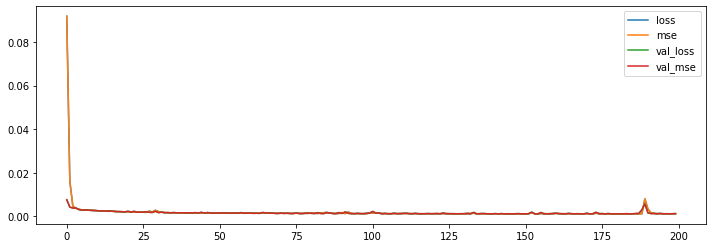

In [ ]:
losses = pd.DataFrame(model_stock.history.history)
losses.plot(figsize=(12,4))

In [ ]:
# make predictions
trainPredict = model_stock.predict(trainX)
testPredict = model_stock.predict(testX)

# Estimate model performance
#SInce we used minmaxscaler we can now use scaler.inverse_transform
#to invert the transformation.

trainPredict = scaler.inverse_transform(trainPredict)
trainY_inverse = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY_inverse = scaler.inverse_transform([testY])

#Training MSE
train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
print("train pred MSE: ", train_pred_mse)
#Training RMSE
train_pred_rmse = np.sqrt(train_pred_mse)
print("train pred RMSE: ", train_pred_rmse)

#Testing MSE
GRU_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
print("test pred MSE: ", GRU_pred_mse)
#Testing RMSE
GRU_pred_rmse = np.sqrt(GRU_pred_mse)
print("test pred RMSE: ", GRU_pred_rmse)

1/1 [==============================] - 0s 20ms/step
train pred MSE:  0.008576444618404077
train pred RMSE:  0.09260909576496294
test pred MSE:  0.0034645709433807044
test pred RMSE:  0.058860606039869354


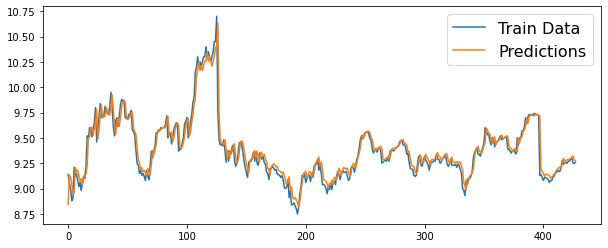

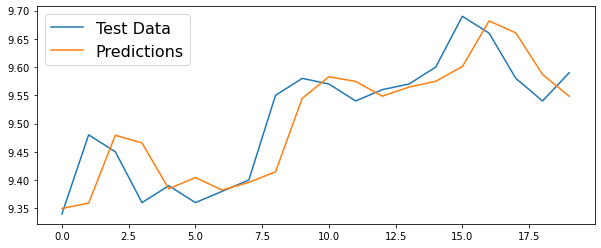

In [ ]:
#Plot Training Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(trainY_inverse[0])
plt.plot(trainPredict[:,0])
plt.legend(('Train Data', 'Predictions'), fontsize=16)

#Plot Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(testY_inverse[0])
plt.plot(testPredict[:,0])
plt.legend(('Test Data', 'Predictions'), fontsize=16)

# Final Result Comparison

In [ ]:
print("ARMA mse: ", ARMA_pred_mse)
print("ARMA rmse: ", ARMA_pred_rmse)
print("==============================")
print("SVR mse: ", SVR_pred_mse)
print("SVR rmse: ", SVR_pred_rmse)
print("==============================")
print("NN mse: ", NN_pred_mse)
print("NN rmse: ", NN_pred_rmse)
print("==============================")
print("RNN mse: ", RNN_pred_mse)
print("RNN rmse: ", RNN_pred_rmse)
print("==============================")
print("LSTM mse: ", LSTM_pred_mse)
print("LSTM rmse: ", LSTM_pred_rmse)
print("==============================")
print("GRU mse: ", GRU_pred_mse)
print("GRU rmse: ", GRU_pred_rmse)
best_model = []
best_performance = min(ARMA_pred_rmse, SVR_pred_rmse, RNN_pred_rmse, LSTM_pred_rmse, GRU_pred_rmse)
if ARMA_pred_rmse == best_performance:
  best_model.append("ARMA")
if SVR_pred_rmse == best_performance:
  best_model.append("SVR")
if NN_pred_rmse == best_performance:
  best_model.append("NN")
if RNN_pred_rmse == best_performance:
  best_model.append("RNN")
if LSTM_pred_rmse == best_performance:
  best_model.append("LSTM")
if GRU_pred_rmse == best_performance:
  best_model.append("GRU")
print("==============================")
print("The best model is", best_model)

ARMA mse:  0.004369726256646886
ARMA rmse:  0.06610390500300936
SVR mse:  0.002407426712002223
SVR rmse:  0.049065534869215714
NN mse:  0.005430085139667381
NN rmse:  0.07368911140506025
RNN mse:  0.003336803916567032
RNN rmse:  0.05776507523207281
LSTM mse:  0.004244259544715489
LSTM rmse:  0.0651479818928836
GRU mse:  0.0034645709433807044
GRU rmse:  0.058860606039869354
The best model is ['SVR']


# (Optional) Try to predict other stock closing price (Advanced topic)

In [ ]:
from FinMind.data import DataLoader
stock_no = '2330'
dl = DataLoader()
stock2330_data = dl.taiwan_stock_daily(stock_id=stock_no, start_date='2008-01-01')
stock2330_data.set_index('date',inplace=True)
stock2330_data

,stock_id,Trading_Volume,Trading_money,open,max,min,close,spread,Trading_turnover
date,,,,,,,,,
2008-01-02,2330,38970787,2372467178,62.0,62.0,60.2,60.5,-1.5,7439
2008-01-03,2330,34838364,2076910765,59.9,60.0,59.4,59.4,-1.1,7050
2008-01-04,2330,48400934,2869210304,59.3,60.4,58.5,60.0,0.6,9216
2008-01-07,2330,103229616,5825279212,57.0,58.0,55.8,55.8,-4.2,28629
2008-01-08,2330,47333450,2654125177,55.8,56.6,55.5,56.0,0.2,12024
...,...,...,...,...,...,...,...,...,...
2022-10-17,2330,45038159,17954868983,400.0,403.5,396.0,397.0,-15.0,66589
2022-10-18,2330,41304834,16675510801,406.5,407.0,399.5,407.0,10.0,30538
2022-10-19,2330,48655069,19398261013,404.0,405.0,395.5,395.5,-11.5,68211


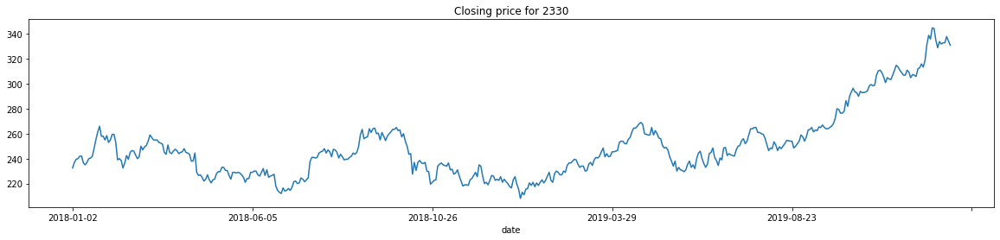

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
stock2330_data = stock2330_data[['close']].loc['2018-01-01':'2019-12-31'].dropna()
stock2330_data.plot(title=f"Closing price for {stock_no}", figsize=(20,4), legend=None)

In [ ]:
stock2330_data_train = stock2330_data[:stock2330_data.size-30]
stock2330_data_test = stock2330_data[stock2330_data.size-30:stock2330_data.size]

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import LSTM
from keras.layers import GRU
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [ ]:
pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 348 kB 28.9 MB/s 
     |████████████████████████████████| 209 kB 71.3 MB/s 
     |████████████████████████████████| 81 kB 10.0 MB/s 
     |████████████████████████████████| 78 kB 7.9 MB/s 
     |████████████████████████████████| 147 kB 71.6 MB/s 
     |████████████████████████████████| 112 kB 73.3 MB/s 
     |████████████████████████████████| 50 kB 7.0 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=8c8563949fa4ba7d66dc4f91e02c957370e91580fa82d635a29d159baff2c9b5
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
import optuna
from sklearn.model_selection import cross_validate
from keras.backend import clear_session
import pandas as pd
from tensorflow import keras

In [ ]:
NN_stock_data = stock2330_data.reset_index(drop=True)

data_df = pd.DataFrame(NN_stock_data)
scaler = MinMaxScaler()
scaler.fit(data_df)
NN_stock_data = scaler.transform(NN_stock_data)

train_data = NN_stock_data[:449]
test_data = NN_stock_data[449:]

In [ ]:
def to_sequences(dataset, seq_size=1):
    x = []
    y = []

    for i in range(len(dataset)-seq_size-1):
        #print(i)
        window = dataset[i:(i+seq_size), 0]
        x.append(window)
        y.append(dataset[i+seq_size, 0])
        
    return np.array(x),np.array(y)

seq_size = 20
#Train and Test data
trainX, trainY = to_sequences(train_data, seq_size)
testX, testY = to_sequences(test_data, seq_size)
trainX = np.reshape(trainX, (-1, seq_size, 1))
testX = np.reshape(testX, (-1, seq_size, 1))

In [ ]:
def objective(trial):
    # Clear clutter from previous Keras session graphs.
    clear_session()
    model = Sequential()
    units1 = trial.suggest_categorical("units1", [32, 64, 128, 256, 512])
    model.add(
        GRU(
            name = "dense_1",
            units=units1,
            input_shape=(trainX.shape[1], 1),
            #dropout=trial.suggest_uniform('dropout_rate',0.0,1.0),
            activation=trial.suggest_categorical("activation1", ['tanh'])
             )
    )
    model.add(
        Dense(
            name = "dense_last",
            units=1,
            #activation=trial.suggest_categorical("activation3", ['relu','sigmoid','softmax','tanh'])
            activation=trial.suggest_categorical("activation3", ['relu'])
        )        
    )          
    
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True)
    opt = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        loss="mean_squared_error",
        optimizer=opt,
        metrics=["mse"],
    )

    epochs = trial.suggest_categorical("epochs", [1000,200,300,400,500])
    model.fit(trainX, trainY, validation_split=0.1, verbose=1, epochs=epochs)


    trainPredict = model.predict(trainX)
    testPredict = model.predict(testX)

    trainPredict = scaler.inverse_transform(trainPredict)
    trainY_inverse = scaler.inverse_transform([trainY])
    testPredict = scaler.inverse_transform(testPredict)
    testY_inverse = scaler.inverse_transform([testY])


    #Training MSE
    train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
    print("train pred MSE: ", train_pred_mse)
    #Training RMSE
    train_pred_rmse = np.sqrt(train_pred_mse)
    print("train pred RMSE: ", train_pred_rmse)

    #Testing MSE
    NN_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
    print("test pred MSE: ", NN_pred_mse)
    #Testing RMSE
    NN_pred_rmse = np.sqrt(NN_pred_mse)
    print("test pred RMSE: ", NN_pred_rmse)

    return NN_pred_rmse

In [ ]:
# Create Study object
study_2330_GRU = optuna.create_study(direction="minimize")
# Optimize the study, use more trials to obtain better result, use less trials to be more cost-efficient
study_2330_GRU.optimize(objective, n_trials=50,n_jobs=-1) # Use more 

[I 2022-10-22 17:45:56,272] A new study created in memory with name: no-name-b64b364e-f00d-4662-aaea-712824bffa36


Epoch 1/500
Epoch 1/400
13/13 [==============================] - 5s 84ms/step - loss: 0.0430 - mse: 0.0430 - val_loss: 0.1883 - val_mse: 0.1883
Epoch 2/500
13/13 [==============================] - 5s 84ms/step - loss: 0.0584 - mse: 0.0584 - val_loss: 0.0509 - val_mse: 0.0509
Epoch 2/400
13/13 [==============================] - 0s 14ms/step - loss: 0.0093 - mse: 0.0093 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 3/400
13/13 [==============================] - 0s 11ms/step - loss: 0.0411 - mse: 0.0411 - val_loss: 0.1828 - val_mse: 0.1828
Epoch 4/500
13/13 [==============================] - 0s 14ms/step - loss: 0.1442 - mse: 0.1442 - val_loss: 27.8071 - val_mse: 27.8071
Epoch 4/400
13/13 [==============================] - 0s 13ms/step - loss: 2.1121 - mse: 2.1121 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 5/400
13/13 [==============================] - 0s 11ms/step - loss: 0.0386 - mse: 0.0386 - val_loss: 0.1751 - val_mse: 0.1751
Epoch 7/500
13/13 [==============================] - 0s 13ms/s

[I 2022-10-22 17:47:27,859] Trial 0 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.007010149621999202, 'epochs': 400}. Best is trial 0 with value: 121.16387337208363.


39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 0s 31ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 456/500
Epoch 1/300
13/13 [==============================] - 1s 12ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 457/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 458/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 459/500
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 460/500
13/13 [==============================] - 0s 11ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 461/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0015 - mse: 0.0015 - val_loss:

[I 2022-10-22 17:47:36,574] Trial 1 finished with value: 13.997520447501017 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 1.0319820059118502e-05, 'epochs': 500}. Best is trial 1 with value: 13.997520447501017.


train pred MSE:  29.463786117919106
train pred RMSE:  5.4280554637843474
test pred MSE:  195.9305786782091
test pred RMSE:  13.997520447501017
13/13 [==============================] - 0s 27ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 28/300
Epoch 1/1000
13/13 [==============================] - 1s 29ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 29/300
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 30/300
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 31/300
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 32/300
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 33/300
13/13 [==============================] - 0s 11m

[I 2022-10-22 17:48:28,411] Trial 2 finished with value: 121.16387337208363 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00016701722423318816, 'epochs': 300}. Best is trial 1 with value: 13.997520447501017.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 73ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 256/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 257/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 258/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 259/1000
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 260/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 261/1000
13/13 [==============================] - 0s 15

[I 2022-10-22 17:49:09,374] Trial 4 finished with value: 8.601910949796073 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00018800198177972797, 'epochs': 200}. Best is trial 4 with value: 8.601910949796073.


train pred MSE:  16.939605953707137
train pred RMSE:  4.115775255490409
test pred MSE:  73.99287198822157
test pred RMSE:  8.601910949796073
13/13 [==============================] - 1s 71ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 488/1000
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 489/1000
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 490/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 491/1000
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 492/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 493/1000
13/13 [==============================] - 0s 12ms/

[I 2022-10-22 17:50:21,447] Trial 5 finished with value: 8.375421751770967 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 8.840401315289639e-05, 'epochs': 300}. Best is trial 5 with value: 8.375421751770967.


train pred MSE:  15.469567220089036
train pred RMSE:  3.933137071103553
test pred MSE:  70.14768952003824
test pred RMSE:  8.375421751770967
13/13 [==============================] - 1s 111ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 857/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 858/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 859/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 860/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 861/1000
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 862/1000
13/13 [==============================] - 0s 14ms

[I 2022-10-22 17:51:03,547] Trial 3 finished with value: 121.16387337208363 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0254225945396044, 'epochs': 1000}. Best is trial 5 with value: 8.375421751770967.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 71ms/step - loss: 7.6408e-04 - mse: 7.6408e-04 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 254/400
13/13 [==============================] - 0s 13ms/step - loss: 8.0807e-04 - mse: 8.0807e-04 - val_loss: 0.0074 - val_mse: 0.0074
Epoch 255/400
13/13 [==============================] - 0s 14ms/step - loss: 7.9749e-04 - mse: 7.9749e-04 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 256/400
13/13 [==============================] - 0s 12ms/step - loss: 7.6730e-04 - mse: 7.6730e-04 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 257/400
13/13 [==============================] - 0s 13ms/step - loss: 8.6594e-04 - mse: 8.6594e-04 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 258/400
13/13 [==============================] - 0s 12ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 259/400
13/13 [=====

[I 2022-10-22 17:51:33,135] Trial 6 finished with value: 50.0830263876425 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.01581181101334132, 'epochs': 400}. Best is trial 5 with value: 8.375421751770967.


train pred MSE:  22.47982447969544
train pred RMSE:  4.741289326722789
test pred MSE:  2508.3095321452947
test pred RMSE:  50.0830263876425
13/13 [==============================] - 0s 28ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 131/1000
Epoch 1/300
13/13 [==============================] - 1s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 132/1000
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 133/1000
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 134/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 135/1000
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 136/1000
13/13 [==============================]

[I 2022-10-22 17:52:40,944] Trial 8 finished with value: 121.16387337208363 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 1.0168720633705214e-05, 'epochs': 300}. Best is trial 5 with value: 8.375421751770967.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 72ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 467/1000
13/13 [==============================] - 0s 10ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 468/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 469/1000
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 470/1000
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 471/1000
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 472/1000
13/13 [==============================] - 0s 11

[I 2022-10-22 17:55:30,914] Trial 7 finished with value: 121.16387337208363 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.08935776953685257, 'epochs': 1000}. Best is trial 5 with value: 8.375421751770967.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 0s 34ms/step - loss: 7.7691e-04 - mse: 7.7691e-04 - val_loss: 9.0942e-04 - val_mse: 9.0942e-04
Epoch 867/1000
Epoch 1/400
13/13 [==============================] - 1s 13ms/step - loss: 7.6954e-04 - mse: 7.6954e-04 - val_loss: 7.5934e-04 - val_mse: 7.5934e-04
Epoch 868/1000
13/13 [==============================] - 0s 17ms/step - loss: 7.6123e-04 - mse: 7.6123e-04 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 869/1000
13/13 [==============================] - 0s 14ms/step - loss: 7.8611e-04 - mse: 7.8611e-04 - val_loss: 7.6821e-04 - val_mse: 7.6821e-04
Epoch 870/1000
13/13 [==============================] - 0s 16ms/step - loss: 7.8015e-04 - mse: 7.8015e-04 - val_loss: 9.8351e-04 - val_mse: 9.8351e-04
Epoch 871/1000
13/13 [==============================] - 0s 17ms/step - loss: 7.6527e-04 - mse: 7.6527e-04 - val_

[I 2022-10-22 17:56:02,487] Trial 9 finished with value: 6.7763386925164975 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0003493691054290069, 'epochs': 1000}. Best is trial 9 with value: 6.7763386925164975.


train pred MSE:  14.787142076696565
train pred RMSE:  3.8454053202096348
test pred MSE:  45.9187660756962
test pred RMSE:  6.7763386925164975
13/13 [==============================] - 1s 69ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 107/400
13/13 [==============================] - 0s 13ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 108/400
13/13 [==============================] - 0s 15ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 109/400
13/13 [==============================] - 0s 11ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 110/400
13/13 [==============================] - 0s 11ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 111/400
13/13 [==============================] - 0s 13ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0077 - val_mse: 0.0077
Epoch 112/400
13/13 [==============================] - 0s 11ms/step 

[I 2022-10-22 17:57:03,289] Trial 10 finished with value: 10.48379410204257 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 3.257396648256303e-05, 'epochs': 400}. Best is trial 9 with value: 6.7763386925164975.


train pred MSE:  21.349151231770104
train pred RMSE:  4.620514173960524
test pred MSE:  109.90993877402256
test pred RMSE:  10.48379410204257
13/13 [==============================] - 1s 70ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 278/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 279/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 280/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 281/1000
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 282/1000
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 283/1000
13/13 [==============================] - 0s 11ms

[I 2022-10-22 17:58:22,950] Trial 12 finished with value: 5.961285410389909 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0008687672656305168, 'epochs': 300}. Best is trial 12 with value: 5.961285410389909.


train pred MSE:  14.102168796525799
train pred RMSE:  3.755285448075259
test pred MSE:  35.536923744127584
test pred RMSE:  5.961285410389909
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 639/1000
13/13 [==============================] - 1s 35ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 640/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 641/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 642/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 643/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 644/1000
13/13 [==============================] - 0s 12ms

[I 2022-10-22 17:59:44,201] Trial 11 finished with value: 121.16387337208363 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0017189112344337767, 'epochs': 1000}. Best is trial 12 with value: 5.961285410389909.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 0s 36ms/step - loss: 8.0213e-04 - mse: 8.0213e-04 - val_loss: 8.3256e-04 - val_mse: 8.3256e-04
Epoch 306/1000
Epoch 1/500
13/13 [==============================] - 1s 19ms/step - loss: 8.4863e-04 - mse: 8.4863e-04 - val_loss: 8.5786e-04 - val_mse: 8.5786e-04
Epoch 307/1000
13/13 [==============================] - 0s 12ms/step - loss: 8.5588e-04 - mse: 8.5588e-04 - val_loss: 9.7717e-04 - val_mse: 9.7717e-04
Epoch 308/1000
13/13 [==============================] - 0s 14ms/step - loss: 8.1402e-04 - mse: 8.1402e-04 - val_loss: 5.8750e-04 - val_mse: 5.8750e-04
Epoch 309/1000
13/13 [==============================] - 0s 14ms/step - loss: 8.0612e-04 - mse: 8.0612e-04 - val_loss: 7.5924e-04 - val_mse: 7.5924e-04
Epoch 310/1000
13/13 [==============================] - 0s 13ms/step - loss: 8.1983e-04 - mse: 8.1983e-0

[I 2022-10-22 18:02:00,464] Trial 14 finished with value: 6.338016588854749 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.000941990902367051, 'epochs': 500}. Best is trial 12 with value: 5.961285410389909.


train pred MSE:  16.36595586024248
train pred RMSE:  4.045485862074231
test pred MSE:  40.17045428059798
test pred RMSE:  6.338016588854749
13/13 [==============================] - 0s 41ms/step - loss: 7.4239e-04 - mse: 7.4239e-04 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 851/1000
Epoch 1/500
13/13 [==============================] - 1s 16ms/step - loss: 8.6222e-04 - mse: 8.6222e-04 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 852/1000
13/13 [==============================] - 0s 13ms/step - loss: 7.8797e-04 - mse: 7.8797e-04 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 853/1000
13/13 [==============================] - 0s 13ms/step - loss: 7.4348e-04 - mse: 7.4348e-04 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 854/1000
13/13 [==============================] - 0s 13ms/step - loss: 7.2854e-04 - mse: 7.2854e-04 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 855/1000
13/13 [==============================] - 0s 14ms/step - loss: 7.1709e-04 - mse: 7.1709e-04 - val_loss: 0.0025 - val_mse: 0.0025
Epoch

[I 2022-10-22 18:02:39,184] Trial 13 finished with value: 101.34035530127333 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.001255984816366266, 'epochs': 1000}. Best is trial 12 with value: 5.961285410389909.


train pred MSE:  15.328592190040798
train pred RMSE:  3.915174605306997
test pred MSE:  10269.867612588318
test pred RMSE:  101.34035530127333
13/13 [==============================] - 1s 107ms/step - loss: 7.6037e-04 - mse: 7.6037e-04 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 118/500
13/13 [==============================] - 0s 14ms/step - loss: 8.1923e-04 - mse: 8.1923e-04 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 119/500
13/13 [==============================] - 0s 16ms/step - loss: 8.7817e-04 - mse: 8.7817e-04 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 120/500
13/13 [==============================] - 0s 14ms/step - loss: 9.6749e-04 - mse: 9.6749e-04 - val_loss: 5.9473e-04 - val_mse: 5.9473e-04
Epoch 121/500
13/13 [==============================] - 0s 14ms/step - loss: 7.8111e-04 - mse: 7.8111e-04 - val_loss: 7.4910e-04 - val_mse: 7.4910e-04
Epoch 122/500
13/13 [==============================] - 0s 23ms/step - loss: 7.8467e-04 - mse: 7.8467e-04 - val_loss: 6.9913e-04 - val_mse: 6.991

[I 2022-10-22 18:04:31,831] Trial 15 finished with value: 5.767086836412825 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0014691197597869773, 'epochs': 500}. Best is trial 15 with value: 5.767086836412825.


train pred MSE:  15.177175468590573
train pred RMSE:  3.895789453832249
test pred MSE:  33.25929057872609
test pred RMSE:  5.767086836412825
Epoch 1/500
13/13 [==============================] - 1s 104ms/step - loss: 7.2379e-04 - mse: 7.2379e-04 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 464/500
13/13 [==============================] - 0s 18ms/step - loss: 7.1797e-04 - mse: 7.1797e-04 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 465/500
13/13 [==============================] - 0s 16ms/step - loss: 7.0887e-04 - mse: 7.0887e-04 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 466/500
13/13 [==============================] - 0s 14ms/step - loss: 7.5171e-04 - mse: 7.5171e-04 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 467/500
13/13 [==============================] - 0s 13ms/step - loss: 8.2639e-04 - mse: 8.2639e-04 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 468/500
13/13 [==============================] - 0s 14ms/step - loss: 7.2729e-04 - mse: 7.2729e-04 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 46

[I 2022-10-22 18:05:09,898] Trial 16 finished with value: 92.28175285123082 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0034768463415650284, 'epochs': 500}. Best is trial 15 with value: 5.767086836412825.


train pred MSE:  20.173297963567535
train pred RMSE:  4.491469465950708
test pred MSE:  8515.921909295648
test pred RMSE:  92.28175285123082
13/13 [==============================] - 0s 17ms/step - loss: 8.0699e-04 - mse: 8.0699e-04 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 245/500
Epoch 1/200
13/13 [==============================] - 1s 37ms/step - loss: 8.2352e-04 - mse: 8.2352e-04 - val_loss: 8.2473e-04 - val_mse: 8.2473e-04
Epoch 246/500
13/13 [==============================] - 0s 13ms/step - loss: 8.2548e-04 - mse: 8.2548e-04 - val_loss: 9.3887e-04 - val_mse: 9.3887e-04
Epoch 247/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 248/500
13/13 [==============================] - 0s 15ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 249/500
13/13 [==============================] - 0s 19ms/step - loss: 8.1739e-04 - mse: 8.1739e-04 - val_loss: 8.6486e-04 - val_mse: 8.6486e-04
E

[I 2022-10-22 18:06:07,398] Trial 18 finished with value: 7.009390545545451 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0003447542649785093, 'epochs': 200}. Best is trial 15 with value: 5.767086836412825.


train pred MSE:  14.48157620346924
train pred RMSE:  3.805466620990025
test pred MSE:  49.13155581998196
test pred RMSE:  7.009390545545451
1/1 [==============================] - 0s 51ms/step


[I 2022-10-22 18:06:08,179] Trial 17 finished with value: 30.748430923189716 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.004825928029448798, 'epochs': 500}. Best is trial 15 with value: 5.767086836412825.


train pred MSE:  17.80777066521385
train pred RMSE:  4.219925433608259
test pred MSE:  945.4660042381695
test pred RMSE:  30.748430923189716
Epoch 1/500
Epoch 1/300
13/13 [==============================] - 6s 102ms/step - loss: 0.0141 - mse: 0.0141 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 2/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0132 - val_mse: 0.0132
Epoch 3/500
13/13 [==============================] - 0s 16ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 9.5690e-04 - val_mse: 9.5690e-04
Epoch 4/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 6.2063e-04 - val_mse: 6.2063e-04
Epoch 5/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 7.6191e-04 - val_mse: 7.6191e-04
Epoch 6/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 7/500
13/13 [===========

[I 2022-10-22 18:07:32,485] Trial 20 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.000818756548721934, 'epochs': 300}. Best is trial 15 with value: 5.767086836412825.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 110ms/step - loss: 7.7163e-04 - mse: 7.7163e-04 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 350/500
13/13 [==============================] - 0s 38ms/step - loss: 7.5036e-04 - mse: 7.5036e-04 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 351/500
13/13 [==============================] - 0s 12ms/step - loss: 7.9978e-04 - mse: 7.9978e-04 - val_loss: 8.1600e-04 - val_mse: 8.1600e-04
Epoch 352/500
13/13 [==============================] - 0s 13ms/step - loss: 7.5875e-04 - mse: 7.5875e-04 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 353/500
13/13 [==============================] - 0s 24ms/step - loss: 7.4909e-04 - mse: 7.4909e-04 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 354/500
13/13 [==============================] - 0s 13ms/step - loss: 7.7756e-04 - mse: 7.7756e-04 - val_loss: 8.9714e-04 - val_mse: 8.9714e-04
E

[I 2022-10-22 18:08:07,107] Trial 19 finished with value: 16.18878116247613 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0041654743978519985, 'epochs': 500}. Best is trial 15 with value: 5.767086836412825.


train pred MSE:  16.83764513315106
train pred RMSE:  4.103369972735954
test pred MSE:  262.076635526542
test pred RMSE:  16.18878116247613
13/13 [==============================] - 0s 18ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 100/300
13/13 [==============================] - 1s 39ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 101/300
13/13 [==============================] - 0s 16ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 102/300
13/13 [==============================] - 0s 15ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 103/300
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 104/300
13/13 [==============================] - 0s 14ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 105/300
13/13 [==============================] - 0s 15ms/step - l

[I 2022-10-22 18:08:59,910] Trial 21 finished with value: 8.624081113999601 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 5.2917099888542535e-05, 'epochs': 300}. Best is trial 15 with value: 5.767086836412825.


train pred MSE:  16.9523569873706
train pred RMSE:  4.117324008062834
test pred MSE:  74.37477506084461
test pred RMSE:  8.624081113999601
13/13 [==============================] - 2s 144ms/step - loss: 8.0321e-04 - mse: 8.0321e-04 - val_loss: 6.9523e-04 - val_mse: 6.9523e-04
Epoch 167/500
13/13 [==============================] - 0s 15ms/step - loss: 9.6092e-04 - mse: 9.6092e-04 - val_loss: 7.2622e-04 - val_mse: 7.2622e-04
Epoch 168/500
13/13 [==============================] - 0s 14ms/step - loss: 8.8777e-04 - mse: 8.8777e-04 - val_loss: 6.5448e-04 - val_mse: 6.5448e-04
Epoch 169/500
13/13 [==============================] - 0s 14ms/step - loss: 7.8952e-04 - mse: 7.8952e-04 - val_loss: 9.1292e-04 - val_mse: 9.1292e-04
Epoch 170/500
13/13 [==============================] - 0s 14ms/step - loss: 7.7585e-04 - mse: 7.7585e-04 - val_loss: 8.5514e-04 - val_mse: 8.5514e-04
Epoch 171/500
13/13 [==============================] - 0s 15ms/step - loss: 7.7225e-04 - mse: 7.7225e-04 - val_loss: 6.2525e

[I 2022-10-22 18:10:30,584] Trial 22 finished with value: 5.668713745171073 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0006398719134688691, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  14.519138317445842
train pred RMSE:  3.8103987084616016
test pred MSE:  32.134315524691445
test pred RMSE:  5.668713745171073
13/13 [==============================] - 1s 123ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 315/500
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 316/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 317/500
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 318/500
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 319/500
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 320/500
13/13 [==============================] - 0s 19ms/ste

[I 2022-10-22 18:11:29,694] Trial 23 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0006387080236099897, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 41ms/step - loss: 7.8399e-04 - mse: 7.8399e-04 - val_loss: 7.5736e-04 - val_mse: 7.5736e-04
Epoch 222/500
Epoch 1/500
13/13 [==============================] - 1s 14ms/step - loss: 7.8675e-04 - mse: 7.8675e-04 - val_loss: 9.4876e-04 - val_mse: 9.4876e-04
Epoch 223/500
13/13 [==============================] - 0s 13ms/step - loss: 7.7495e-04 - mse: 7.7495e-04 - val_loss: 5.8092e-04 - val_mse: 5.8092e-04
Epoch 224/500
13/13 [==============================] - 0s 13ms/step - loss: 9.5308e-04 - mse: 9.5308e-04 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 225/500
13/13 [==============================] - 0s 16ms/step - loss: 9.2695e-04 - mse: 9.2695e-04 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 226/500
13/13 [==============================] - 0s 13ms/step - loss: 8.0335e-04 - mse: 8.0335e-04 - val_loss: 8.1302e

[I 2022-10-22 18:13:03,178] Trial 24 finished with value: 6.573002886557332 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0005222783472598458, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  16.241481095239642
train pred RMSE:  4.030072095538694
test pred MSE:  43.204366946691025
test pred RMSE:  6.573002886557332
13/13 [==============================] - 1s 120ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 406/500
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 407/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 408/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 409/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 410/500
13/13 [==============================] - 0s 24ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 411/500
13/13 [==============================] - 0s 15ms/step

[I 2022-10-22 18:14:00,458] Trial 25 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0019462985989976088, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 0s 40ms/step - loss: 7.7382e-04 - mse: 7.7382e-04 - val_loss: 6.9030e-04 - val_mse: 6.9030e-04
Epoch 328/500
Epoch 1/200
13/13 [==============================] - 1s 17ms/step - loss: 7.6159e-04 - mse: 7.6159e-04 - val_loss: 7.1981e-04 - val_mse: 7.1981e-04
Epoch 329/500
13/13 [==============================] - 0s 21ms/step - loss: 7.6230e-04 - mse: 7.6230e-04 - val_loss: 6.7950e-04 - val_mse: 6.7950e-04
Epoch 330/500
13/13 [==============================] - 0s 13ms/step - loss: 7.7478e-04 - mse: 7.7478e-04 - val_loss: 6.7746e-04 - val_mse: 6.7746e-04
Epoch 331/500
13/13 [==============================] - 0s 13ms/step - loss: 7.6275e-04 - mse: 7.6275e-04 - val_loss: 5.6362e-04 - val_mse: 5.6362e-04
Epoch 332/500
13/13 [==============================] - 0s 13ms/step - loss: 8.2864e-04 - mse: 8.2864e-04 - v

[I 2022-10-22 18:14:40,548] Trial 26 finished with value: 12.186715048354248 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.002040995653034871, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  18.37614920379748
train pred RMSE:  4.286741093627825
test pred MSE:  148.51602366978386
test pred RMSE:  12.186715048354248
13/13 [==============================] - 0s 40ms/step - loss: 8.1281e-04 - mse: 8.1281e-04 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 144/200
Epoch 1/200
13/13 [==============================] - 1s 12ms/step - loss: 7.8287e-04 - mse: 7.8287e-04 - val_loss: 7.1795e-04 - val_mse: 7.1795e-04
Epoch 145/200
13/13 [==============================] - 0s 12ms/step - loss: 7.7585e-04 - mse: 7.7585e-04 - val_loss: 0.0038 - val_mse: 0.0038
Epoch 146/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 147/200
13/13 [==============================] - 0s 12ms/step - loss: 9.0493e-04 - mse: 9.0493e-04 - val_loss: 9.1168e-04 - val_mse: 9.1168e-04
Epoch 148/200
13/13 [==============================] - 0s 12ms/step - loss: 8.2128e-04 - mse: 8.2128e-04 - val_loss: 5.7991e-04 - val_mse: 5.7

[I 2022-10-22 18:15:28,913] Trial 28 finished with value: 10.131917973816991 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00024157580751335553, 'epochs': 200}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  17.65484545155532
train pred RMSE:  4.201766943983842
test pred MSE:  102.65576182815582
test pred RMSE:  10.131917973816991
Epoch 1/300
1/1 [==============================] - 0s 50ms/step


[I 2022-10-22 18:15:30,690] Trial 27 finished with value: 24.114434541058856 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.011955090803043349, 'epochs': 200}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  41.04327612758503
train pred RMSE:  6.406502644000471
test pred MSE:  581.5059532350124
test pred RMSE:  24.114434541058856
Epoch 1/400
13/13 [==============================] - 5s 99ms/step - loss: 0.9068 - mse: 0.9068 - val_loss: 0.0529 - val_mse: 0.0529
Epoch 2/300
13/13 [==============================] - 0s 14ms/step - loss: 0.0650 - mse: 0.0650 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 3/300
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 4/300
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 5/300
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 6/300
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 7/300
13/13 [==============================] - 0s 13ms/step -

[I 2022-10-22 18:16:57,506] Trial 29 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.010016292402347585, 'epochs': 300}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 112ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 327/400
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 328/400
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 329/400
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 330/400
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 331/400
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 332/400
13/13 [==============================] - 0s 13ms/st

[I 2022-10-22 18:17:17,636] Trial 30 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00897742358284334, 'epochs': 400}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 120ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 49/400
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 50/400
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 51/400
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 52/400
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 53/400
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 54/400
13/13 [==============================] - 0s 14ms/step - l

[I 2022-10-22 18:19:26,998] Trial 31 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 9.934314213970262e-05, 'epochs': 400}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
Epoch 1/500
13/13 [==============================] - 3s 53ms/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0218 - val_mse: 0.0218
Epoch 2/500
13/13 [==============================] - 0s 10ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0071 - val_mse: 0.0071
Epoch 3/500
13/13 [==============================] - 0s 10ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 4/500
13/13 [==============================] - 0s 9ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 5/500
13/13 [==============================] - 0s 9ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 6/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 7/500
13/13 [==============================] - 0s 9ms/step -

[I 2022-10-22 18:19:49,976] Trial 32 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.000948980737241686, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 112ms/step - loss: 7.7581e-04 - mse: 7.7581e-04 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 146/500
13/13 [==============================] - 0s 15ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 6.0104e-04 - val_mse: 6.0104e-04
Epoch 147/500
13/13 [==============================] - 0s 14ms/step - loss: 9.2065e-04 - mse: 9.2065e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 148/500
13/13 [==============================] - 0s 23ms/step - loss: 9.0682e-04 - mse: 9.0682e-04 - val_loss: 5.9548e-04 - val_mse: 5.9548e-04
Epoch 149/500
13/13 [==============================] - 0s 21ms/step - loss: 8.2440e-04 - mse: 8.2440e-04 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 150/500
13/13 [==============================] - 0s 16ms/step - loss: 8.6168e-04 - mse: 8.6168e-04 - val_loss: 7.8702e-04 - val_mse: 7.8702e-04
E

[I 2022-10-22 18:21:52,219] Trial 33 finished with value: 9.164032024388902 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0010624634701375203, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  17.95623320342633
train pred RMSE:  4.237479581476037
test pred MSE:  83.97948294402536
test pred RMSE:  9.164032024388902
Epoch 1/500
13/13 [==============================] - 3s 50ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 2/500
13/13 [==============================] - 0s 10ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 3/500
13/13 [==============================] - 0s 9ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 4/500
13/13 [==============================] - 0s 9ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 8.7969e-04 - val_mse: 8.7969e-04
Epoch 5/500
13/13 [==============================] - 0s 9ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 6/500
13/13 [==============================] - 0s 10ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 7/500
13/13 [==============================] - 0s 9ms/ste

[I 2022-10-22 18:22:20,830] Trial 34 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0029299170298514752, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 0s 14ms/step - loss: 8.4877e-04 - mse: 8.4877e-04 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 184/500
13/13 [==============================] - 1s 39ms/step - loss: 8.2178e-04 - mse: 8.2178e-04 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 185/500
13/13 [==============================] - 0s 14ms/step - loss: 8.1105e-04 - mse: 8.1105e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 186/500
13/13 [==============================] - 0s 17ms/step - loss: 7.7298e-04 - mse: 7.7298e-04 - val_loss: 5.6741e-04 - val_mse: 5.6741e-04
Epoch 187/500
13/13 [==============================] - 0s 13ms/step - loss: 8.4624e-04 - mse: 8.4624e-04 - val_loss: 7.7340e-04 - val_mse: 7.7340e-04
Epoch 188/500
13/13 [==============================] - 0s 18ms/step - loss: 8.2695e-04 - mse: 8.2695e-04 - val_loss: 5.6651e-04 - val_mse: 5.665

[I 2022-10-22 18:24:11,995] Trial 36 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0004388465331447159, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
Epoch 1/300
13/13 [==============================] - 3s 52ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 2/300
13/13 [==============================] - 0s 10ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 3/300
13/13 [==============================] - 0s 10ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 4/300
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 5/300
13/13 [==============================] - 0s 10ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 6/300
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 7/300
13/13 [==============================] - 0s 10ms/step 

[I 2022-10-22 18:24:19,058] Trial 35 finished with value: 31.747392034162154 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0024764109103255823, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  16.27308841091504
train pred RMSE:  4.033991622563815
test pred MSE:  1007.8969009707826
test pred RMSE:  31.747392034162154
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 27/300
Epoch 1/300
13/13 [==============================] - 1s 36ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 28/300
13/13 [==============================] - 0s 19ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 29/300
13/13 [==============================] - 0s 18ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 30/300
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 31/300
13/13 [==============================] - 0s 15ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 32/300
13/13 [==============================] - 0s 15ms

[I 2022-10-22 18:25:28,803] Trial 37 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00017249149912927056, 'epochs': 300}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 0s 40ms/step - loss: 8.5880e-04 - mse: 8.5880e-04 - val_loss: 8.0169e-04 - val_mse: 8.0169e-04
Epoch 276/300
Epoch 1/500
13/13 [==============================] - 1s 11ms/step - loss: 8.4793e-04 - mse: 8.4793e-04 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 277/300
13/13 [==============================] - 0s 11ms/step - loss: 8.2979e-04 - mse: 8.2979e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 278/300
13/13 [==============================] - 0s 12ms/step - loss: 8.2891e-04 - mse: 8.2891e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 279/300
13/13 [==============================] - 0s 11ms/step - loss: 8.3752e-04 - mse: 8.3752e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 280/300
13/13 [==============================] - 0s 13ms/step - loss: 8.2949e-04 - mse: 8.2949e-04 - val_loss: 0.0013 - val_mse: 0.001

[I 2022-10-22 18:25:35,390] Trial 38 finished with value: 7.5781264173258736 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00012148628585758203, 'epochs': 300}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  15.709158691468264
train pred RMSE:  3.963478105334791
test pred MSE:  57.42799999697228
test pred RMSE:  7.5781264173258736
13/13 [==============================] - 7s 95ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 2/500
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 3/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 4/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 5/500
13/13 [==============================] - 0s 11ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 6/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 7/500
13/13 [==============================] - 0s 12ms/step - loss: 0.06

[I 2022-10-22 18:27:27,880] Trial 39 finished with value: 121.16387337208363 and parameters: {'units1': 32, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0013257162514946164, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
Epoch 1/500
13/13 [==============================] - 1s 112ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 454/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 455/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 456/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 457/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 458/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 459/500
13/13 [==============================] 

[I 2022-10-22 18:27:40,107] Trial 40 finished with value: 121.16387337208363 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.023114012296177263, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 117ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 20/500
13/13 [==============================] - 0s 12ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 21/500
13/13 [==============================] - 0s 14ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 22/500
13/13 [==============================] - 0s 20ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 23/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 24/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 25/500
13/13 [==============================] - 0s 13ms/step - l

[I 2022-10-22 18:29:36,059] Trial 41 finished with value: 121.16387337208363 and parameters: {'units1': 256, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00025988437696062536, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 0s 13ms/step - loss: 7.9046e-04 - mse: 7.9046e-04 - val_loss: 6.7046e-04 - val_mse: 6.7046e-04
Epoch 417/500
13/13 [==============================] - 1s 39ms/step - loss: 7.7361e-04 - mse: 7.7361e-04 - val_loss: 5.5530e-04 - val_mse: 5.5530e-04
Epoch 418/500
13/13 [==============================] - 0s 14ms/step - loss: 7.9282e-04 - mse: 7.9282e-04 - val_loss: 9.6317e-04 - val_mse: 9.6317e-04
Epoch 419/500
13/13 [==============================] - 0s 13ms/step - loss: 7.5847e-04 - mse: 7.5847e-04 - val_loss: 5.9666e-04 - val_mse: 5.9666e-04
Epoch 420/500
13/13 [==============================] - 0s 15ms/step - loss: 7.6837e-04 - mse: 7.6837e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 421/500
13/13 [==============================] - 0s 15ms/step - loss: 7.8013e-04 - mse: 7.8013e-04 - val_loss: 6.9505e-04 

[I 2022-10-22 18:29:59,339] Trial 42 finished with value: 5.849783227194135 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0005706085608601134, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  14.109349877190573
train pred RMSE:  3.7562414561886954
test pred MSE:  34.21996380516183
test pred RMSE:  5.849783227194135
13/13 [==============================] - 1s 41ms/step - loss: 9.2814e-04 - mse: 9.2814e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 61/500
Epoch 1/500
13/13 [==============================] - 1s 13ms/step - loss: 8.1995e-04 - mse: 8.1995e-04 - val_loss: 5.8066e-04 - val_mse: 5.8066e-04
Epoch 62/500
13/13 [==============================] - 0s 13ms/step - loss: 9.6991e-04 - mse: 9.6991e-04 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 63/500
13/13 [==============================] - 0s 18ms/step - loss: 8.1408e-04 - mse: 8.1408e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 64/500
13/13 [==============================] - 0s 13ms/step - loss: 8.3703e-04 - mse: 8.3703e-04 - val_loss: 5.8379e-04 - val_mse: 5.8379e-04
Epoch 65/500
13/13 [==============================] - 0s 13ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0011 - val_mse: 0.0011
Epoch

[I 2022-10-22 18:32:06,552] Trial 43 finished with value: 8.054662727627687 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0005893403367186843, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  16.962090742576287
train pred RMSE:  4.1185058871605715
test pred MSE:  64.87759165583469
test pred RMSE:  8.054662727627687
1/1 [==============================] - 0s 61ms/step


[I 2022-10-22 18:32:07,202] Trial 44 finished with value: 5.927582102422077 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0006209673379186653, 'epochs': 500}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  14.121698734760672
train pred RMSE:  3.7578848751339726
test pred MSE:  35.13622958095453
test pred RMSE:  5.927582102422077
Epoch 1/300
Epoch 1/300
13/13 [==============================] - 6s 96ms/step - loss: 0.4772 - mse: 0.4772 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 2/300
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 3/300
13/13 [==============================] - 0s 18ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 4/300
13/13 [==============================] - 0s 18ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 5/300
13/13 [==============================] - 0s 16ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 6/300
13/13 [==============================] - 0s 19ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 7/300
13/13 [==============================] - 0

[I 2022-10-22 18:33:23,446] Trial 46 finished with value: 121.16387337208363 and parameters: {'units1': 128, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.005503985192996085, 'epochs': 300}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 1s 109ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 284/300
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 285/300
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 286/300
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 287/300
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 288/300
13/13 [==============================] - 0s 13ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 289/300
13/13 [==============================] - 0s 13ms/st

[I 2022-10-22 18:33:29,405] Trial 45 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0060147603592365, 'epochs': 300}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363
13/13 [==============================] - 7s 154ms/step - loss: 0.0404 - mse: 0.0404 - val_loss: 0.1217 - val_mse: 0.1217
Epoch 2/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0395 - val_mse: 0.0395
Epoch 3/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 4/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0336 - val_mse: 0.0336
Epoch 5/1000
13/13 [==============================] - 0s 13ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 6/1000
13/13 [==============================] - 0s 12ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 7/1000
13/13 [==============================] - 0s 12ms/step - l

[I 2022-10-22 18:37:11,457] Trial 47 finished with value: 7.043913274973415 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.00034965348986357023, 'epochs': 1000}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  14.34881983804146
train pred RMSE:  3.787983611110463
test pred MSE:  49.6167142253467
test pred RMSE:  7.043913274973415
13/13 [==============================] - 1s 106ms/step - loss: 8.6307e-04 - mse: 8.6307e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 978/1000
13/13 [==============================] - 0s 13ms/step - loss: 8.6330e-04 - mse: 8.6330e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 979/1000
13/13 [==============================] - 0s 16ms/step - loss: 8.6293e-04 - mse: 8.6293e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 980/1000
13/13 [==============================] - 0s 12ms/step - loss: 8.6328e-04 - mse: 8.6328e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 981/1000
13/13 [==============================] - 0s 11ms/step - loss: 8.6324e-04 - mse: 8.6324e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 982/1000
13/13 [==============================] - 0s 11ms/step - loss: 8.6516e-04 - mse: 8.6516e-04 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 983/1000
13

[I 2022-10-22 18:37:18,030] Trial 48 finished with value: 9.294708838569473 and parameters: {'units1': 64, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 2.1491089840140255e-05, 'epochs': 1000}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  17.16013516920507
train pred RMSE:  4.14247935048626
test pred MSE:  86.39161239378149
test pred RMSE:  9.294708838569473
13/13 [==============================] - 6s 56ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 2/400
13/13 [==============================] - 0s 10ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 3/400
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 4/400
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 5/400
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 6/400
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse: 0.0621 - val_loss: 0.2732 - val_mse: 0.2732
Epoch 7/400
13/13 [==============================] - 0s 9ms/step - loss: 0.0621 - mse

[I 2022-10-22 18:38:12,433] Trial 49 finished with value: 121.16387337208363 and parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 5.938491185890472e-05, 'epochs': 400}. Best is trial 22 with value: 5.668713745171073.


train pred MSE:  1563.7739485981308
train pred RMSE:  39.544581785601565
test pred MSE:  14680.684210526315
test pred RMSE:  121.16387337208363


In [ ]:
best_params = study_2330_GRU.best_params
best_score = study_2330_GRU.best_value
print(f"Best score: {best_score}\n")
print(f"Optimized parameters: {best_params}\n")

Best score: 5.668713745171073

Optimized parameters: {'units1': 512, 'activation1': 'tanh', 'activation3': 'relu', 'learning_rate': 0.0006398719134688691, 'epochs': 500}



In [ ]:
from optuna.visualization import plot_optimization_history
plot_optimization_history(study_2330_GRU)

In [ ]:
model_stock = Sequential()
model_stock.add(GRU(units=512, activation='tanh', input_shape=(trainX.shape[1], 1)))  
model_stock.add(Dense(1))
opt = keras.optimizers.Adam(learning_rate=0.0006398719134688691)
model_stock.compile(loss='mean_squared_error', optimizer=opt, metrics = ['mse'])
print(model_stock.summary())
model_stock.fit(trainX, trainY, validation_split=0.1,
          verbose=1, epochs=500)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 512)               791040    
                                                                 
 dense (Dense)               (None, 1)                 513       
                                                                 
Total params: 791,553
Trainable params: 791,553
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/500
13/13 [==============================] - 2s 42ms/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.0354 - val_mse: 0.0354
Epoch 2/500
13/13 [==============================] - 0s 8ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0027 - val_mse: 0.0027
Epoch 3/500
13/13 [==============================] - 0s 8ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 4/500
13/13 [============================

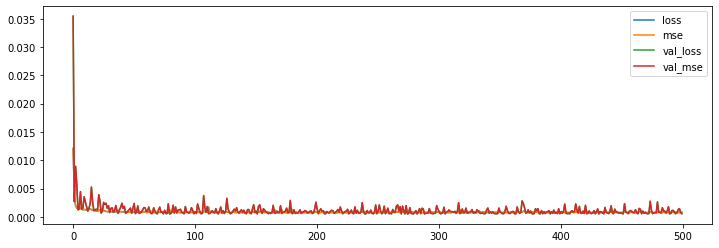

In [ ]:
losses = pd.DataFrame(model_stock.history.history)
losses.plot(figsize=(12,4))

In [ ]:
# make predictions
trainPredict = model_stock.predict(trainX)
testPredict = model_stock.predict(testX)

# Estimate model performance
#SInce we used minmaxscaler we can now use scaler.inverse_transform
#to invert the transformation.

trainPredict = scaler.inverse_transform(trainPredict)
trainY_inverse = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY_inverse = scaler.inverse_transform([testY])

#Training MSE
train_pred_mse = mean_squared_error(trainY_inverse[0], trainPredict[:,0])
print("train pred MSE: ", train_pred_mse)
#Training RMSE
train_pred_rmse = np.sqrt(train_pred_mse)
print("train pred RMSE: ", train_pred_rmse)

#Testing MSE
GRU_pred_mse = mean_squared_error(testY_inverse[0], testPredict[:,0])
print("test pred MSE: ", GRU_pred_mse)
#Testing RMSE
GRU_pred_rmse = np.sqrt(GRU_pred_mse)
print("test pred RMSE: ", GRU_pred_rmse)

1/1 [==============================] - 0s 16ms/step
train pred MSE:  15.769517382755371
train pred RMSE:  3.9710851643795517
test pred MSE:  41.044246949941765
test pred RMSE:  6.406578412065349


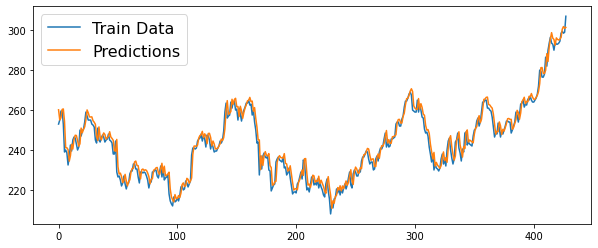

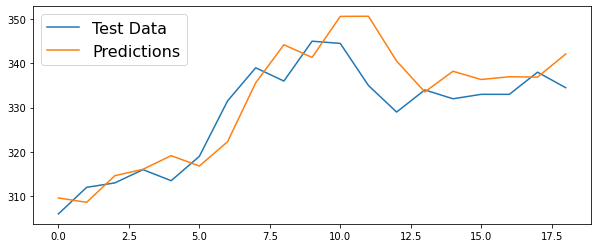

In [ ]:
#Plot Training Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(trainY_inverse[0])
plt.plot(trainPredict[:,0])
plt.legend(('Train Data', 'Predictions'), fontsize=16)

#Plot Data and Predictions
plt.figure(figsize=(10,4))
plt.plot(testY_inverse[0])
plt.plot(testPredict[:,0])
plt.legend(('Test Data', 'Predictions'), fontsize=16)